# 🌦🌡 Weather Forecasting 📈 



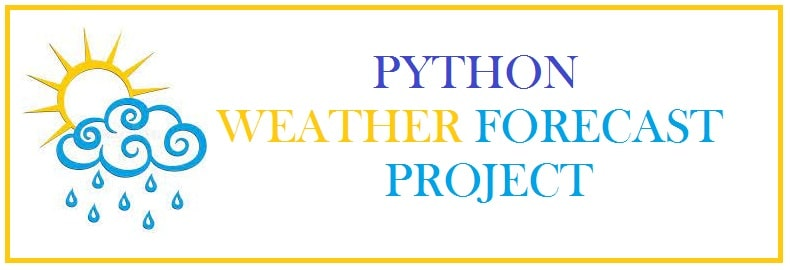

In [1]:
from IPython.display import Image 
Image(filename="Weather.JPG")

##### **About the Dataset**
This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. 

### Perform exploratory data analysis (EDA) and time series forecasting on  weather dataset

## Load the Dataset

#### Import Libraries

In [238]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA


#### Load and Explore the Dataset

In [239]:
df=pd.read_csv(r"temp.csv")


In [240]:
#Setting option to see all the columns.
pd.set_option('display.max_columns', None)

## Basic Overview

In [241]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [242]:
df.shape

(7752, 25)


**Features**
- station - used weather station number: 1 to 25
- Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
- Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
- Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
- LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
- LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
- LDAPSTmaxlapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
- LDAPSTminlapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
- LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
- LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
- LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
- LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
- LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
- LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
- LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
- LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
- LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
- LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
- lat - Latitude (Â°): 37.456 to 37.645
- lon - Longitude (Â°): 126.826 to 127.135
- DEM - Elevation (m): 12.4 to 212.3
- Slope - Slope (Â°): 0.1 to 5.2
- Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
- Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
- Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T  



In [243]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


**Here's what we can conclude from the summary statistics:**

**1.Count:** 
We have a total of 7750 data points for most columns, except for Next_Tmax and Next_Tmin, which have 7725 non-null values. This indicates there are some missing values in these two target variables.

**2.Mean(AVG):**

*Present_Tmax* has an average daily maximum temperature of approximately 29.77°C.

*Present_Tmin* has an average daily minimum temperature of approximately 23.23°C.

*lat and lon* represent the latitude and longitude, respectively.

*DEM (Digital Elevation Model)* has an average value of approximately 126.99.

*Slope* has an average slope value of approximately 61.87.

*Solar radiation* has an average solar radiation value of approximately 1.26.

*Next_Tmax* has an average of approximately 30.27°C.

*Next_Tmin* has an average of approximately 22.93°C.


**3.Standard Deviation (Std):**

The standard deviation provides a measure of the spread or variability in the data.
For example, *Present_Tmax* has a relatively low standard deviation of approximately 2.97, indicating that the daily maximum temperature doesn't vary significantly from day to day.



**4.Min and Max:**

These values represent the minimum and maximum values in each column.
For instance, the minimum value for Present_Tmax is 20°C, while the maximum is 37.6°C.
Similarly, Next_Tmax ranges from 17.4°C to 38.9°C, and Next_Tmin ranges from 11.3°C to 29.8°C.


**Percentiles (25%, 50%, 75%):**

These values provide insight into the data distribution.
For example, the 25th percentile (Q1) for Present_Tmax is 27.8°C, meaning that 25% of the data points have a maximum temperature below this value.
The 50th percentile (Q2) is the median, indicating the middle value of the dataset.
The 75th percentile (Q3) for Present_Tmax is 32.0°C, showing that 75% of the data points have a maximum temperature below this value.








7752 rows , 25 columns

## Drop Columns :

#### The code drops irrelevant columns, simplifying the dataset for weather forecasting.


In [244]:
columns_to_drop = [
    'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse',
    'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3',
    'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4' ,'lat','lon','DEM','Slope' , 'Solar radiation',
    'Next_Tmax','Next_Tmin'
]

df = df.drop(columns=columns_to_drop)


In [245]:
df.head()

,station,Date,Present_Tmax,Present_Tmin
0,1.0,30-06-2013,28.7,21.4
1,2.0,30-06-2013,31.9,21.6
2,3.0,30-06-2013,31.6,23.3
3,4.0,30-06-2013,32.0,23.4
4,5.0,30-06-2013,31.4,21.9


In [246]:
df.index

RangeIndex(start=0, stop=7752, step=1)

In [247]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin'], dtype='object')

In [248]:
df.dtypes

station         float64
Date             object
Present_Tmax    float64
Present_Tmin    float64
dtype: object

#### The 'Date' column is currently in the 'object' format, which may need to be converted to a datetime format for time series analysis

In [249]:
#convert the date to datetime
df['Date'] = pd.to_datetime(df['Date'])


C:\Users\HP User\AppData\Local\Temp\ipykernel_13440\4137411456.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df['Date'] = pd.to_datetime(df['Date'])


#### To check if dates and times are in chronological order:

In [250]:
df.index.is_monotonic_increasing

True

Monotonic order means that the values are either consistently increasing or consistently decreasing (but not both).

In [251]:
df.nunique()

station          25
Date            310
Present_Tmax    167
Present_Tmin    155
dtype: int64

### we can draw several conclusions about our weather dataset:

**Station:** There are 25 unique weather stations in the dataset, indicating data from different geographical locations.

**Temperature Features (Present_Tmax and Present_Tmin):** These features have a reasonable number of unique values, indicating variation in temperature data.


**Date:**
* Only 310 dates are recorded but they should be 1796 dates.
* Huge number of missing dates.

In [252]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       7750 non-null   float64       
 1   Date          7750 non-null   datetime64[ns]
 2   Present_Tmax  7682 non-null   float64       
 3   Present_Tmin  7682 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 242.4 KB


**The DataFrame contains a total of 7,752 entries across 4 columns. However, there are missing values in the dataset. Specifically:**

1. The **'station'** column has 7,750 non-null entries, indicating that there are two missing values in this column.

2. The **'Date'** column has 7,750 non-null entries and is of datetime type, which is suitable for date-time operations.

3. The **'Present_Tmax'** column has 7,682 non-null entries, indicating that there are 70 missing values in this column.

4. The **'Present_Tmin'** column also has 7,682 non-null entries, with 70 missing values.

**Overall, the dataset appears to be relatively complete, with only a small percentage of missing values in the temperature-related columns.**

In [253]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

station          2
Date             2
Present_Tmax    70
Present_Tmin    70
dtype: int64


**Columns with Missing Values:**

'Present_Tmax' and 'Present_Tmin' have 70 missing values each.

'Date' and 'Station' have 2 missing values each.



### **missing dates are not null, they are not recorded on the data.**

In [254]:
ratio_of_missing_dates = (1 - (310 / 1796)) * 100
print('Ratio of missing dates: ',f"{ratio_of_missing_dates:.2f}" , '%')

Ratio of missing dates:  82.74 %


In [255]:
start_date = pd.to_datetime('2013-01-07')
end_date = pd.to_datetime('2017-12-08')

date_range = pd.date_range(start_date, end_date)

missing_dates = date_range.difference(df['Date'])

num_missing_dates = len(missing_dates)

print(f"Number of missing dates: {num_missing_dates}")
print("Missing dates:")

for missing_date in missing_dates:
    print(missing_date)


Number of missing dates: 1487
Missing dates:
2013-01-09 00:00:00
2013-01-10 00:00:00
2013-01-11 00:00:00
2013-01-12 00:00:00
2013-01-13 00:00:00
2013-01-14 00:00:00
2013-01-15 00:00:00
2013-01-16 00:00:00
2013-01-17 00:00:00
2013-01-18 00:00:00
2013-01-19 00:00:00
2013-01-20 00:00:00
2013-01-21 00:00:00
2013-01-22 00:00:00
2013-01-23 00:00:00
2013-01-24 00:00:00
2013-01-25 00:00:00
2013-01-26 00:00:00
2013-01-27 00:00:00
2013-01-28 00:00:00
2013-01-29 00:00:00
2013-01-30 00:00:00
2013-01-31 00:00:00
2013-02-01 00:00:00
2013-02-02 00:00:00
2013-02-03 00:00:00
2013-02-04 00:00:00
2013-02-05 00:00:00
2013-02-06 00:00:00
2013-02-09 00:00:00
2013-02-10 00:00:00
2013-02-11 00:00:00
2013-02-12 00:00:00
2013-02-13 00:00:00
2013-02-14 00:00:00
2013-02-15 00:00:00
2013-02-16 00:00:00
2013-02-17 00:00:00
2013-02-18 00:00:00
2013-02-19 00:00:00
2013-02-20 00:00:00
2013-02-21 00:00:00
2013-02-22 00:00:00
2013-02-23 00:00:00
2013-02-24 00:00:00
2013-02-25 00:00:00
2013-02-26 00:00:00
2013-02-27 00:0

**It appears that missing dates are not represented as null values but are simply not recorded in the data. These missing dates account for a significant portion of the date range, approximately 82.74% of the total period from January 7, 2013, to December 8, 2017. There are a total of 1487 missing dates within this period, which may require further investigation or handling if necessary for analysis or modeling purposes.**

### **Now we want to see if the missing dates are from specific periods or randomly.**

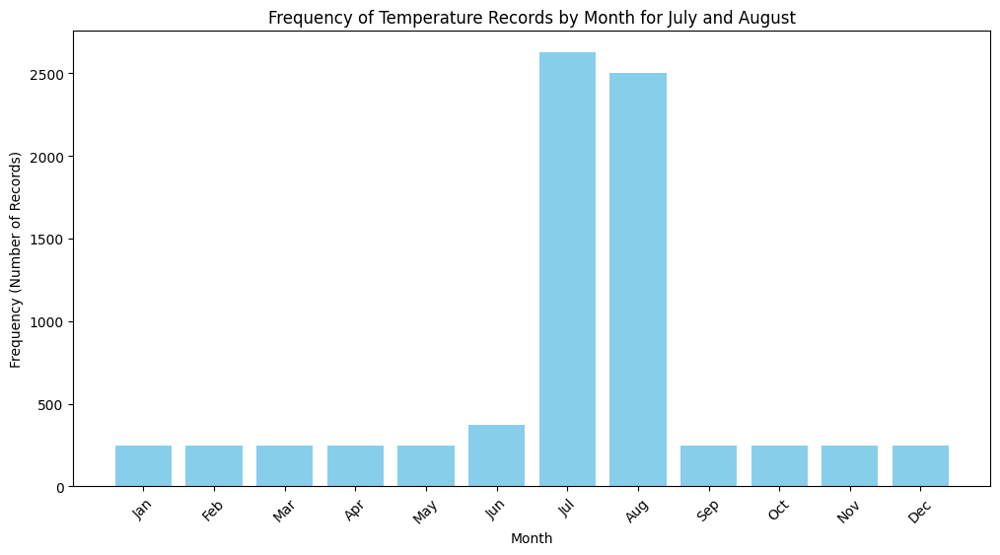

In [256]:
# Calculate the count of records for each month
month_counts = df['Date'].dt.month.value_counts().sort_index()

# Define month names for labeling the x-axis
month_names = [
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
]

# Create a bar plot to show the frequency of records for each month
plt.figure(figsize=(12, 6))
plt.bar(month_names, month_counts, color='skyblue')
plt.xlabel('Month')
plt.ylabel('Frequency (Number of Records)')
plt.title('Frequency of Temperature Records by Month for July and August')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()



#### As shown in the plot the recorded months mostly just for July and August,the entire monthst here are a lot of recordes missed from the entire months.

#### Since we have no other choice we will continue working on this data but only for July and August. It will be a prototype model to predict temperatures but for now just for July and August. Because collecting data is not that easy :)

In [257]:
# Filter the DataFrame to keep only July (Month == 7) and August (Month == 8) records
df = df[(df['Date'].dt.month == 7) | (df['Date'].dt.month == 8)]


### Check the missing dates on July and August

In [258]:
years = range(2013, 2019)

for year in years:
    # Create a date range for July and August in the current year
    start_date = pd.Timestamp(f'{year}-07-01')
    end_date = pd.Timestamp(f'{year}-08-31')
    date_range = pd.date_range(start_date, end_date)

    # Get the dates in your DataFrame for July and August in the current year
    dates_in_dataframe = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]['Date']

    # Find missing dates by comparing the date range with the dates in the DataFrame
    missing_dates = date_range[~date_range.isin(dates_in_dataframe)]

    print(f"Missing Dates in July and August {year}:")
    print(missing_dates)
    print()


Missing Dates in July and August 2013:
DatetimeIndex(['2013-07-01', '2013-07-02', '2013-07-03', '2013-07-04',
               '2013-07-05', '2013-07-06', '2013-07-09', '2013-07-10',
               '2013-07-11', '2013-07-12', '2013-08-01', '2013-08-02',
               '2013-08-03', '2013-08-04', '2013-08-05', '2013-08-06',
               '2013-08-09', '2013-08-10', '2013-08-11', '2013-08-12',
               '2013-08-31'],
              dtype='datetime64[ns]', freq=None)

Missing Dates in July and August 2014:
DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-09', '2014-07-10',
               '2014-07-11', '2014-07-12', '2014-08-01', '2014-08-02',
               '2014-08-03', '2014-08-04', '2014-08-05', '2014-08-06',
               '2014-08-09', '2014-08-10', '2014-08-11', '2014-08-12',
               '2014-08-31'],
              dtype='datetime64[ns]', freq=None)

Missing Dates in July and August 2015:
DatetimeIndex

#### The missing dates of July and August are regular for each year, but in 2018 all July and August records are missed, so we will exept this year. As a result, we will train our model to predict temperatures in ranges of : (13-7 t0 30-7) & (13-8 to 30-8)

In [259]:
df = df[df['Date'].dt.year != 2018]

In [260]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5125 entries, 175 to 7749
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       5125 non-null   float64       
 1   Date          5125 non-null   datetime64[ns]
 2   Present_Tmax  5090 non-null   float64       
 3   Present_Tmin  5090 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 200.2 KB


**After filtering out the records for the year 2018 and focusing on the dates between July 13th to July 30th and August 13th to August 30th for each year, the DataFrame now contains a total of 5,125 entries across 4 columns. The summary of the DataFrame is as follows:**

1. The **'station'** column has 5,125 non-null entries, indicating that there are no missing values in this column.

2. The **'Date'** column has 5,125 non-null entries and is of datetime type, suitable for date-time operations.

3. The **'Present_Tmax'** column has 5,090 non-null entries, suggesting that there are 35 missing values in this column.

4. The **'Present_Tmin'** column also has 5,090 non-null entries, with 35 missing values.


In [261]:
df.head()

,station,Date,Present_Tmax,Present_Tmin
175,1.0,2013-07-07,25.9,20.1
176,2.0,2013-07-07,28.5,20.9
177,3.0,2013-07-07,28.5,23.0
178,4.0,2013-07-07,28.7,22.6
179,5.0,2013-07-07,30.8,21.8


## **Now let's go a step back to the missing values**
#### **Impute the missing values:**

In [262]:
lags = 1
# Impute missing values for Present_Tmax using lags
df['Present_Tmax'] = df['Present_Tmax'].fillna(df['Present_Tmax'].shift(lags))

# Impute missing values for Present_Tmin using lags
df['Present_Tmin'] = df['Present_Tmin'].fillna(df['Present_Tmin'].shift(lags))               

In [263]:
df.isnull().sum()

station         0
Date            0
Present_Tmax    0
Present_Tmin    0
dtype: int64

In [264]:
df.max()

station                        25.0
Date            2017-08-30 00:00:00
Present_Tmax                   37.5
Present_Tmin                   28.9
dtype: object

In [265]:
df.min()

station                         1.0
Date            2013-07-07 00:00:00
Present_Tmax                   20.0
Present_Tmin                   11.3
dtype: object

**The missing values in the 'Present_Tmax' and 'Present_Tmin' columns have been successfully imputed using lag values of 1. After imputation, there are no more missing values in the dataset**

Here are the observations:

- The 'station' and 'Date' columns were not affected by the imputation process and contain no missing values.
- The 'Present_Tmax' and 'Present_Tmin' columns, which previously had missing values, are now fully imputed, with no missing values remaining.
- The 'Present_Tmax' column has a maximum value of 37.5, indicating the highest recorded maximum temperature in the dataset.
- The 'Present_Tmin' column has a maximum value of 28.9, representing the highest recorded minimum temperature.

Overall, the dataset is now ready for further analysis or modeling with all missing values handled appropriately.

## Data Proccesing:

### Checking for outliers

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1599: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


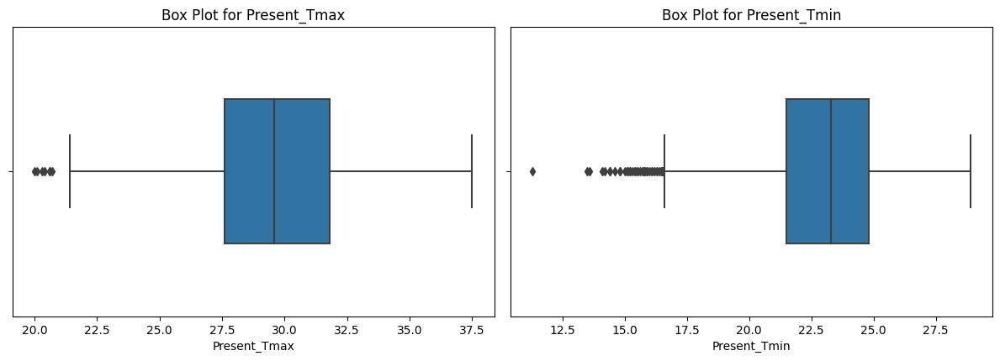

In [266]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of important columns
temp = ['Present_Tmax', 'Present_Tmin']

# Create a box plot for each important column
plt.figure(figsize=(12, 8))
for i, column in enumerate(temp, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[column], orient='vertical', width=0.5)
    plt.title(f'Box Plot for {column}')

plt.tight_layout()
plt.show()


**The code performs outlier detection and visualization for the 'Present_Tmax' and 'Present_Tmin' columns using box plots:**

 The code generates box plots for both 'Present_Tmax' and 'Present_Tmin' columns, allowing us to visually identify the presence of outliers. Outliers are data points that fall significantly below or above the whiskers of the box plot.


In [267]:
Q1 = df['Present_Tmax'].quantile(0.25)
Q3 = df['Present_Tmax'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df[(df['Present_Tmax'] < lower_bound) | (df['Present_Tmax'] > upper_bound)]
outliers

,station,Date,Present_Tmax,Present_Tmin
2675,1.0,2014-08-14,20.6,18.2
2775,1.0,2014-08-18,20.4,17.9
5050,1.0,2016-07-16,20.7,17.8
5075,1.0,2016-07-17,20.6,18.5
6125,1.0,2016-08-28,20.1,15.6
7700,1.0,2017-08-29,20.3,15.7
7725,1.0,2017-08-30,20.0,15.1


In [268]:
Q1 = df['Present_Tmin'].quantile(0.25)
Q3 = df['Present_Tmin'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df[(df['Present_Tmin'] < lower_bound) | (df['Present_Tmin'] > upper_bound)]
outliers

,station,Date,Present_Tmax,Present_Tmin
2150,1.0,2014-07-24,21.7,16.5
3041,17.0,2014-08-28,29.0,16.1
3525,1.0,2015-07-17,24.9,15.8
4591,17.0,2015-08-28,26.6,15.4
4616,17.0,2015-08-29,28.9,16.5
4641,17.0,2015-08-30,29.2,16.5
6100,1.0,2016-08-27,24.9,16.2
6101,2.0,2016-08-27,27.3,13.5
6109,10.0,2016-08-27,27.3,14.8
6115,16.0,2016-08-27,26.6,15.1


**Outlier Detection:**  calculated the lower and upper bounds for outlier detection using the IQR (Interquartile Range) method. Any data points below the lower bound or above the upper bound are considered outliers.

**Outliers Detected:** The code lists and displays the outliers for both 'Present_Tmax' and 'Present_Tmin' columns, showing the station, date, 'Present_Tmax,' and 'Present_Tmin' values for each outlier.



The code performs outlier detection for the 'Present_Tmax' and 'Present_Tmin' columns, which represent the maximum and minimum daily temperatures, respectively. The box plots visually illustrate the distribution of temperature data, making it easy to identify outliers.

For 'Present_Tmax':
- Outliers are detected for specific dates, including August 14, 2014, August 18, 2014, July 16, 2016, and others. These outliers likely indicate extreme weather events or data anomalies where the recorded maximum temperature significantly deviates from the norm.

For 'Present_Tmin':
- Outliers are also observed on various dates, such as July 24, 2014, August 28, 2014, August 27, 2016, and others. Similar to 'Present_Tmax,' these outliers suggest unusual minimum temperatures.

The detection of outliers is a crucial step in data preprocessing for weather forecasting. These outliers may result from various factors, including sensor errors, measurement inaccuracies, or genuine extreme weather conditions.

## **Handling the outliers**

**Handling outliers through Winsorization is a common practice in data preprocessing for time series forecasting**

**Winsorized** mean is a method of averaging that initially replaces the smallest and largest values with the observations closest to them.

Winsorization helps preprocess the data by managing outliers, resulting in a more stable and suitable dataset for building accurate weather forecasting models.


**Winsorization Process:** The code applies Winsorization to the 'Present_Tmax' column within each month group. Winsorization replaces extreme values (outliers) with values at a specified percentile (in this case, the 5th percentile and 95th percentile) within the same month. This technique helps mitigate the impact of outliers on forecasting models.



In [269]:

df.index = pd.to_datetime(df.index)

lower_percentile = 0.05  # Adjust these percentiles as needed
upper_percentile = 0.95

# Create a function to Winsorize a group
def winsorize_group(group):
    lower_bound = group.quantile(lower_percentile)
    upper_bound = group.quantile(upper_percentile)
    return group.clip(lower_bound, upper_bound)

# Apply Winsorizing to the 'Present_Tmin' column within each month group
df['Winsorized_Tmin'] = df.groupby(df.index.month)['Present_Tmin'].transform(winsorize_group)

# Apply Winsorizing to the 'Present_Tmax' column within each month group
df['Winsorized_Tmax'] = df.groupby(df.index.month)['Present_Tmax'].transform(winsorize_group)

# Print the DataFrame with Winsorized 'Present_Tmin' and 'Present_Tmax' values
print(df[['Present_Tmin', 'Winsorized_Tmin', 'Present_Tmax', 'Winsorized_Tmax']])



                               Present_Tmin  Winsorized_Tmin  Present_Tmax  \
1970-01-01 00:00:00.000000175          20.1             20.1          25.9   
1970-01-01 00:00:00.000000176          20.9             20.9          28.5   
1970-01-01 00:00:00.000000177          23.0             23.0          28.5   
1970-01-01 00:00:00.000000178          22.6             22.6          28.7   
1970-01-01 00:00:00.000000179          21.8             21.8          30.8   
...                                     ...              ...           ...   
1970-01-01 00:00:00.000007745          17.8             18.9          23.1   
1970-01-01 00:00:00.000007746          17.4             18.9          22.5   
1970-01-01 00:00:00.000007747          17.1             18.9          23.3   
1970-01-01 00:00:00.000007748          17.7             18.9          23.3   
1970-01-01 00:00:00.000007749          17.4             18.9          23.2   

                               Winsorized_Tmax  
1970-01-01 00:

**The Winsorizing technique** has successfully removed extreme values from the 'Present_Tmin' and 'Present_Tmax' columns, ensuring a more robust dataset for temperature forecasting, which may lead to more reliable temperature predictions.

In [270]:
# Drop the original 'Present_Tmin' and 'Present_Tmax' columns
df.drop(['Present_Tmin', 'Present_Tmax'], axis=1, inplace=True)

# Rename the 'Winsorized' columns to their original names
df.rename(columns={'Winsorized_Tmin': 'Present_Tmin', 'Winsorized_Tmax': 'Present_Tmax'}, inplace=True)
df.head()

,station,Date,Present_Tmin,Present_Tmax
1970-01-01 00:00:00.000000175,1.0,2013-07-07,20.1,25.9
1970-01-01 00:00:00.000000176,2.0,2013-07-07,20.9,28.5
1970-01-01 00:00:00.000000177,3.0,2013-07-07,23.0,28.5
1970-01-01 00:00:00.000000178,4.0,2013-07-07,22.6,28.7
1970-01-01 00:00:00.000000179,5.0,2013-07-07,21.8,30.8


The original 'Present_Tmin' and 'Present_Tmax' columns have been replaced with their Winsorized versions, ensuring that extreme values are mitigated while maintaining the same column names for consistency in the dataset.

### Since our data records for min and max temperatures we want to split it into two parts: df_Tmax & df_Tmin

In [271]:
# Set the 'Date' column as the index
df.set_index('Date', inplace=True)
df.sort_index(inplace=True)
df['station'] = pd.Categorical(df['station'])

# Split the data into two separate DataFrames
df_Tmax = df[['station', 'Present_Tmax']].copy()
df_Tmin = df[['station', 'Present_Tmin']].copy()


# Group the DataFrames by 'station'
df_Tmax.groupby('station')
df_Tmin.groupby('station')


In [272]:
df.head()

,station,Present_Tmin,Present_Tmax
Date,,,
2013-07-07,1.0,20.1,25.9
2013-07-07,25.0,22.9,29.3
2013-07-07,24.0,22.8,29.4
2013-07-07,23.0,22.7,29.4
2013-07-07,22.0,22.9,29.1


In [273]:
df_Tmax.head()

,station,Present_Tmax
Date,,
2013-07-07,1.0,25.9
2013-07-07,25.0,29.3
2013-07-07,24.0,29.4
2013-07-07,23.0,29.4
2013-07-07,22.0,29.1


In [274]:
df_Tmin.head()

,station,Present_Tmin
Date,,
2013-07-07,1.0,20.1
2013-07-07,25.0,22.9
2013-07-07,24.0,22.8
2013-07-07,23.0,22.7
2013-07-07,22.0,22.9


### Now we want to see the stations that we have in our data, to put each station in different data frame.

In [275]:
df['station'].unique()

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\lib\pretty.py:778: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  output = repr(obj)


[1.0, 25.0, 24.0, 23.0, 22.0, ..., 8.0, 9.0, 10.0, 11.0, 7.0]
Length: 25
Categories (25, float64): [1.0, 2.0, 3.0, 4.0, ..., 22.0, 23.0, 24.0, 25.0]

The unique stations in the data are represented by a range of float values from 1.0 to 25.0, which appear to be categorical labels for different weather stations in the dataset. These stations can be separated into individual dataframes for further modeling.

## Check stationarity for each station:

### For dt_Tmax :

In [276]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
import numpy as np
import datetime

Station 1.0:
ADF Statistic: -6.718379328963036
p-value: 3.534124312662631e-09
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


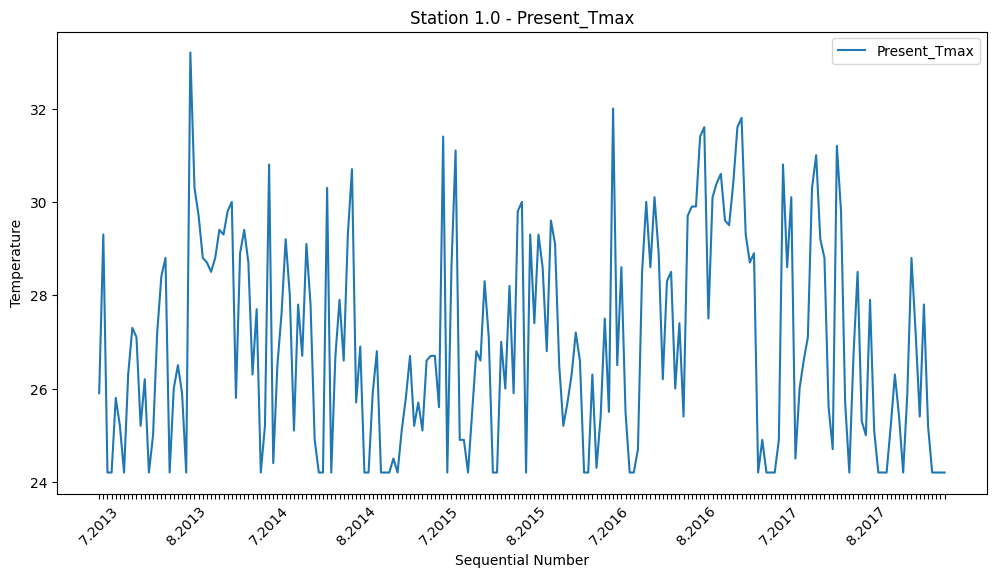

Station 2.0:
ADF Statistic: -8.99595147993627
p-value: 6.694266958443966e-15
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


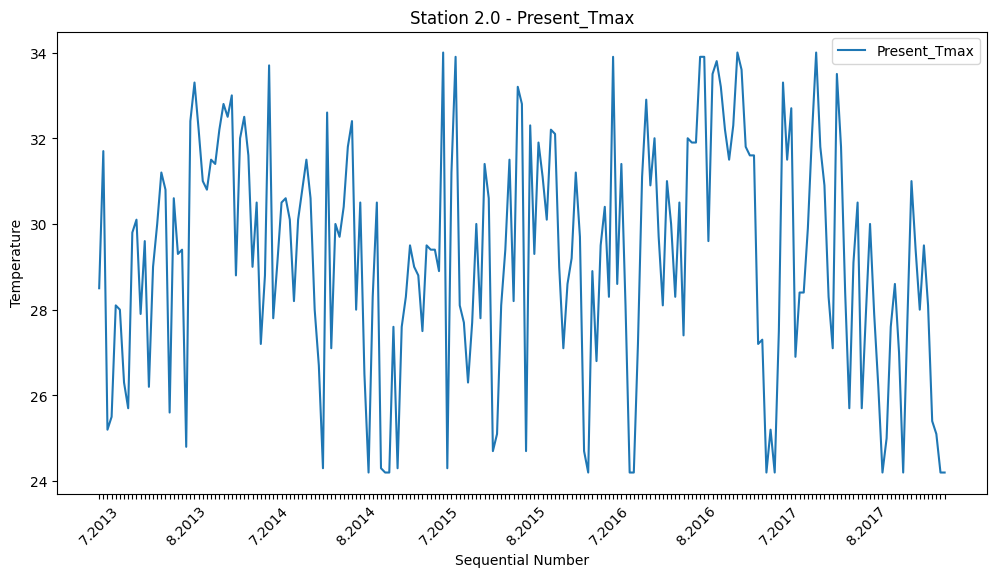

Station 3.0:
ADF Statistic: -5.06962073987206
p-value: 1.613090180099368e-05
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


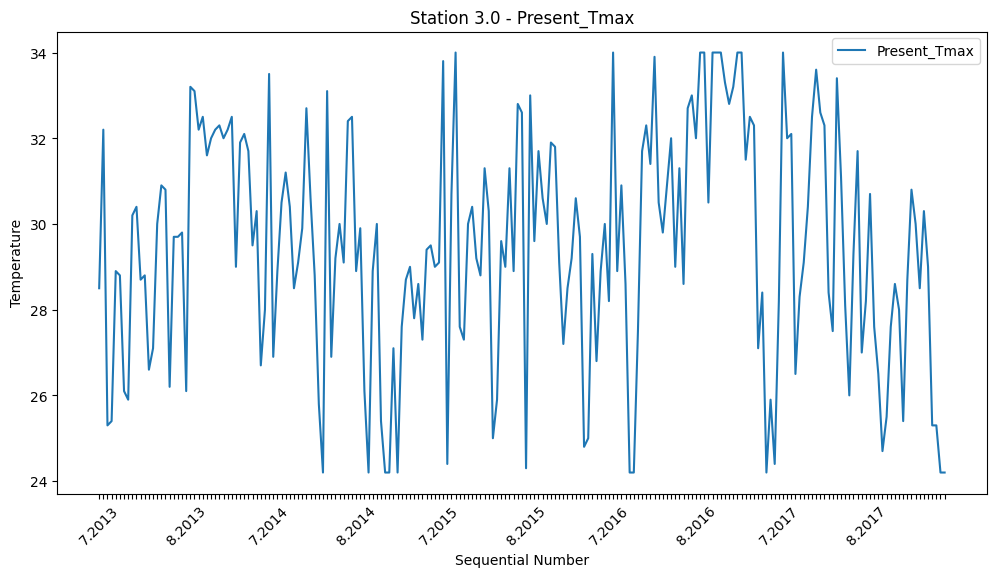

Station 4.0:
ADF Statistic: -8.670820251266543
p-value: 4.5515881347263975e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


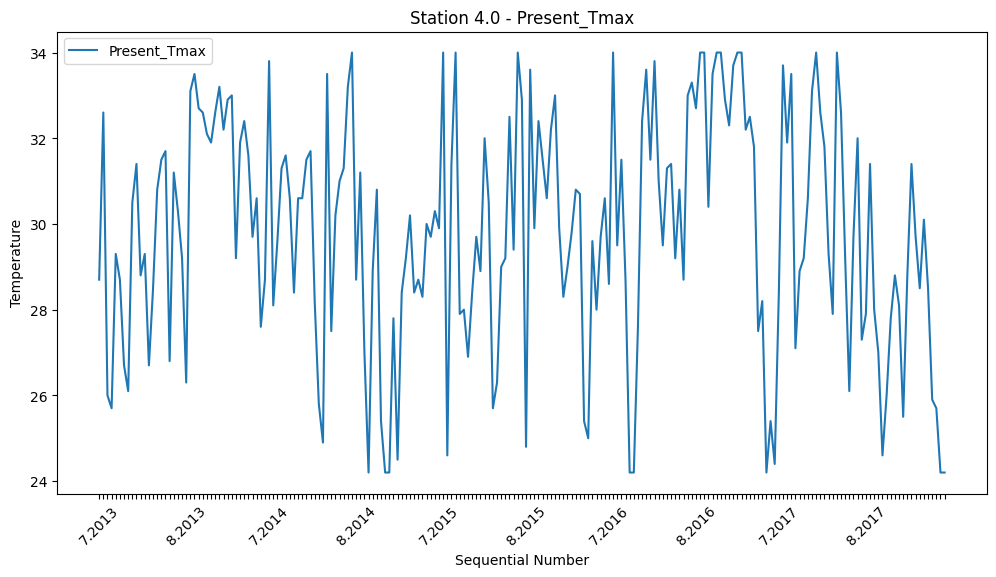

Station 5.0:
ADF Statistic: -4.860972684622656
p-value: 4.15164113996589e-05
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


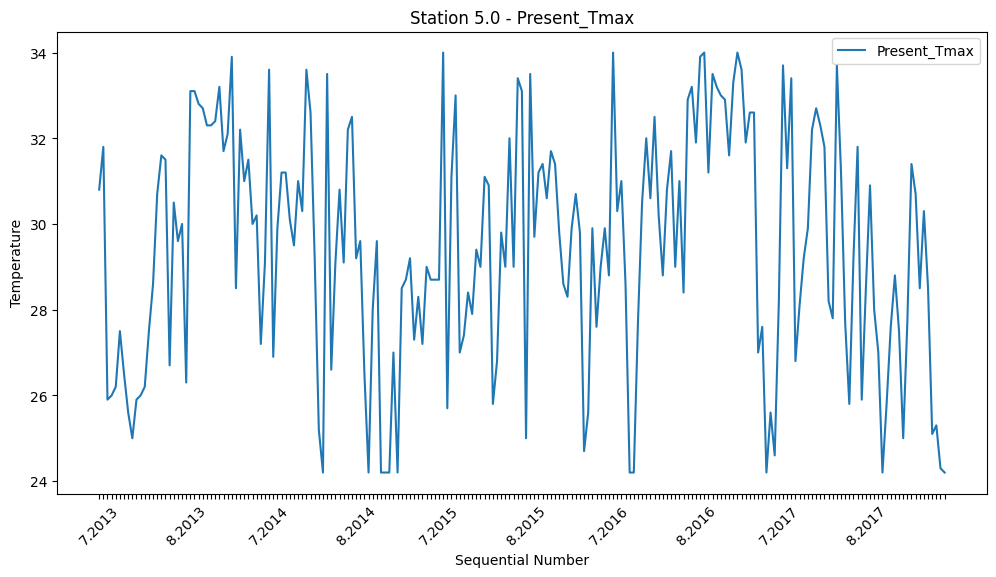

Station 6.0:
ADF Statistic: -8.604764714628626
p-value: 6.718825990539609e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


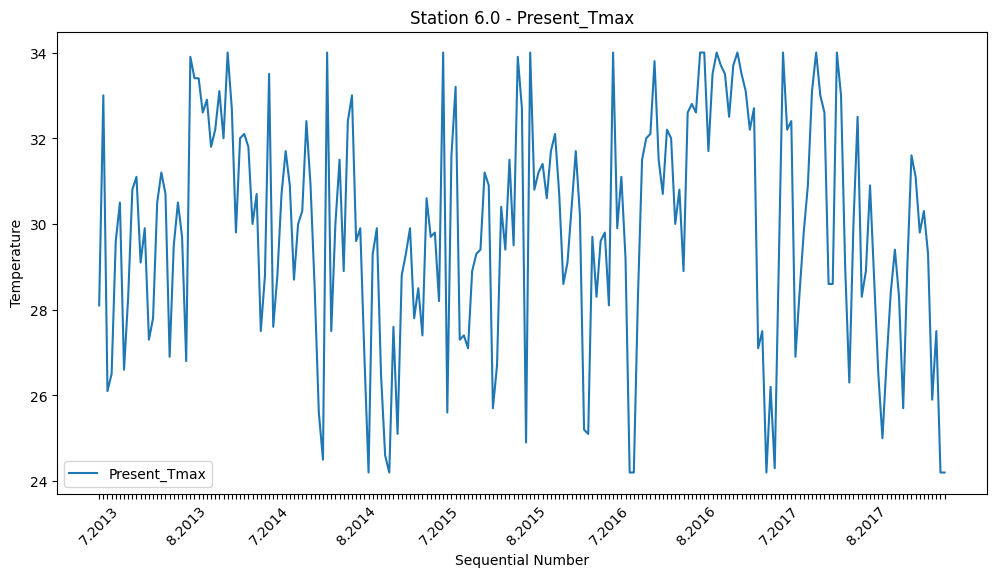

Station 7.0:
ADF Statistic: -8.637643160661398
p-value: 5.5349699168178824e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


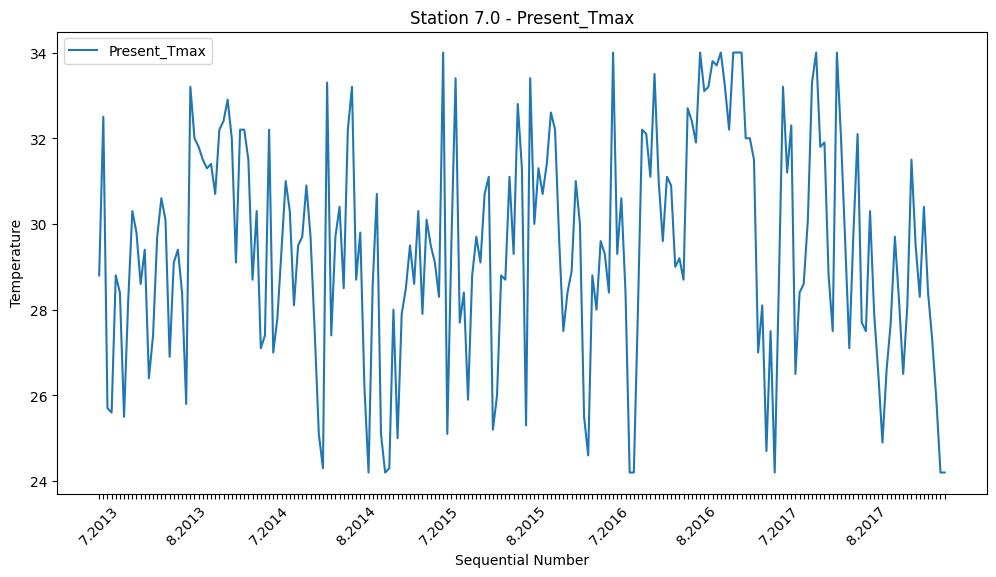

Station 8.0:
ADF Statistic: -5.1529035112550226
p-value: 1.0962366174728005e-05
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


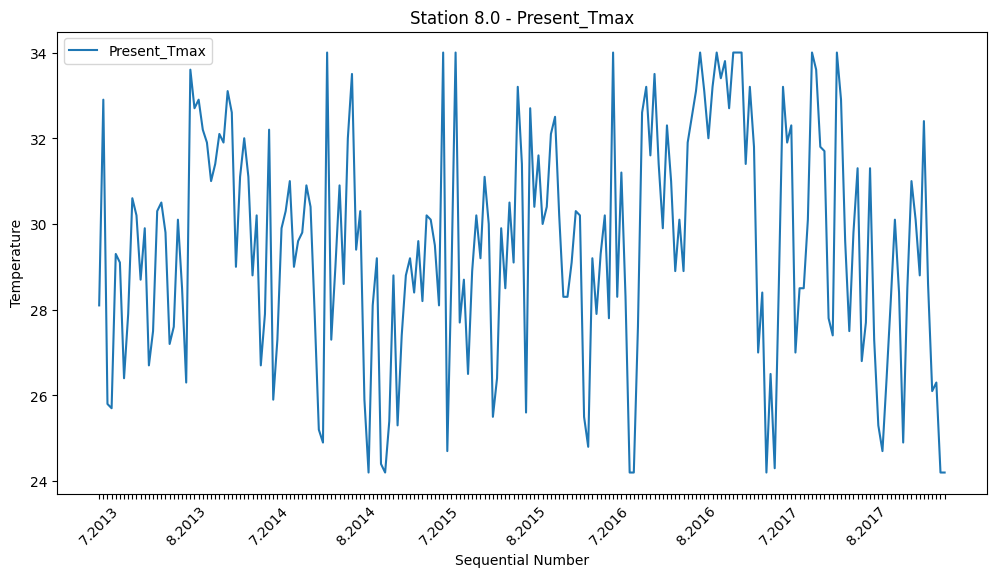

Station 9.0:
ADF Statistic: -5.227066082250846
p-value: 7.739699723544362e-06
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


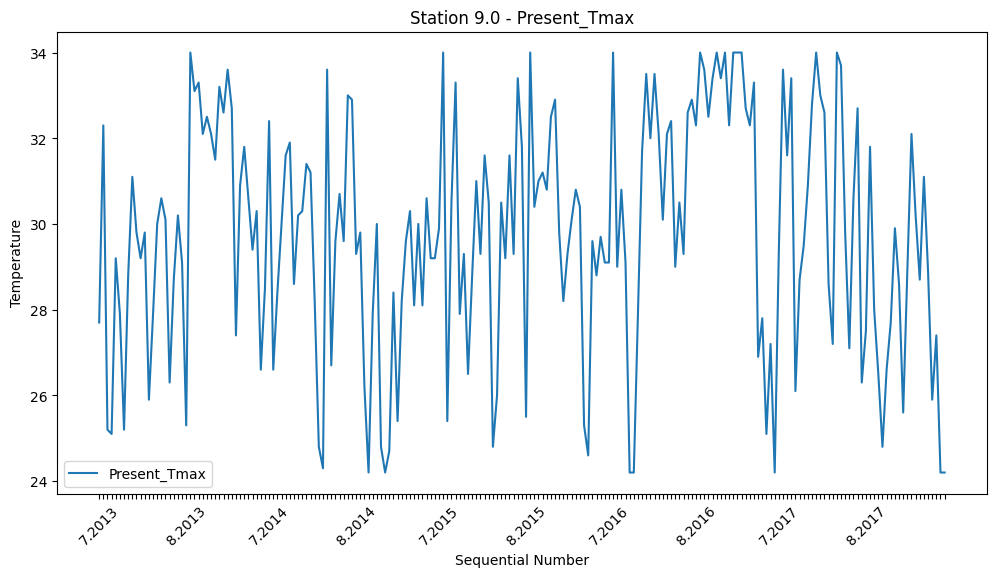

Station 10.0:
ADF Statistic: -5.209733980073069
p-value: 8.398562824706252e-06
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


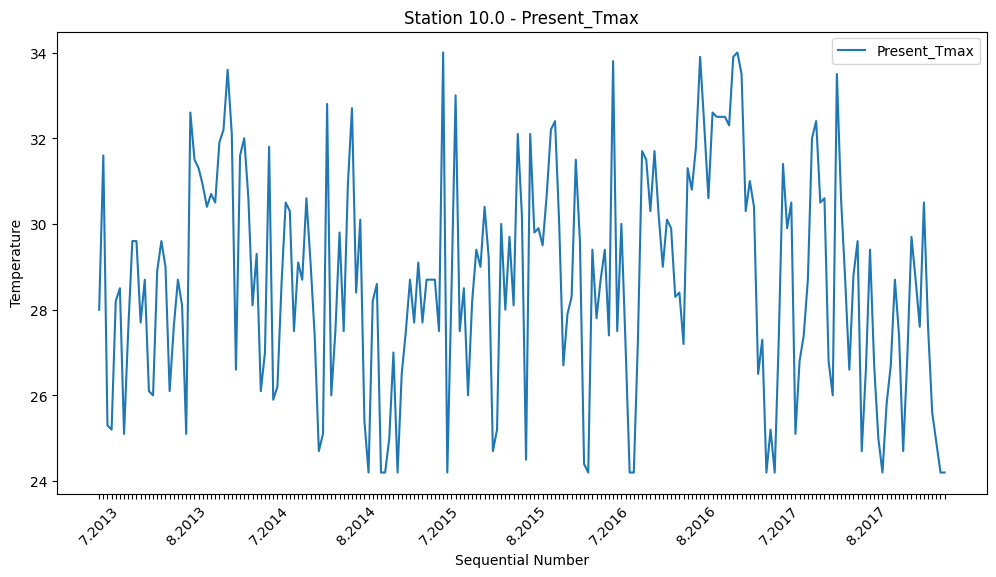

Station 11.0:
ADF Statistic: -8.664600762838043
p-value: 4.721597974647153e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


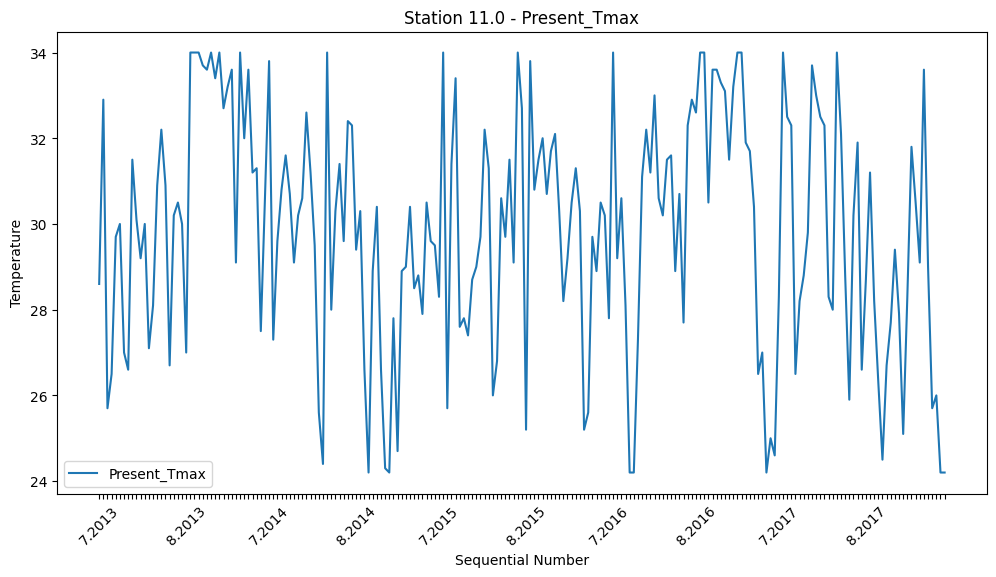

Station 12.0:
ADF Statistic: -5.26568512653443
p-value: 6.446772042920812e-06
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


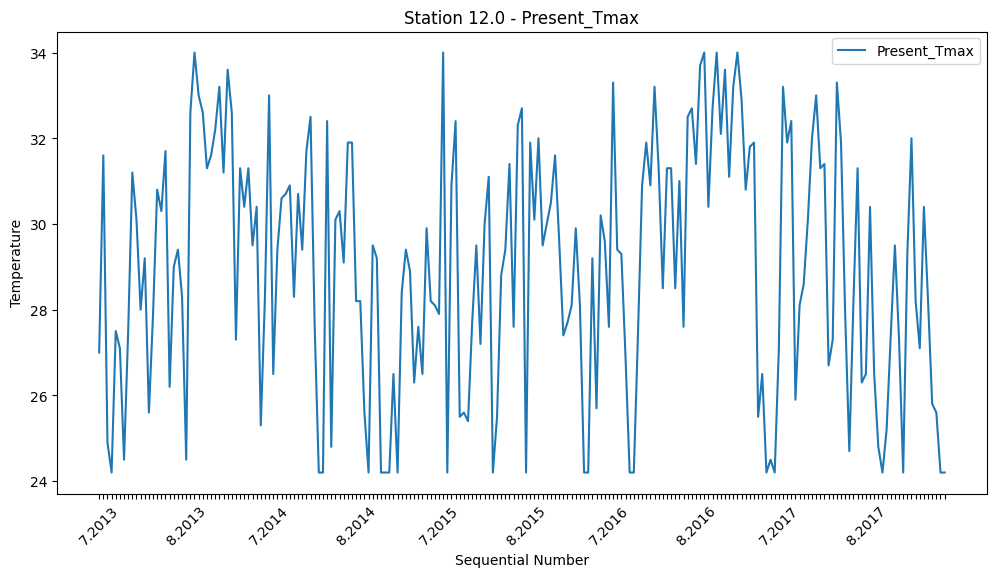

Station 13.0:
ADF Statistic: -8.967129875123463
p-value: 7.933373099590424e-15
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


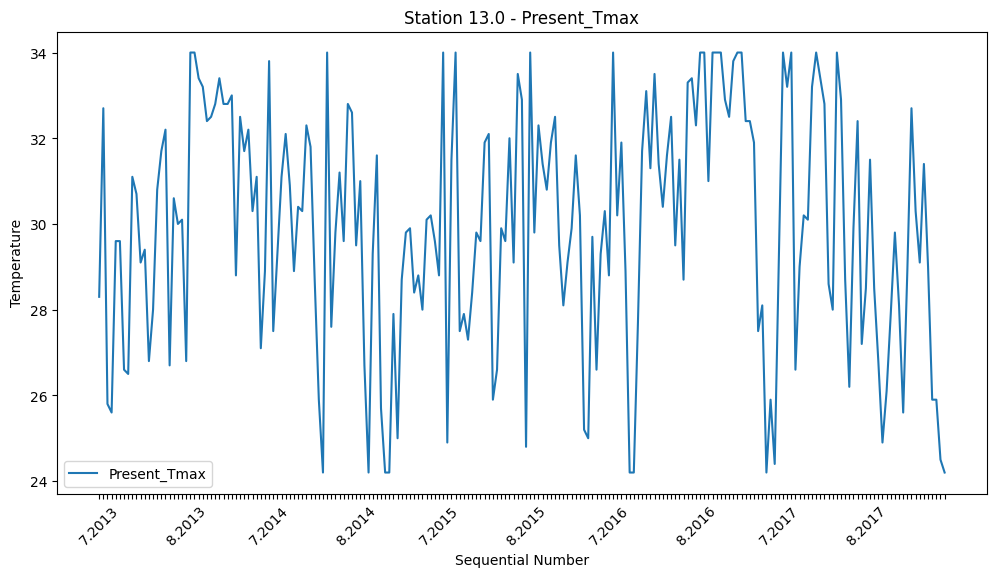

Station 14.0:
ADF Statistic: -5.115017054373674
p-value: 1.3076321361158506e-05
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


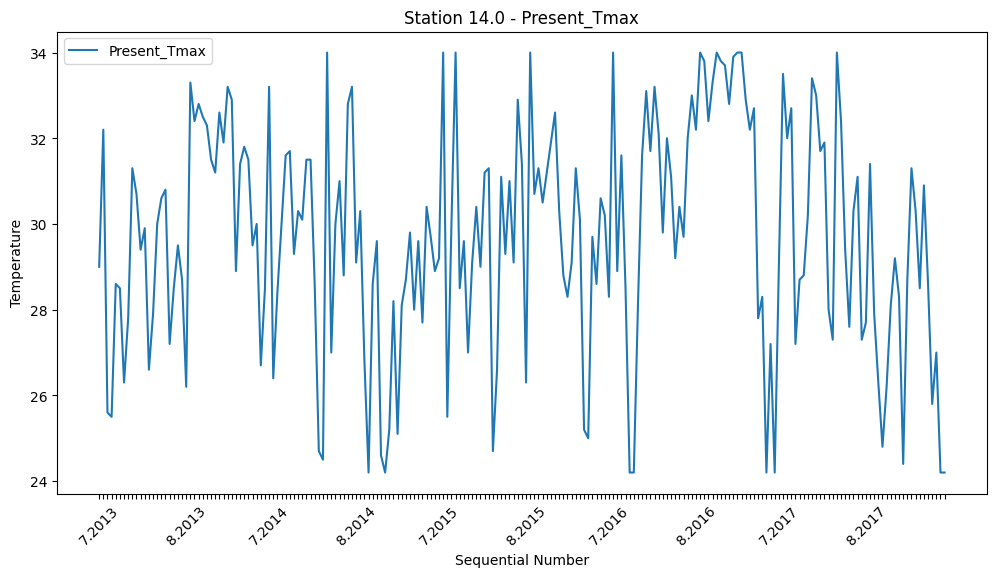

Station 15.0:
ADF Statistic: -8.794665263970602
p-value: 2.192858004119943e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


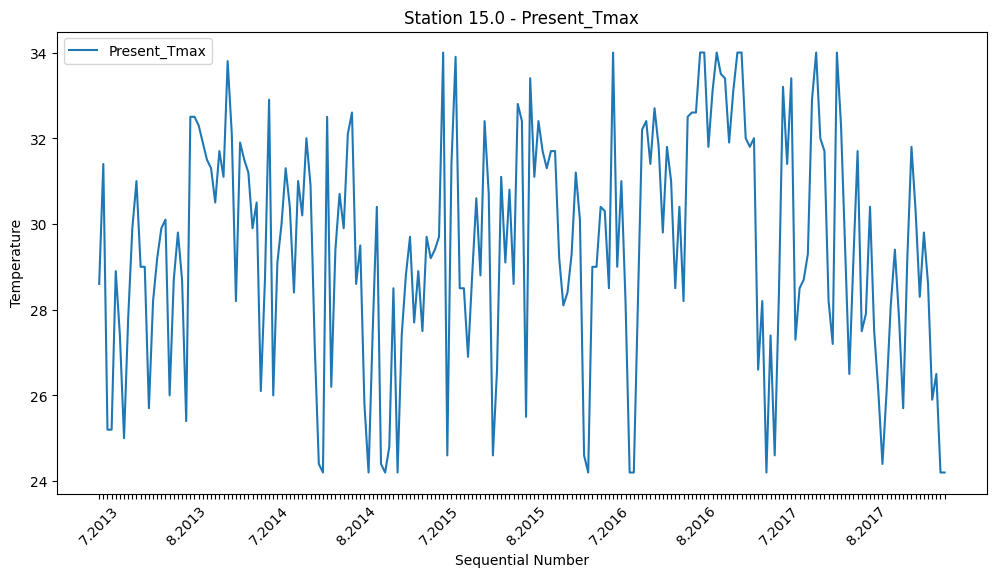

Station 16.0:
ADF Statistic: -5.252832566892933
p-value: 6.851888895344154e-06
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


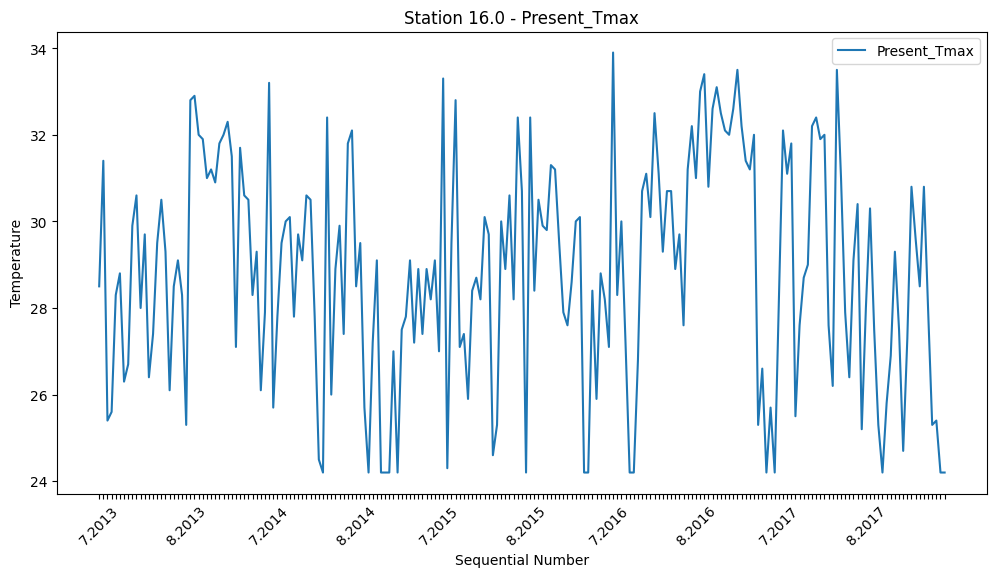

Station 17.0:
ADF Statistic: -6.74922254335731
p-value: 2.9804704063792358e-09
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


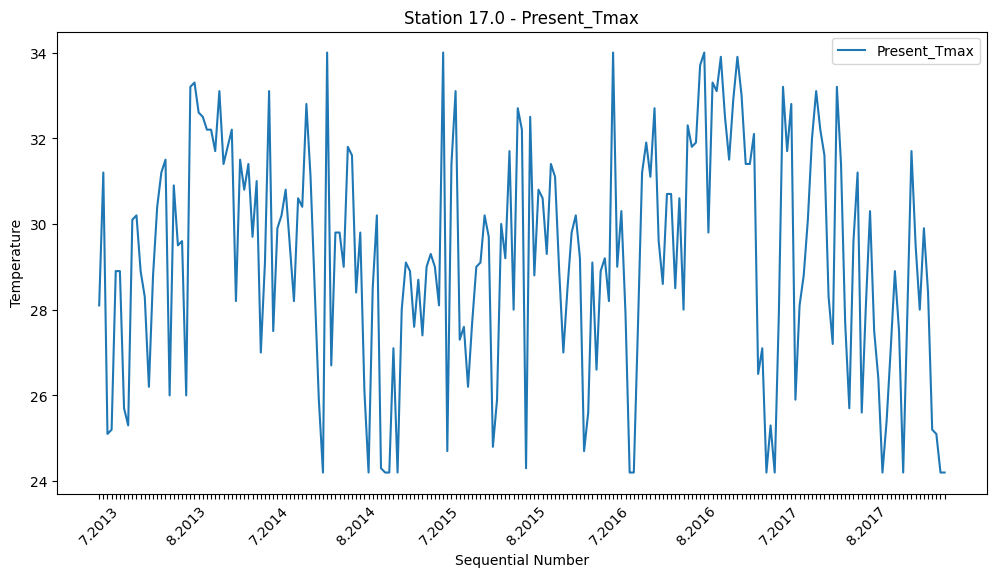

Station 18.0:
ADF Statistic: -8.775417909345398
p-value: 2.456412051735324e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


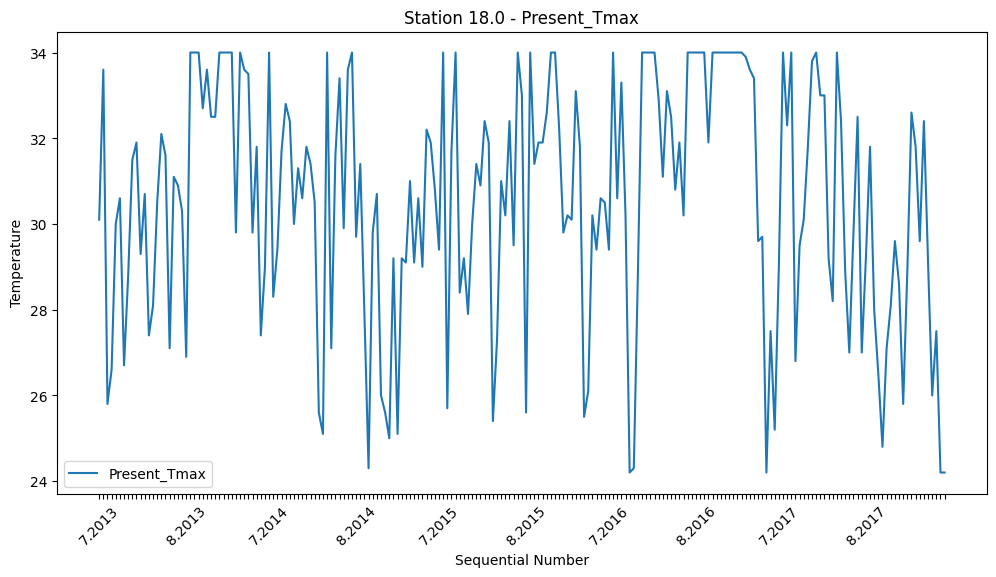

Station 19.0:
ADF Statistic: -5.149921608311816
p-value: 1.1115981052722403e-05
Critical Values:
1%: -3.4631437906252636
5%: -2.8759570379821047
10%: -2.574454682874228
Stationary (Reject null hypothesis)


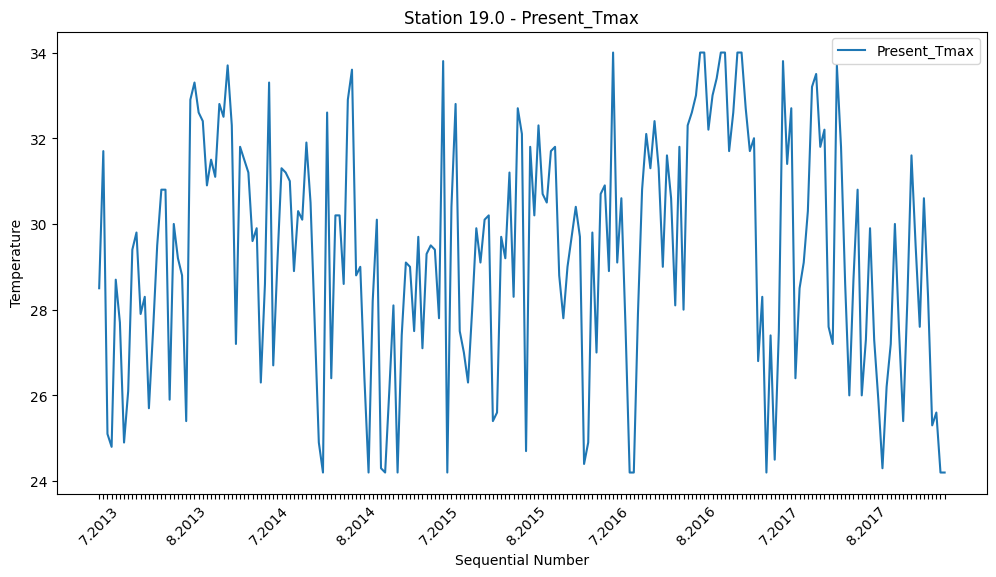

Station 20.0:
ADF Statistic: -8.686453273429306
p-value: 4.1507917309327785e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


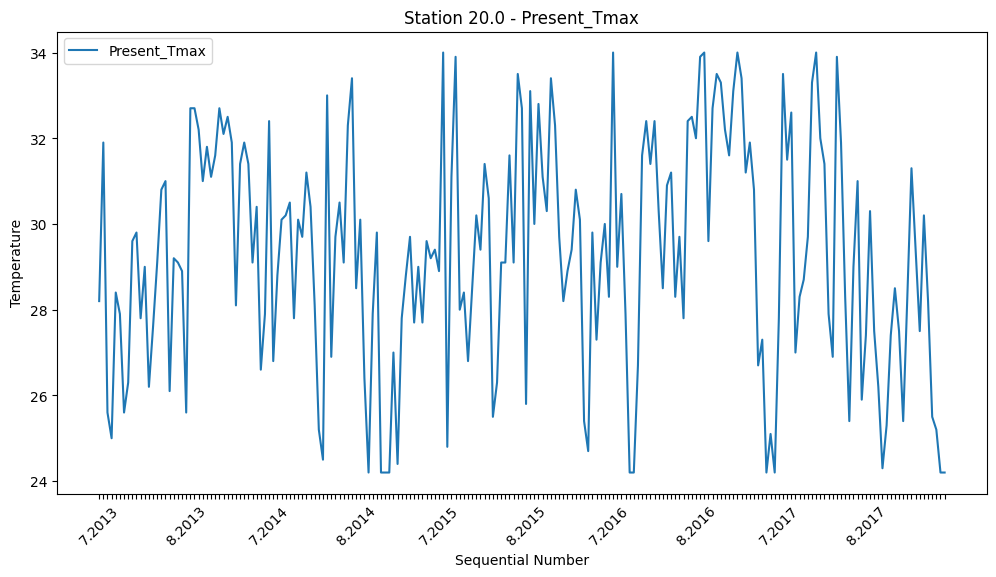

Station 21.0:
ADF Statistic: -8.688450977425141
p-value: 4.1021851588786165e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


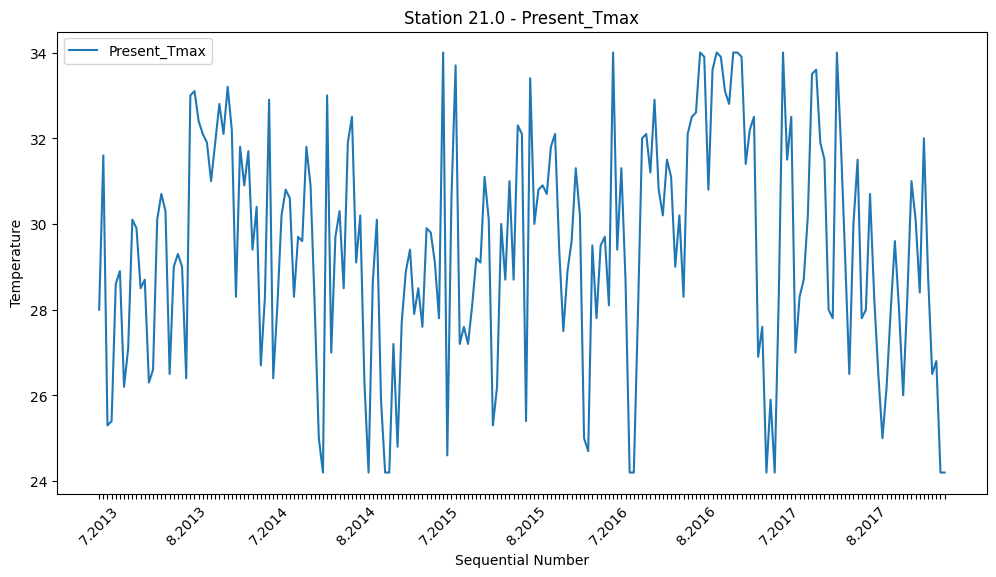

Station 22.0:
ADF Statistic: -6.635771801904487
p-value: 5.567809754912639e-09
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


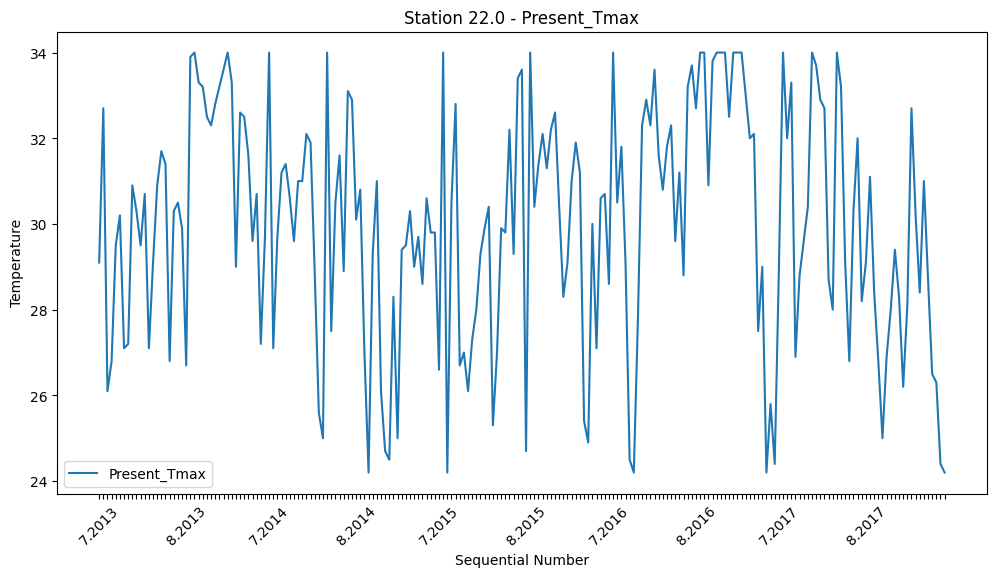

Station 23.0:
ADF Statistic: -8.471527868675329
p-value: 1.47321112730413e-13
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


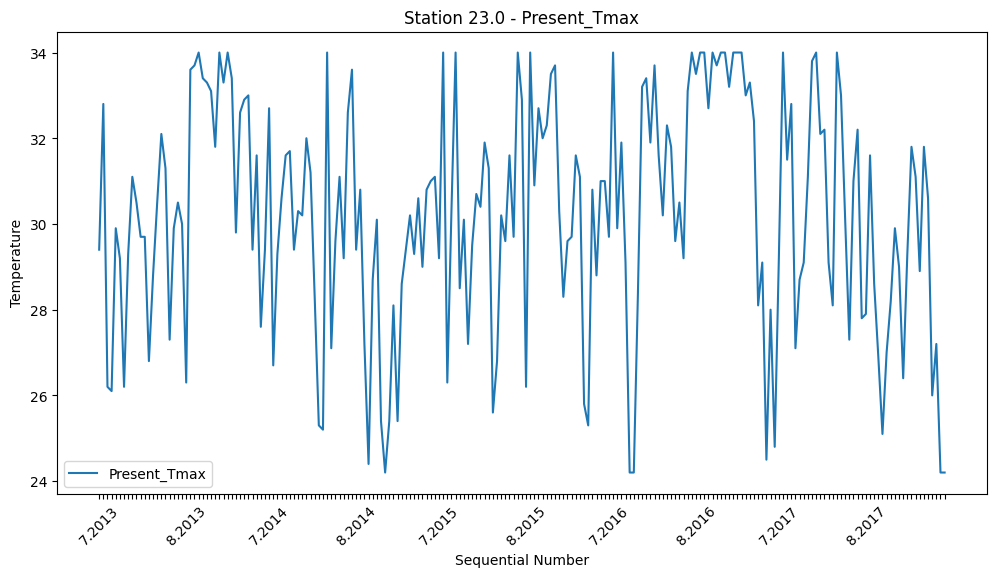

Station 24.0:
ADF Statistic: -8.622266254782895
p-value: 6.06018435652085e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


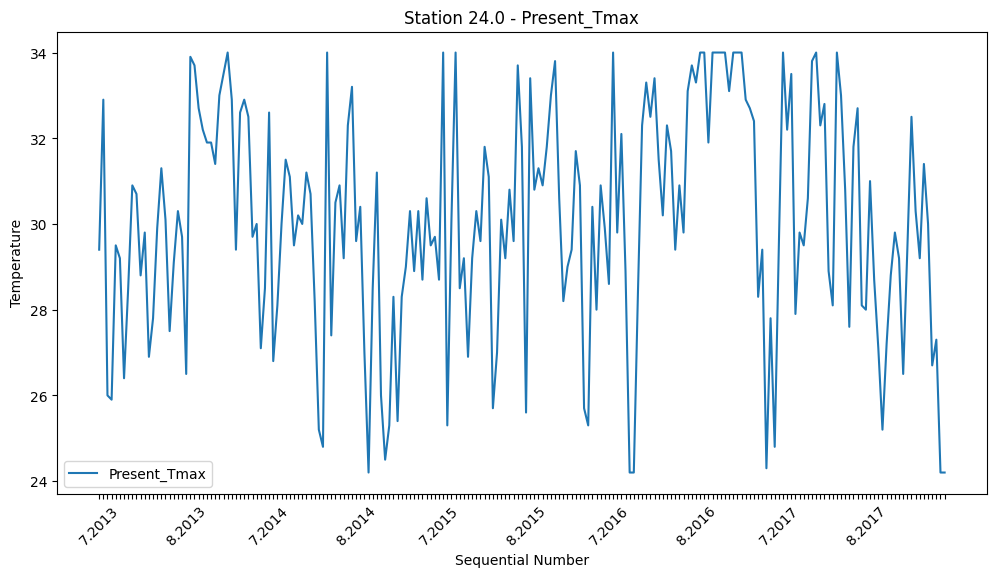

Station 25.0:
ADF Statistic: -8.589491250897712
p-value: 7.351802287434696e-14
Critical Values:
1%: -3.462818103072159
5%: -2.8758145932936805
10%: -2.574378674548251
Stationary (Reject null hypothesis)


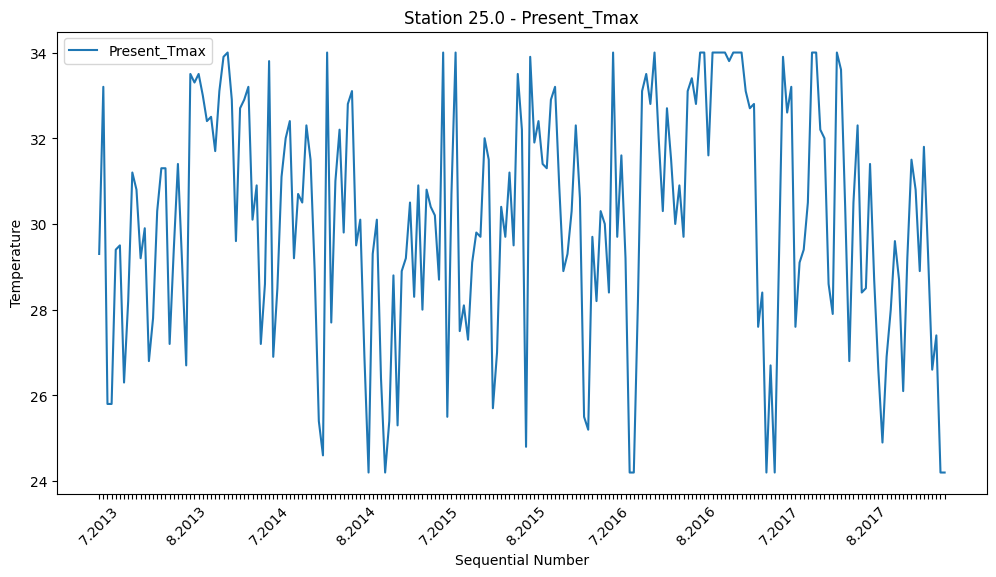

In [277]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
import numpy as np
import datetime

date_index = [
    datetime.date(2013, 7, 7), datetime.date(2013, 7, 8), datetime.date(2013, 7, 13),
    datetime.date(2013, 7, 14), datetime.date(2013, 7, 15), datetime.date(2013, 7, 16),
    datetime.date(2013, 7, 17), datetime.date(2013, 7, 18), datetime.date(2013, 7, 19),
    datetime.date(2013, 7, 20), datetime.date(2013, 7, 21), datetime.date(2013, 7, 22),
    datetime.date(2013, 7, 23), datetime.date(2013, 7, 24), datetime.date(2013, 7, 25),
    datetime.date(2013, 7, 26), datetime.date(2013, 7, 27), datetime.date(2013, 7, 28),
    datetime.date(2013, 7, 29), datetime.date(2013, 7, 30), datetime.date(2013, 7, 31),
    datetime.date(2013, 8, 7), datetime.date(2013, 8, 8), datetime.date(2013, 8, 13),
    datetime.date(2013, 8, 14), datetime.date(2013, 8, 15), datetime.date(2013, 8, 16),
    datetime.date(2013, 8, 17), datetime.date(2013, 8, 18), datetime.date(2013, 8, 19),
    datetime.date(2013, 8, 20), datetime.date(2013, 8, 21), datetime.date(2013, 8, 22),
    datetime.date(2013, 8, 23), datetime.date(2013, 8, 24), datetime.date(2013, 8, 25),
    datetime.date(2013, 8, 26), datetime.date(2013, 8, 27), datetime.date(2013, 8, 28),
    datetime.date(2013, 8, 29), datetime.date(2013, 8, 30), datetime.date(2014, 7, 7),
    datetime.date(2014, 7, 8), datetime.date(2014, 7, 13), datetime.date(2014, 7, 14),
    datetime.date(2014, 7, 15), datetime.date(2014, 7, 16), datetime.date(2014, 7, 17),
    datetime.date(2014, 7, 18), datetime.date(2014, 7, 19), datetime.date(2014, 7, 20),
    datetime.date(2014, 7, 21), datetime.date(2014, 7, 22), datetime.date(2014, 7, 23),
    datetime.date(2014, 7, 24), datetime.date(2014, 7, 25), datetime.date(2014, 7, 26),
    datetime.date(2014, 7, 27), datetime.date(2014, 7, 28), datetime.date(2014, 7, 29),
    datetime.date(2014, 7, 30), datetime.date(2014, 7, 31), datetime.date(2014, 8, 7),
    datetime.date(2014, 8, 8), datetime.date(2014, 8, 13), datetime.date(2014, 8, 14),
    datetime.date(2014, 8, 15), datetime.date(2014, 8, 16), datetime.date(2014, 8, 17),
    datetime.date(2014, 8, 18), datetime.date(2014, 8, 19), datetime.date(2014, 8, 20),
    datetime.date(2014, 8, 21), datetime.date(2014, 8, 22), datetime.date(2014, 8, 23),
    datetime.date(2014, 8, 24), datetime.date(2014, 8, 25), datetime.date(2014, 8, 26),
    datetime.date(2014, 8, 27), datetime.date(2014, 8, 28), datetime.date(2014, 8, 29),
    datetime.date(2014, 8, 30), datetime.date(2015, 7, 7), datetime.date(2015, 7, 8),
    datetime.date(2015, 7, 13), datetime.date(2015, 7, 14), datetime.date(2015, 7, 15),
    datetime.date(2015, 7, 16), datetime.date(2015, 7, 17), datetime.date(2015, 7, 18),
    datetime.date(2015, 7, 19), datetime.date(2015, 7, 20), datetime.date(2015, 7, 21),
    datetime.date(2015, 7, 22), datetime.date(2015, 7, 23), datetime.date(2015, 7, 24),
    datetime.date(2015, 7, 25), datetime.date(2015, 7, 26), datetime.date(2015, 7, 27),
    datetime.date(2015, 7, 28), datetime.date(2015, 7, 29), datetime.date(2015, 7, 30),
    datetime.date(2015, 7, 31), datetime.date(2015, 8, 7), datetime.date(2015, 8, 8),
    datetime.date(2015, 8, 13), datetime.date(2015, 8, 14), datetime.date(2015, 8, 15),
    datetime.date(2015, 8, 16), datetime.date(2015, 8, 17), datetime.date(2015, 8, 18),
    datetime.date(2015, 8, 19), datetime.date(2015, 8, 20), datetime.date(2015, 8, 21),
    datetime.date(2015, 8, 22), datetime.date(2015, 8, 23), datetime.date(2015, 8, 24),
    datetime.date(2015, 8, 25), datetime.date(2015, 8, 26), datetime.date(2015, 8, 27),
    datetime.date(2015, 8, 28), datetime.date(2015, 8, 29), datetime.date(2015, 8, 30),
    datetime.date(2016, 7, 7), datetime.date(2016, 7, 8), datetime.date(2016, 7, 13),
    datetime.date(2016, 7, 14), datetime.date(2016, 7, 15), datetime.date(2016, 7, 16),
    datetime.date(2016, 7, 17), datetime.date(2016, 7, 18), datetime.date(2016, 7, 19),
    datetime.date(2016, 7, 20), datetime.date(2016, 7, 21), datetime.date(2016, 7, 22),
    datetime.date(2016, 7, 23), datetime.date(2016, 7, 24), datetime.date(2016, 7, 25),
    datetime.date(2016, 7, 26), datetime.date(2016, 7, 27), datetime.date(2016, 7, 28),
    datetime.date(2016, 7, 29), datetime.date(2016, 7, 30), datetime.date(2016, 7, 31),
    datetime.date(2016, 8, 7), datetime.date(2016, 8, 8), datetime.date(2016, 8, 13),
    datetime.date(2016, 8, 14), datetime.date(2016, 8, 15), datetime.date(2016, 8, 16),
    datetime.date(2016, 8, 17), datetime.date(2016, 8, 18), datetime.date(2016, 8, 19),
    datetime.date(2016, 8, 20), datetime.date(2016, 8, 21), datetime.date(2016, 8, 22),
    datetime.date(2016, 8, 23), datetime.date(2016, 8, 24), datetime.date(2016, 8, 25),
    datetime.date(2016, 8, 26), datetime.date(2016, 8, 27), datetime.date(2016, 8, 28),
    datetime.date(2016, 8, 29), datetime.date(2016, 8, 30), datetime.date(2017, 7, 7),
    datetime.date(2017, 7, 8), datetime.date(2017, 7, 13), datetime.date(2017, 7, 14),
    datetime.date(2017, 7, 15), datetime.date(2017, 7, 16), datetime.date(2017, 7, 17),
    datetime.date(2017, 7, 18), datetime.date(2017, 7, 19), datetime.date(2017, 7, 20),
    datetime.date(2017, 7, 21), datetime.date(2017, 7, 22), datetime.date(2017, 7, 23),
    datetime.date(2017, 7, 24), datetime.date(2017, 7, 25), datetime.date(2017, 7, 26),
    datetime.date(2017, 7, 27), datetime.date(2017, 7, 28), datetime.date(2017, 7, 29),
    datetime.date(2017, 7, 30), datetime.date(2017, 7, 31), datetime.date(2017, 8, 7),
    datetime.date(2017, 8, 8), datetime.date(2017, 8, 13), datetime.date(2017, 8, 14),
    datetime.date(2017, 8, 15), datetime.date(2017, 8, 16), datetime.date(2017, 8, 17),
    datetime.date(2017, 8, 18), datetime.date(2017, 8, 19), datetime.date(2017, 8, 20),
    datetime.date(2017, 8, 21), datetime.date(2017, 8, 22), datetime.date(2017, 8, 23),
    datetime.date(2017, 8, 24), datetime.date(2017, 8, 25), datetime.date(2017, 8, 26),
    datetime.date(2017, 8, 27), datetime.date(2017, 8, 28), datetime.date(2017, 8, 29),
    datetime.date(2017, 8, 30)
]


filtered_data = df_Tmax[df_Tmax.index.isin(date_index)]

for station_id, station_df in filtered_data.groupby('station'):
    # Check stationarity of 'Present_Tmax'
    result = adfuller(station_df['Present_Tmax'], autolag='AIC')

    # Print station ID
    print(f"Station {station_id}:")

    # Print ADF test results
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"{key}: {value}")

    # Create an array of sequential numbers with the same length as the data
    sequential_numbers = np.arange(len(station_df))

    # Plot 'Present_Tmax' for visualization
    plt.figure(figsize=(12, 6))
    plt.plot(sequential_numbers, station_df['Present_Tmax'], label='Present_Tmax')
    plt.title(f'Station {station_id} - Present_Tmax')
    plt.xlabel('Sequential Number')
    plt.ylabel('Temperature')
    plt.legend()

    # Generate the x-axis labels in the desired format
    x_labels = []
    current_month = None
    for date in station_df.index:
        if current_month is None or date.month != current_month:
            x_labels.append(f'{date.month}.{date.year}')
            current_month = date.month
        else:
            x_labels.append('')

    plt.xticks(sequential_numbers, x_labels, rotation=45)

    # Print whether the series is stationary or not
    if result[1] <= 0.05:
        print("Stationary (Reject null hypothesis)")
    else:
        print("Not stationary (Fail to reject null hypothesis)")

    plt.show()

**Based on the results  provided, it appears that for each station (from Station 1.0 to Station 25.0), The ADF (Augmented Dickey-Fuller) test results for all stations' 'Present_Tmax' time series indicate strong stationarity, as evidenced by significantly low p-values ranging from approximately 1e-15 to 3e-9. This implies that there is no evidence of a unit root, and the 'Present_Tmax' data for all stations can be considered stationary for time series analysis and forecasting purposes :)**



**Stationary data** means that the statistical properties of the data, such as mean, variance, and autocorrelation, do not change over time. 

**Non-stationary** data often exhibit trends or seasonality, which can make it more challenging to model and predict.

### For df_Tmin:

Station 1.0:
ADF Statistic: -4.240418390980052
p-value: 0.0005624460463026103
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


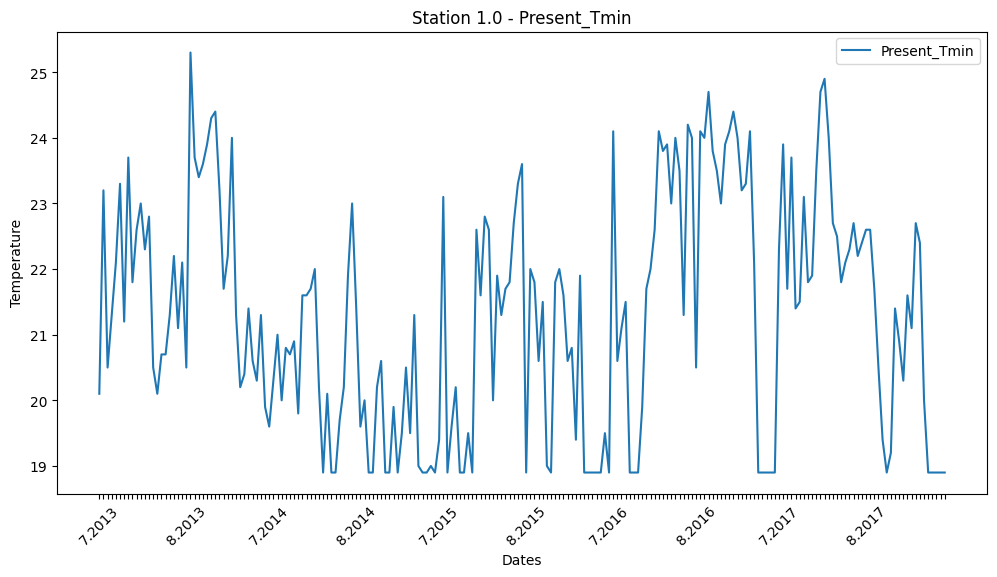

Station 2.0:
ADF Statistic: -4.457441170734421
p-value: 0.0002345512850914623
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


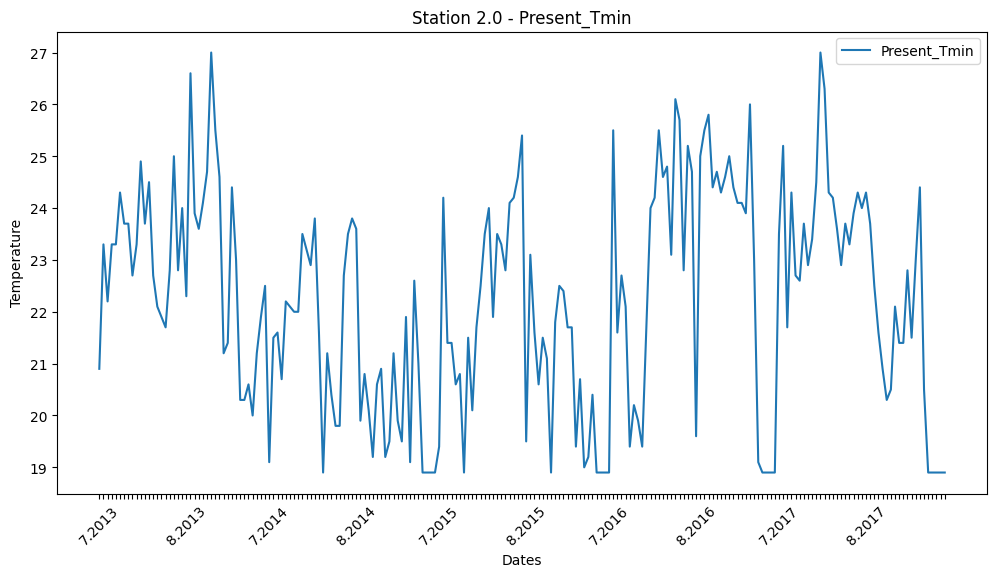

Station 3.0:
ADF Statistic: -4.630666191588012
p-value: 0.00011336254725559296
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


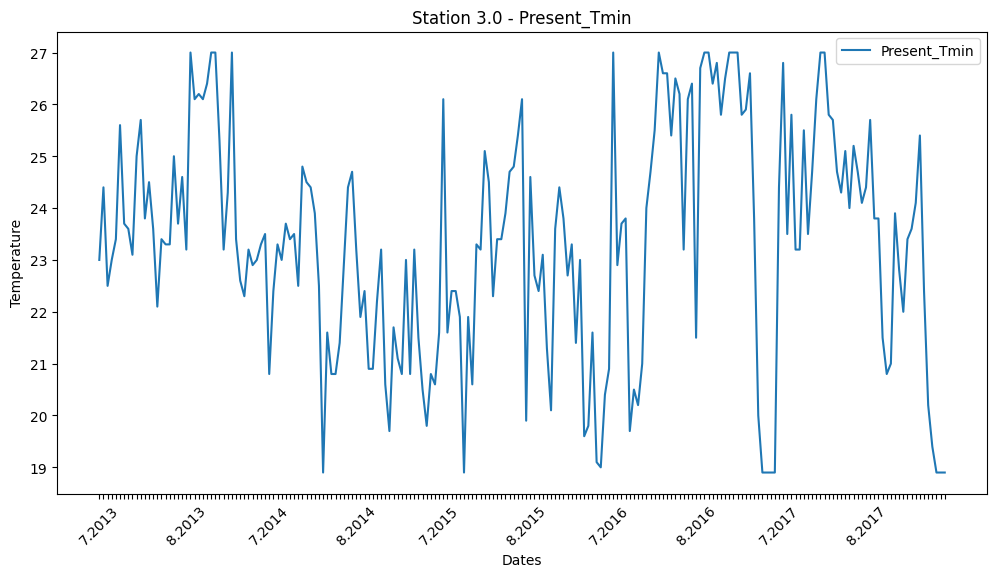

Station 4.0:
ADF Statistic: -4.811762006181401
p-value: 5.163721743347479e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


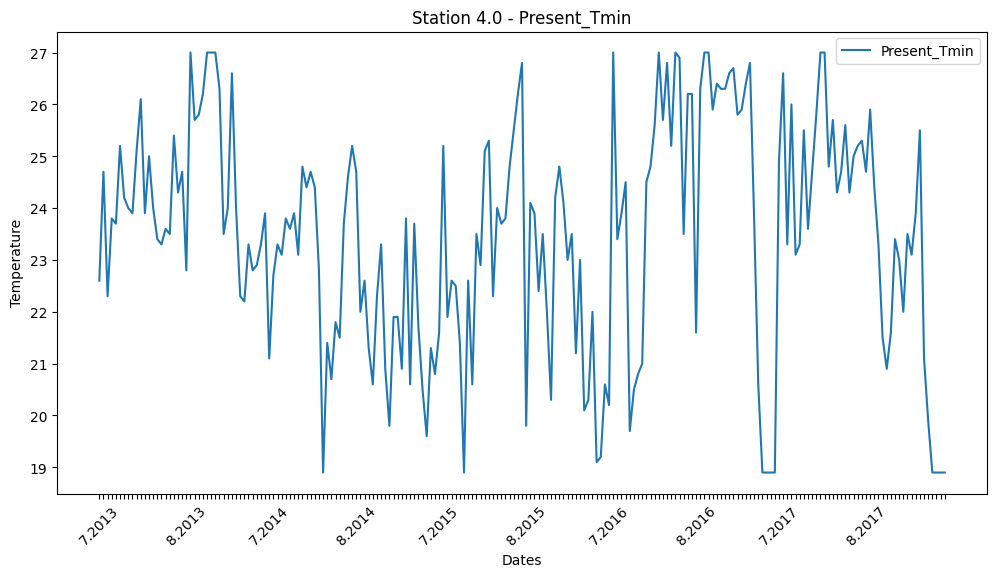

Station 5.0:
ADF Statistic: -4.959999162478637
p-value: 2.6615002625436176e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


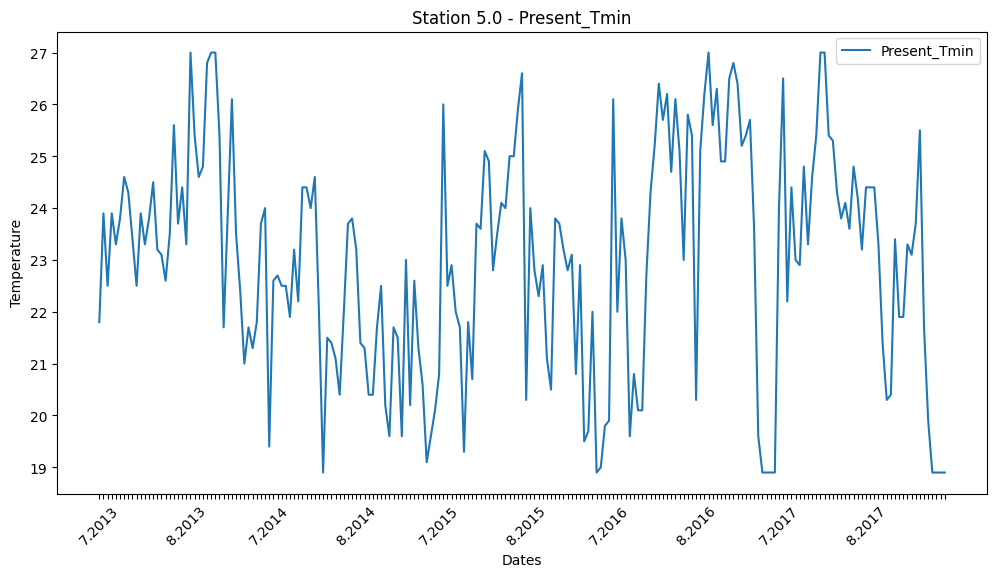

Station 6.0:
ADF Statistic: -5.1443127678405025
p-value: 1.141058610328472e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


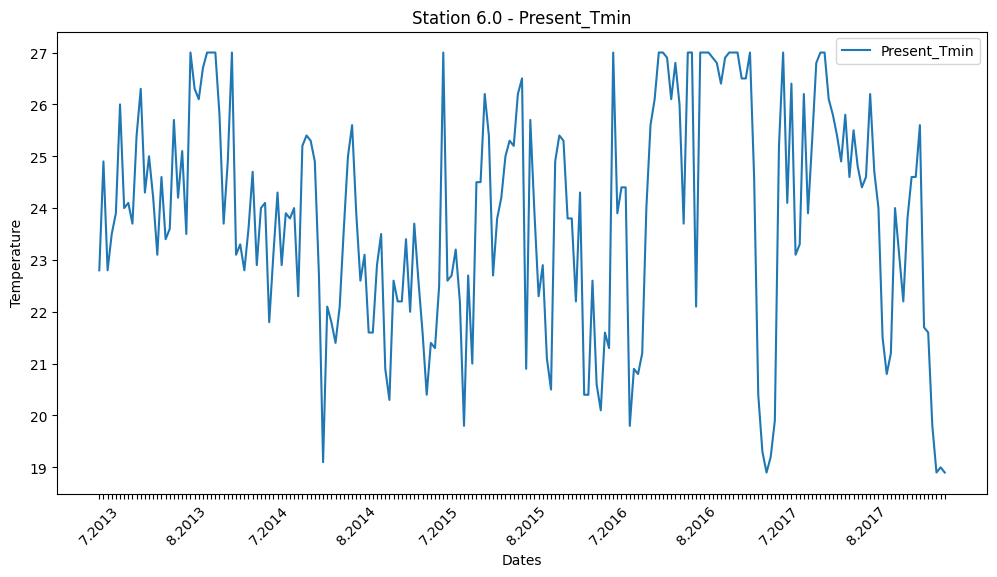

Station 7.0:
ADF Statistic: -4.468342049850728
p-value: 0.0002242281534064551
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


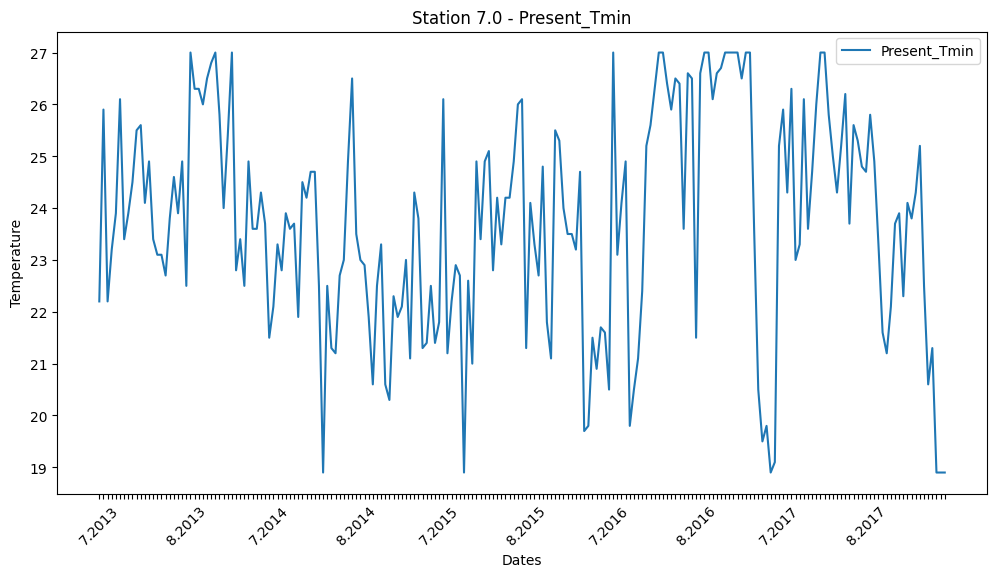

Station 8.0:
ADF Statistic: -4.508445092382909
p-value: 0.00018984496083436844
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


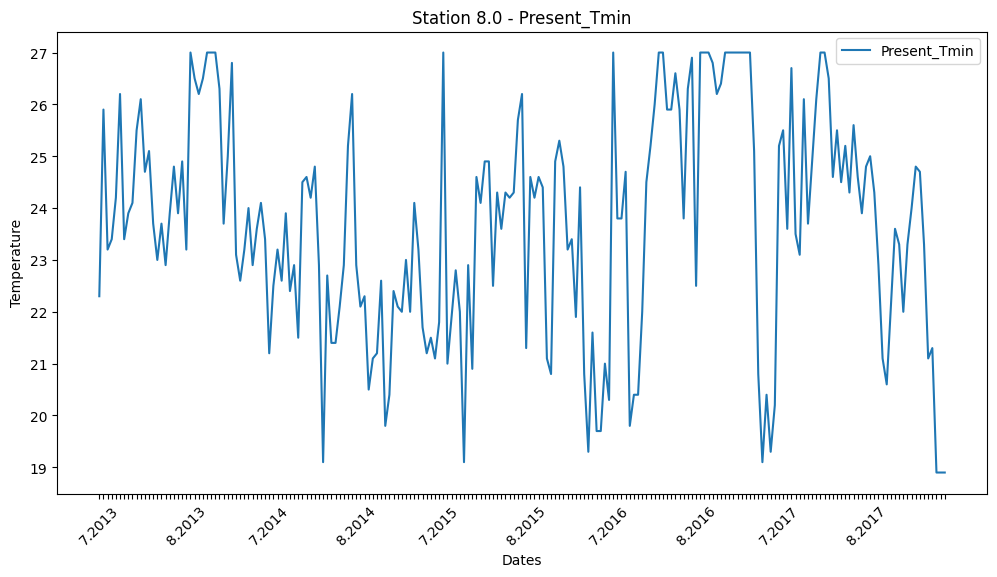

Station 9.0:
ADF Statistic: -4.374124933655262
p-value: 0.00032974461174095
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


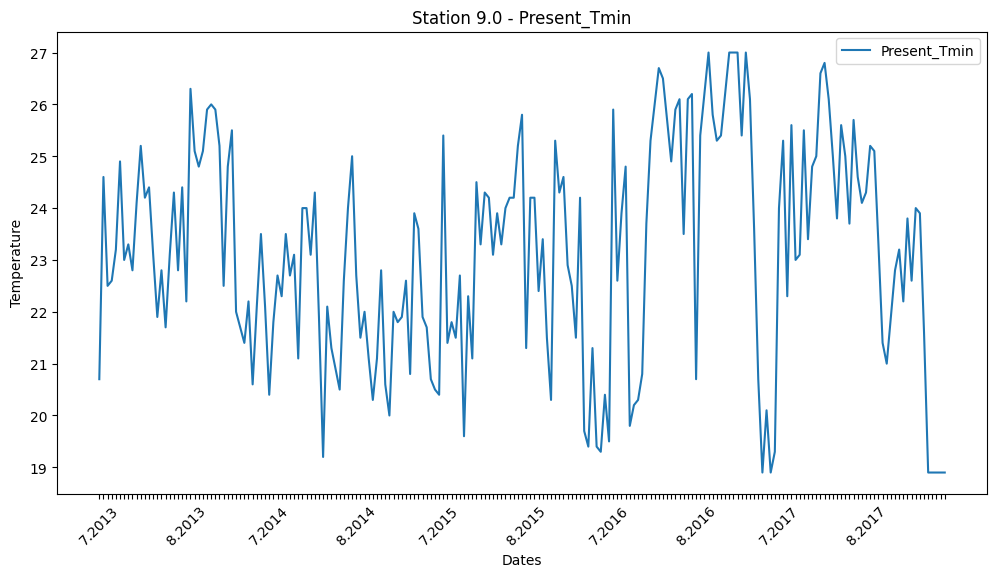

Station 10.0:
ADF Statistic: -4.921282147126207
p-value: 3.169611248809734e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


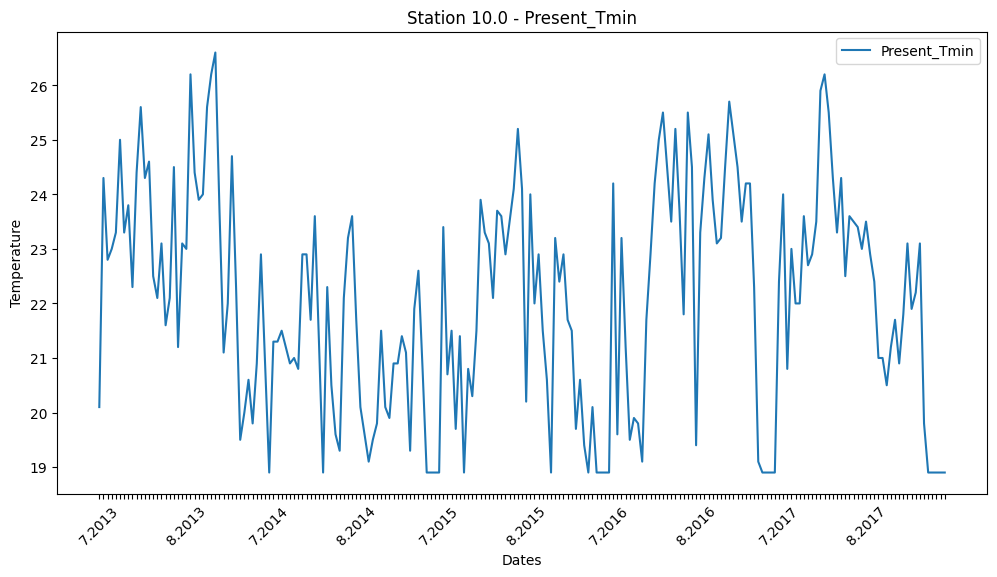

Station 11.0:
ADF Statistic: -4.891802139022581
p-value: 3.617863568815028e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


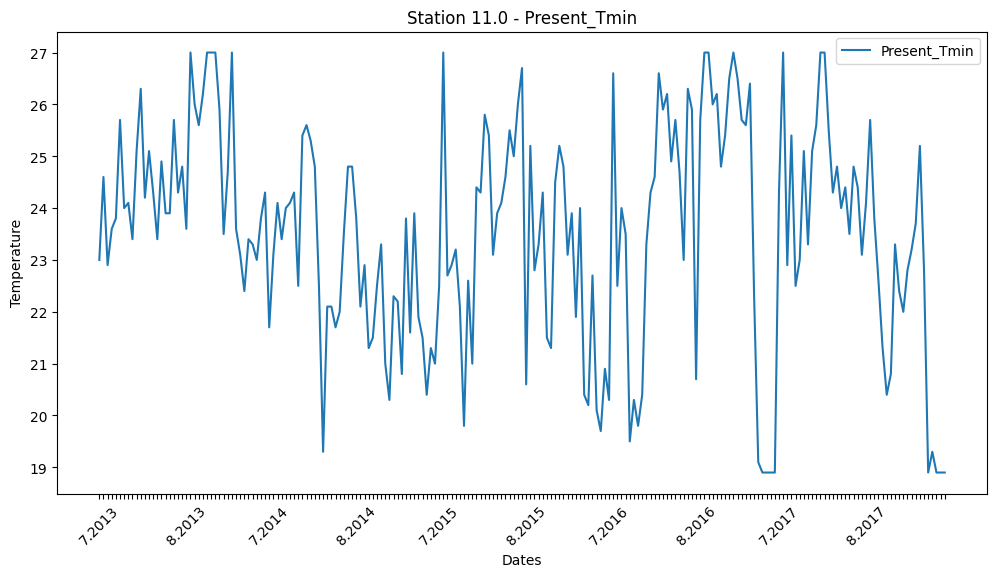

Station 12.0:
ADF Statistic: -4.956624730914491
p-value: 2.702460503007743e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


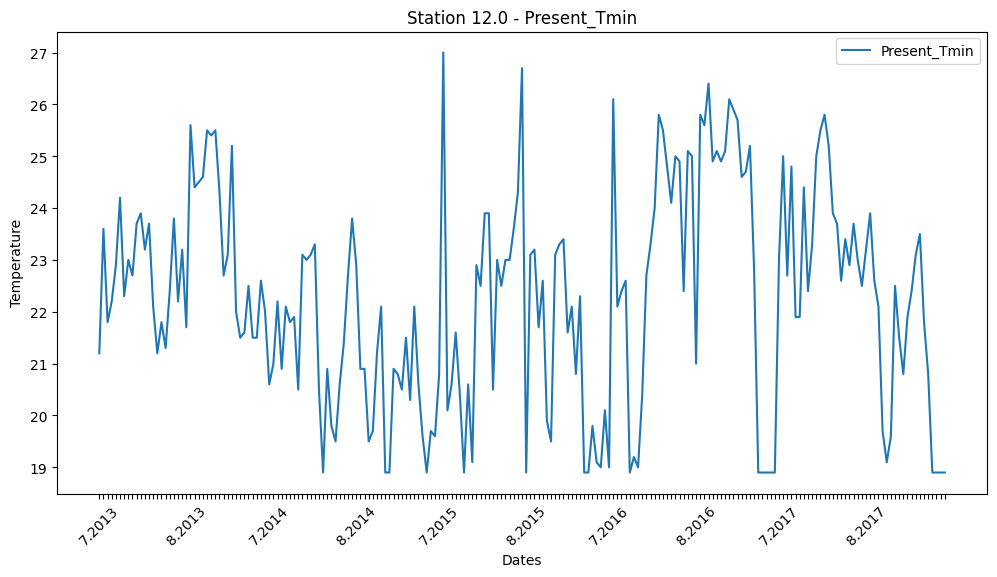

Station 13.0:
ADF Statistic: -4.869344825357547
p-value: 3.9996357374890824e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


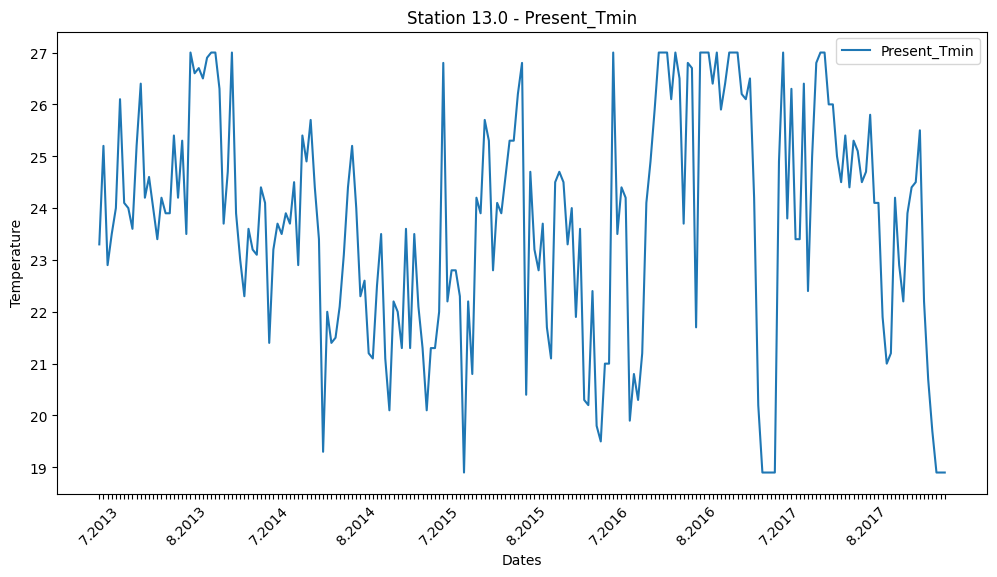

Station 14.0:
ADF Statistic: -4.554499778434067
p-value: 0.00015654992823341236
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


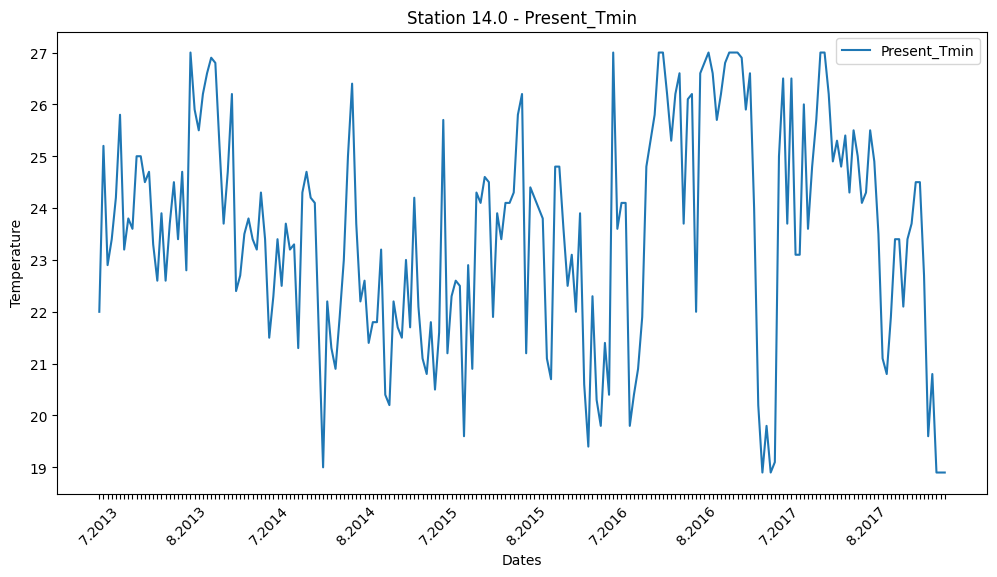

Station 15.0:
ADF Statistic: -4.667660454528268
p-value: 9.674665735608647e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


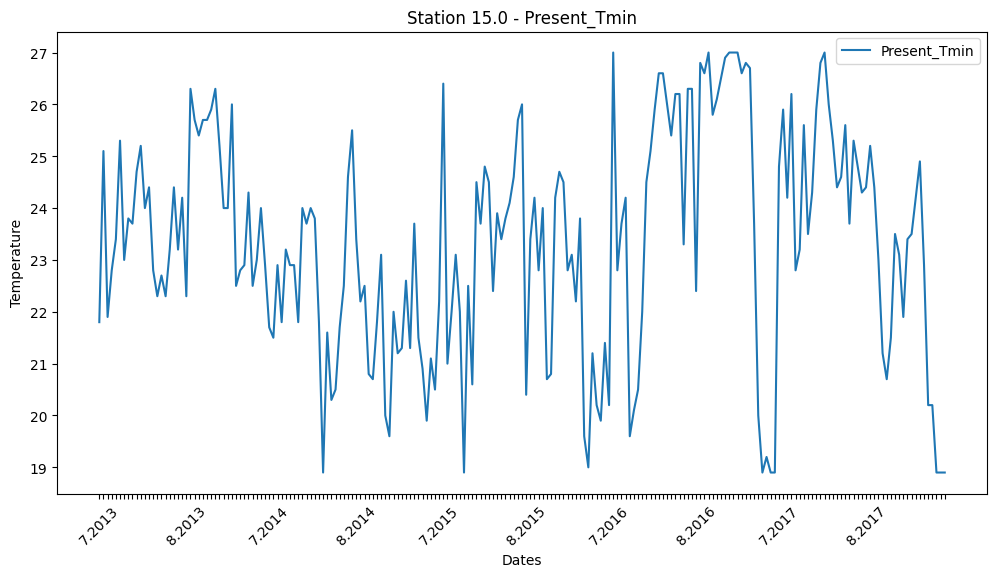

Station 16.0:
ADF Statistic: -4.933560260804062
p-value: 2.99913392418695e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


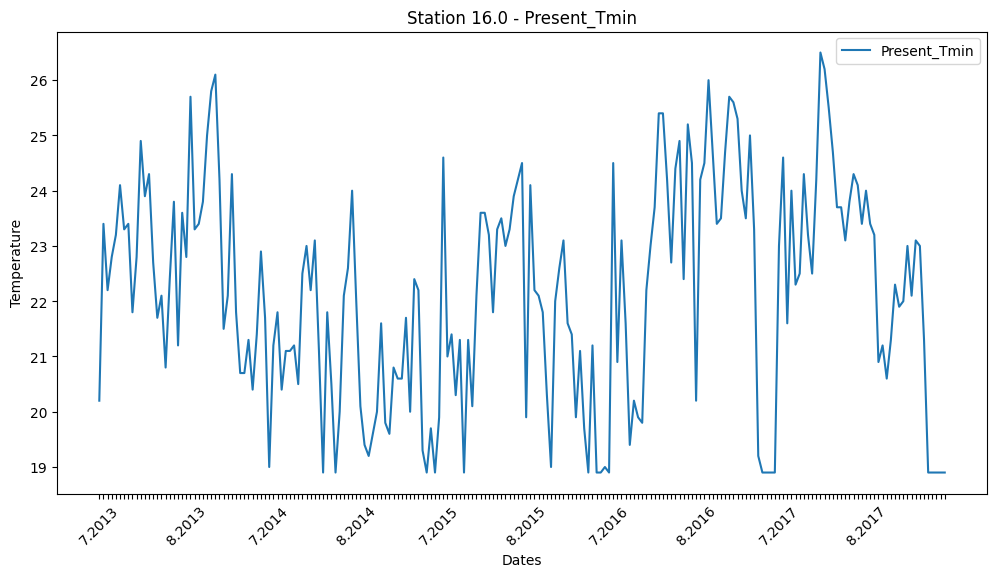

Station 17.0:
ADF Statistic: -5.003746798518097
p-value: 2.1817324720485067e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


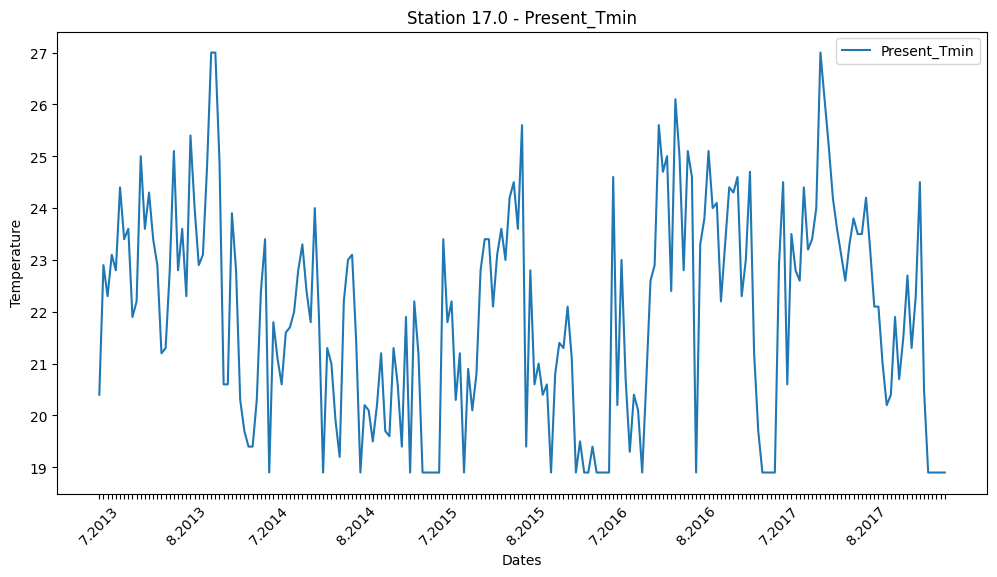

Station 18.0:
ADF Statistic: -4.876352968569596
p-value: 3.8765225518288044e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


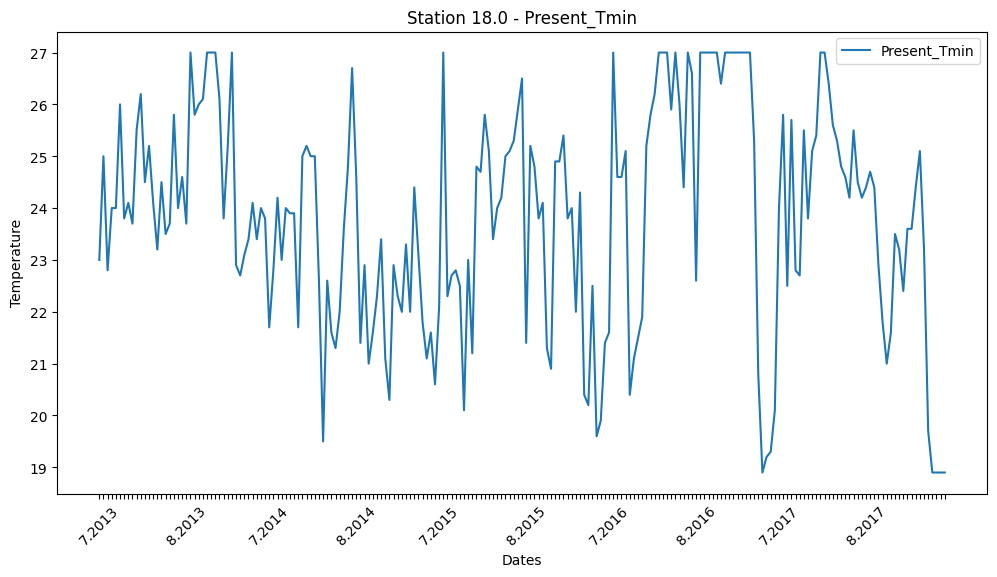

Station 19.0:
ADF Statistic: -4.857505908045701
p-value: 4.216196685271615e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


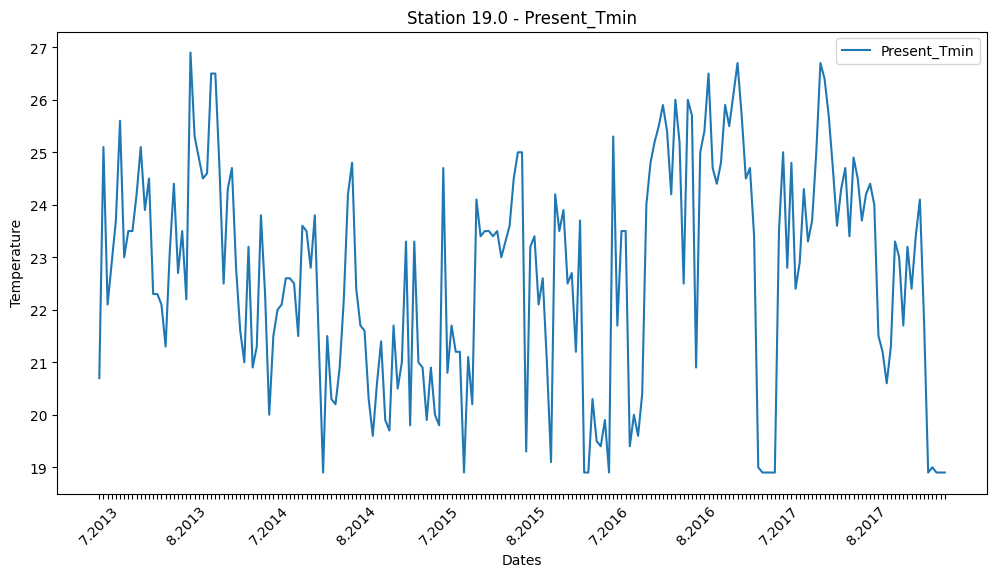

Station 20.0:
ADF Statistic: -4.862808780685564
p-value: 4.117836738696313e-05
Critical Values:
1%: -3.462980134086401
5%: -2.875885461947131
10%: -2.5744164898444515
Stationary (Reject null hypothesis)


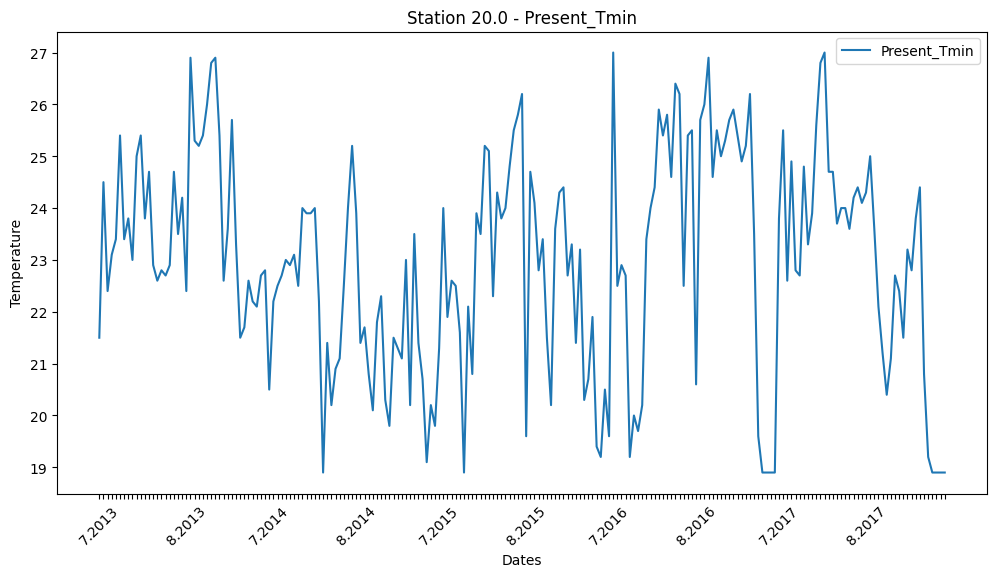

Station 21.0:
ADF Statistic: -4.81554000985624
p-value: 5.0782976581870184e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


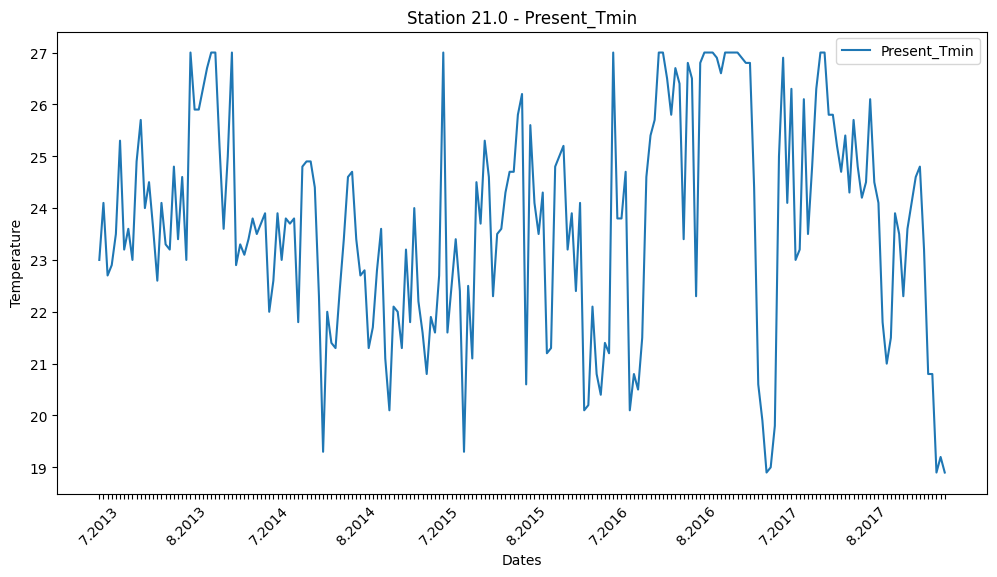

Station 22.0:
ADF Statistic: -4.690215004068791
p-value: 8.778757593882576e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


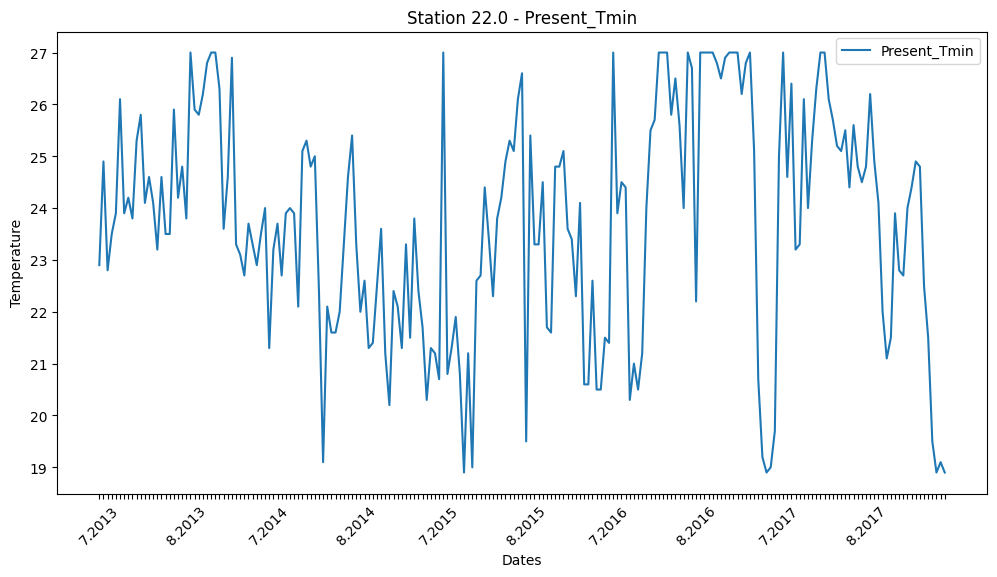

Station 23.0:
ADF Statistic: -4.529162054608097
p-value: 0.00017410963976458032
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


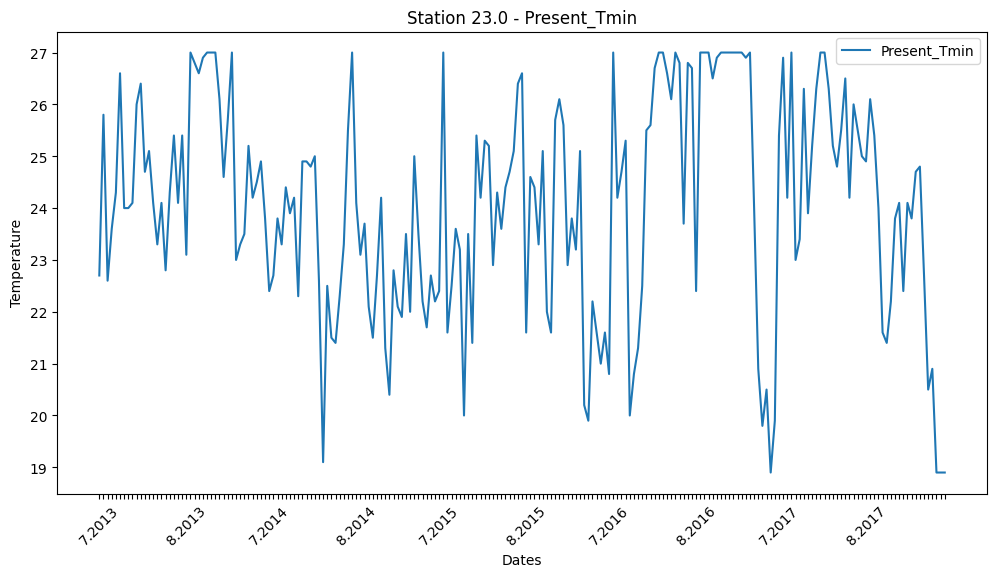

Station 24.0:
ADF Statistic: -4.546914834815263
p-value: 0.00016162125453918704
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


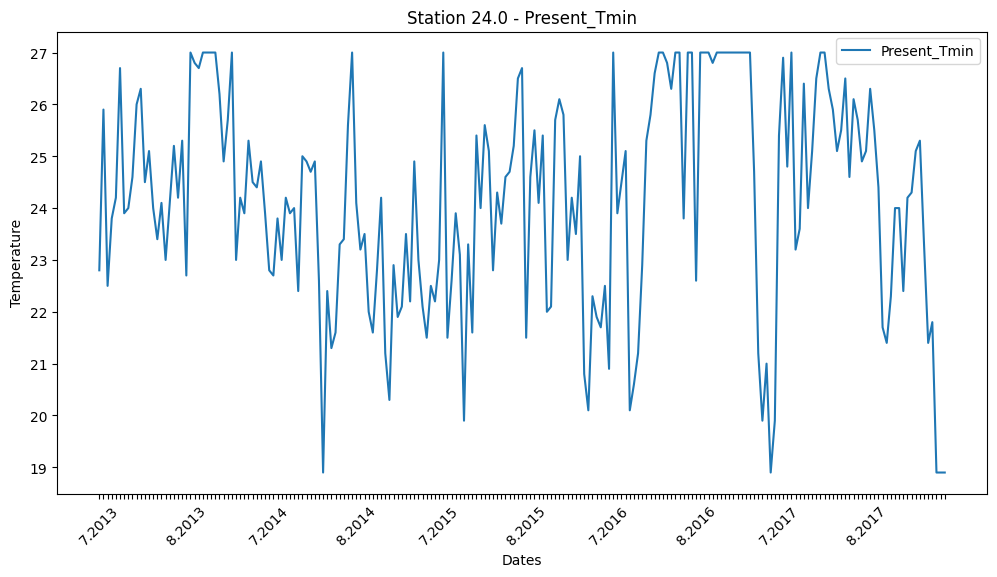

Station 25.0:
ADF Statistic: -4.930631754583252
p-value: 3.0389749025404502e-05
Critical Values:
1%: -3.4633090972761744
5%: -2.876029332045744
10%: -2.5744932593252643
Stationary (Reject null hypothesis)


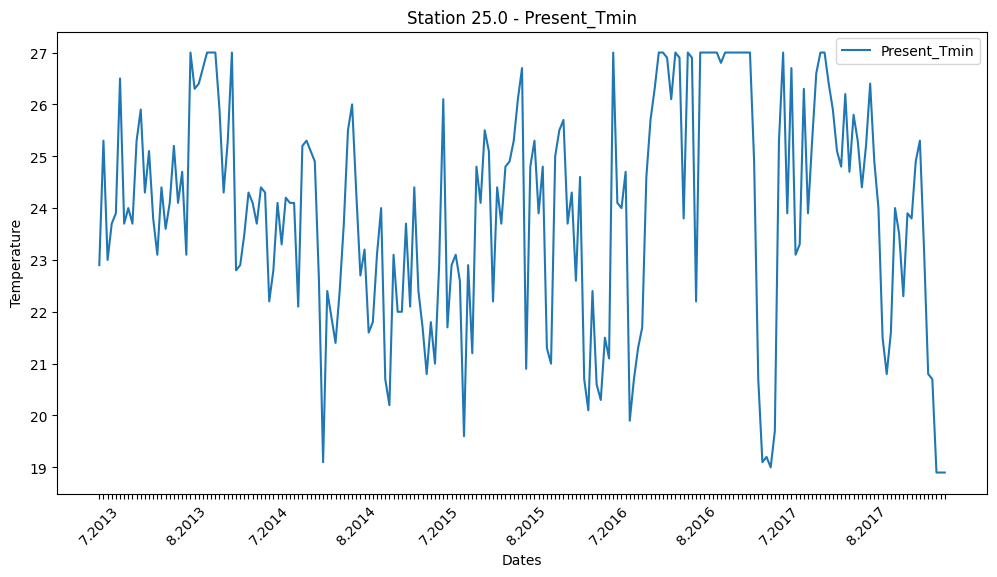

In [278]:
import numpy as np

filtered_data = df_Tmin[df_Tmin.index.isin(date_index)]

for station_id, station_df in filtered_data.groupby('station'):
    # Check stationarity of 'Present_Tmin'
    result = adfuller(station_df['Present_Tmin'], autolag='AIC')

    # Print station ID
    print(f"Station {station_id}:")

    # Print ADF test results
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"{key}: {value}")

    # Create an array of sequential numbers with the same length as the data
    sequential_numbers = np.arange(len(station_df))

    # Plot 'Present_Tmin' for visualization
    plt.figure(figsize=(12, 6))
    plt.plot(sequential_numbers, station_df['Present_Tmin'], label='Present_Tmin')
    plt.title(f'Station {station_id} - Present_Tmin')
    plt.xlabel('Dates')
    plt.ylabel('Temperature')
    plt.legend()

    # Generate the x-axis labels in the desired format
    x_labels = []
    current_month = None
    for date in station_df.index:
        if current_month is None or date.month != current_month:
            x_labels.append(f'{date.month}.{date.year}')
            current_month = date.month
        else:
            x_labels.append('')

    plt.xticks(sequential_numbers, x_labels, rotation=45)

    # Print whether the series is stationary or not
    if result[1] <= 0.05:
        print("Stationary (Reject null hypothesis)")
    else:
        print("Not stationary (Fail to reject null hypothesis)")

    plt.show()


#### This indicates that the 'Present_Tmin' temperature data for all stations is stationary also .

#### We have 25 stations, for now we will work on first 5.

In [481]:
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def decomposed_max(data):
    decomposed = sm.tsa.seasonal_decompose(data['Present_Tmax'], model='additive', period=60)

    def decomposed_graphs(decomposed_data, title):
        # Create sequential numbers for the x-axis labels
        sequential_numbers = np.arange(len(decomposed_data))

        # Plot the decomposed data
        plt.figure(figsize=(20, 7))
        plt.plot(sequential_numbers, decomposed_data, label=title)
        plt.title(title, fontsize="xx-large")
        plt.xlabel('Sequential Number')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

    decomposed_graphs(decomposed.trend, "Trend(Tmax)")
    decomposed_graphs(decomposed.seasonal, "Seasonality(Tmax)")
    decomposed_graphs(decomposed.resid, "Residuals(Tmax)")


In [482]:
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def decomposed_min(data):
    decomposed = sm.tsa.seasonal_decompose(S1_min['Present_Tmin'], model='additive', period=60)

    def decomposed_graphs(decomposed_data, title):
        # Create sequential numbers for the x-axis labels
        sequential_numbers = np.arange(len(decomposed_data))

        # Plot the decomposed data
        plt.figure(figsize=(20, 7))
        plt.plot(sequential_numbers, decomposed_data, label=title)
        plt.title(title, fontsize="xx-large")
        plt.xlabel('Sequential Number')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

    decomposed_graphs(decomposed.trend, "Trend(Tmin)")
    decomposed_graphs(decomposed.seasonal, "Seasonality(Tmin)")
    decomposed_graphs(decomposed.resid, "Residuals(Tmin)")

### **Time Series Decompisition.**

#### **Trend:** This represents the long-term movement or direction of the data. It could be upward, downward, or relatively flat.


#### **Seasonality:** This refers to repeating patterns that occur at fixed intervals, such as daily, monthly, or yearly. For instance, retail sales might have higher values during the holiday season each year.

#### **Cyclical Component:** Unlike seasonality, cyclical variations are not fixed to specific time intervals. They represent longer-term cycles or fluctuations that are not as predictable as seasonal patterns. Economic cycles, which can span several years, are an example of cyclical behavior.

In [483]:
import matplotlib.pyplot as plt

def plot_min(data):
    filtered_data = data[data.index.isin(date_index)]

    sequential_numbers = np.arange(len(filtered_data))

    plt.figure(figsize=(12, 6))
    plt.plot(sequential_numbers, filtered_data['Present_Tmin'], label='Present_Tmin', alpha=0.7)
    plt.xlabel('Dates')
    plt.ylabel('Temperature')
    plt.title('Tmin Across Time')
    plt.legend()

    # Generate the x-axis labels in the desired format
    x_labels = []
    current_month = None
    for date in filtered_data.index:
        if current_month is None or date.month != current_month:
            x_labels.append(f'{date.month}.{date.year}')
            current_month = date.month
        else:
            x_labels.append('')

    plt.xticks(sequential_numbers, x_labels, rotation=45)
    plt.xlim(sequential_numbers[0], sequential_numbers[-1])

    plt.show()

In [484]:
import matplotlib.pyplot as plt

def plot_max(data):
    filtered_data = data[data.index.isin(date_index)]

    sequential_numbers = np.arange(len(filtered_data))

    plt.figure(figsize=(12, 6))
    plt.plot(sequential_numbers, filtered_data['Present_Tmax'], label='Present_Tmax', alpha=0.7)
    plt.xlabel('Dates')
    plt.ylabel('Temperature')
    plt.title('Tmax Across Time')
    plt.legend()

    # Generate the x-axis labels in the desired format
    x_labels = []
    current_month = None
    for date in filtered_data.index:
        if current_month is None or date.month != current_month:
            x_labels.append(f'{date.month}.{date.year}')
            current_month = date.month
        else:
            x_labels.append('')

    plt.xticks(sequential_numbers, x_labels, rotation=45)
    plt.xlim(sequential_numbers[0], sequential_numbers[-1])

    plt.show()

## Let's start with Tmax.

We will divide the stationary temperature data into 25 separate dataframes, each corresponding to a different weather station, for both maximum temperature (df_Tmax) and minimum temperature (df_Tmin). This allows for individualized analysis and forecasting for each weather station's temperature records, enhancing the granularity of insights and predictions.

**The Data frame represents the maximum temperature (Present_Tmax) records for the first weather station**

In [279]:
S1_max = df_Tmax[df_Tmax['station'] == 1.0]

In [280]:
S1_max=S1_max.drop(columns=['station'])

In [281]:
S1_max.head()

,Present_Tmax
Date,
2013-07-07,25.9
2013-07-08,29.3
2013-07-13,24.2
2013-07-14,24.2
2013-07-15,25.8


In [282]:
S1_max.nunique()

Present_Tmax    67
dtype: int64

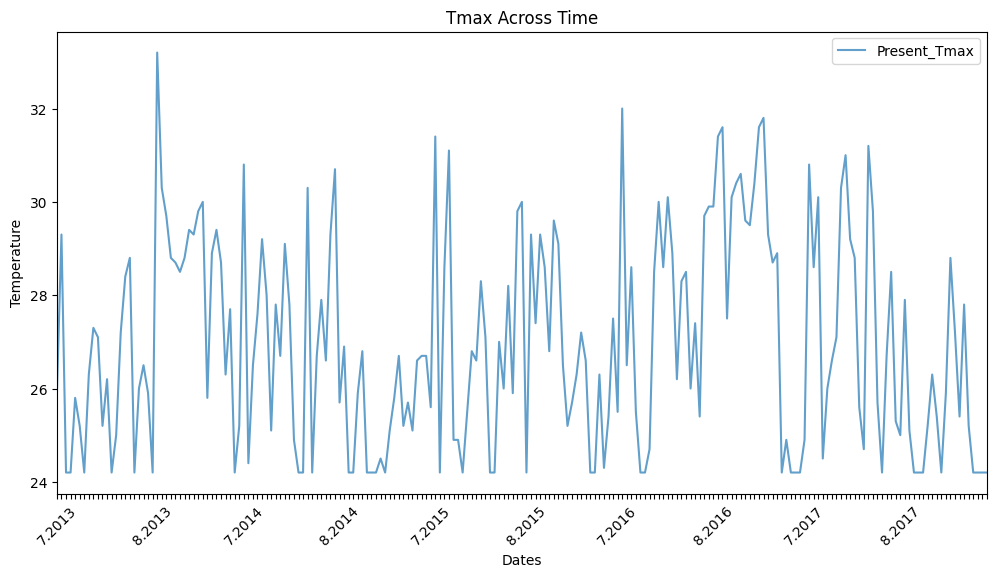

In [485]:
plot_max(S1_max)

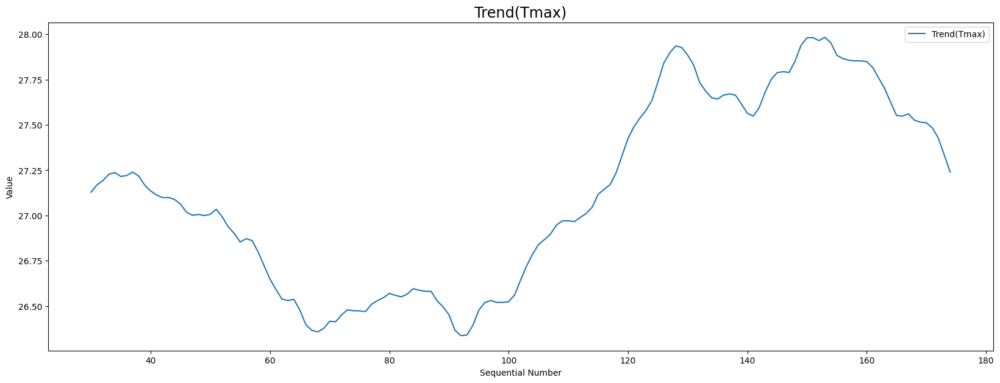

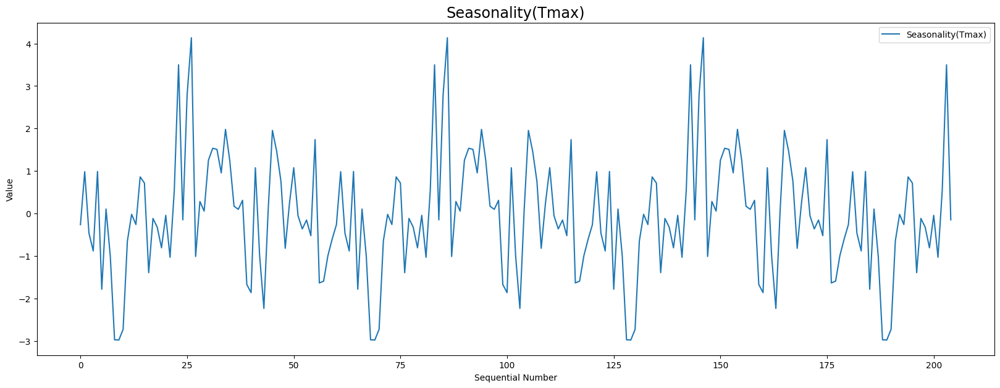

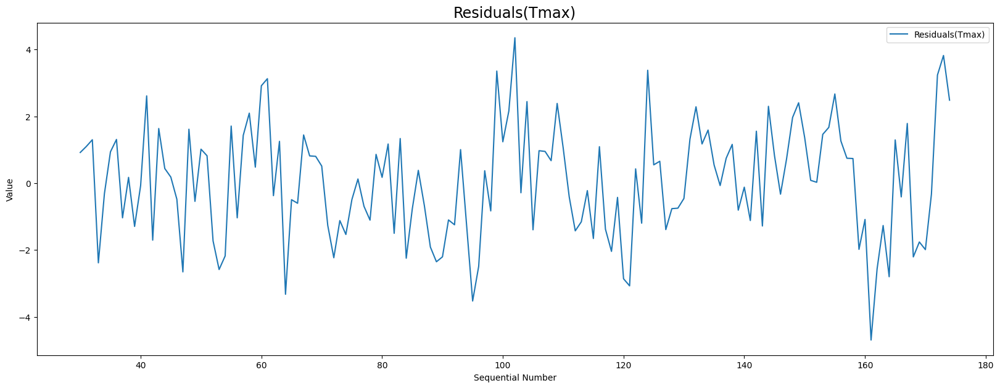

In [487]:
decomposed_max(S1_max)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the maximum temperature (Present_Tmax) records for the second weather station**

In [283]:
S2_max = df_Tmax[df_Tmax['station'] == 2.0]

In [284]:
S2_max=S2_max.drop(columns=['station'])

In [285]:
S2_max.head()

,Present_Tmax
Date,
2013-07-07,28.5
2013-07-08,31.7
2013-07-13,25.2
2013-07-14,25.5
2013-07-15,28.1


In [286]:
S2_max.nunique()

Present_Tmax    81
dtype: int64

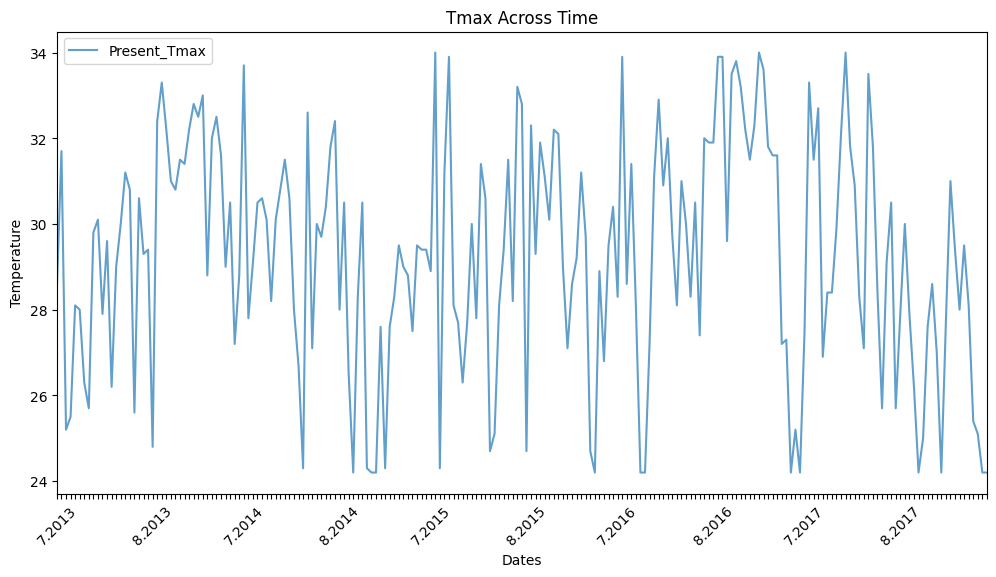

In [488]:
plot_max(S2_max)

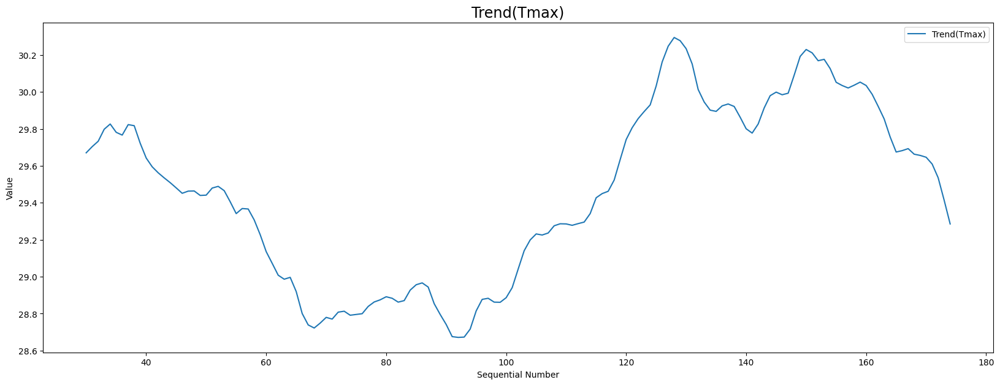

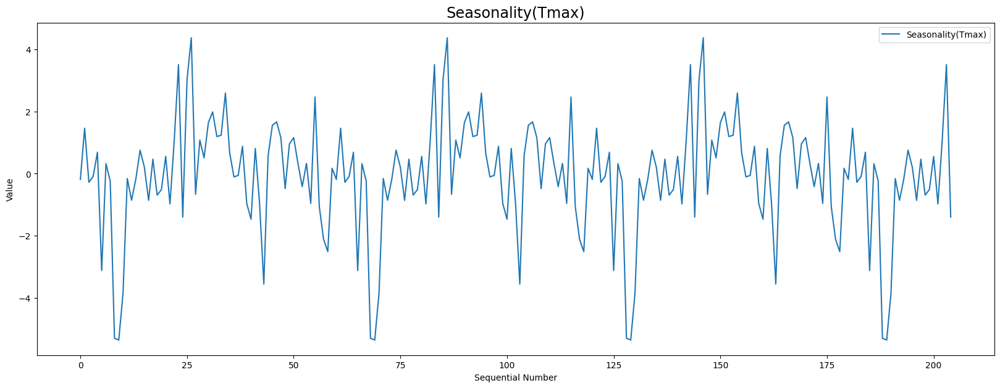

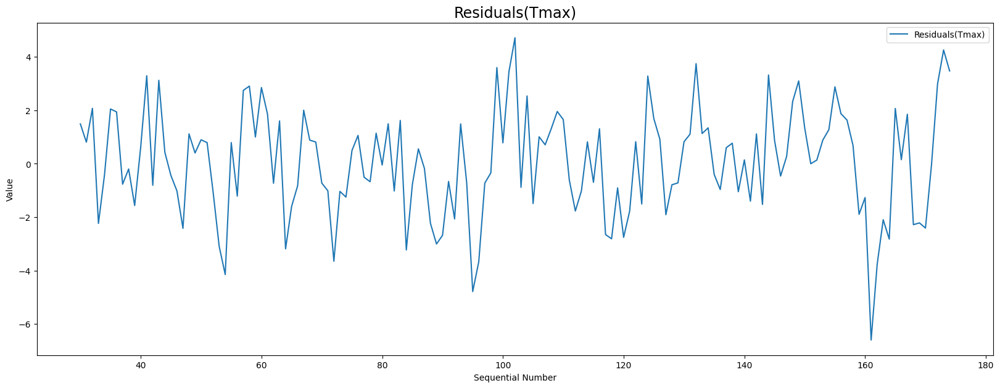

In [489]:
decomposed_max(S2_max)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the maximum temperature (Present_Tmax) records for the third weather station**

In [287]:
S3_max = df_Tmax[df_Tmax['station'] == 3.0]

In [288]:
S3_max=S3_max.drop(columns=['station'])

In [289]:
S3_max.head()

,Present_Tmax
Date,
2013-07-07,28.5
2013-07-08,32.2
2013-07-13,25.3
2013-07-14,25.4
2013-07-15,28.9


In [290]:
S3_max.nunique()

Present_Tmax    83
dtype: int64

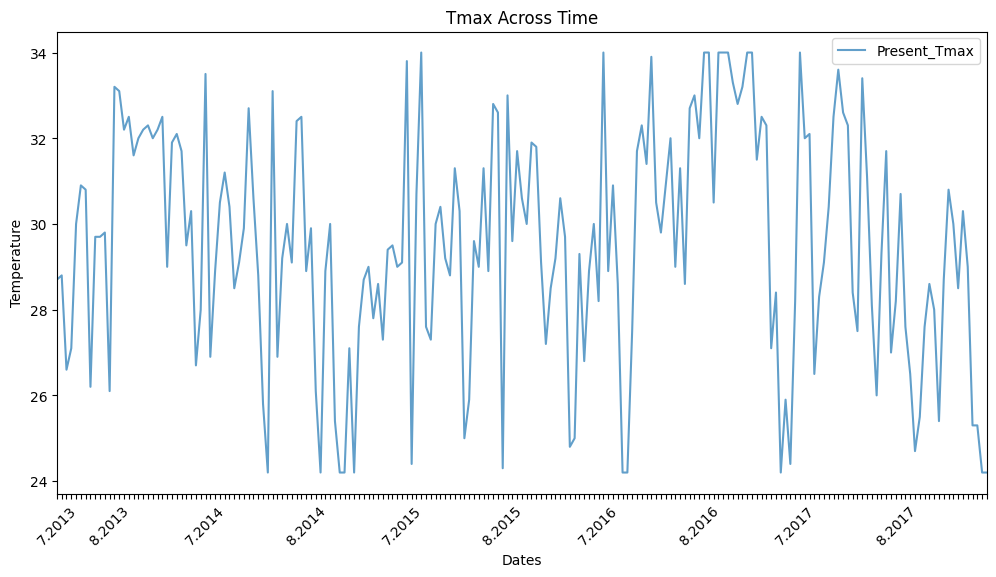

In [490]:
plot_max(S3_max)

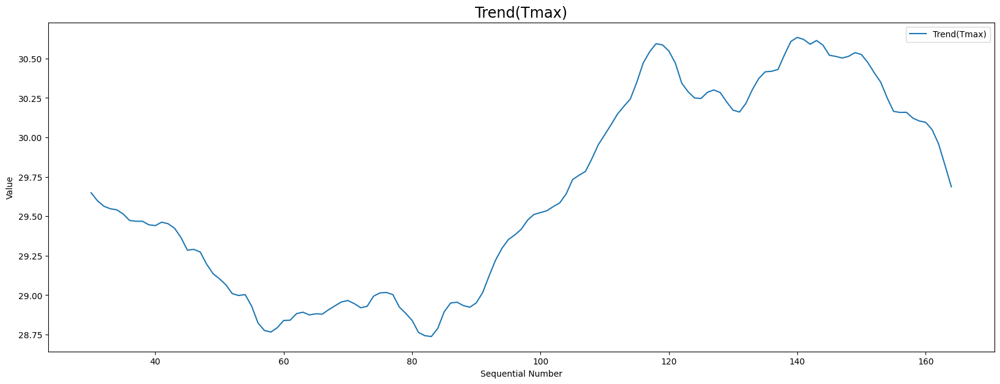

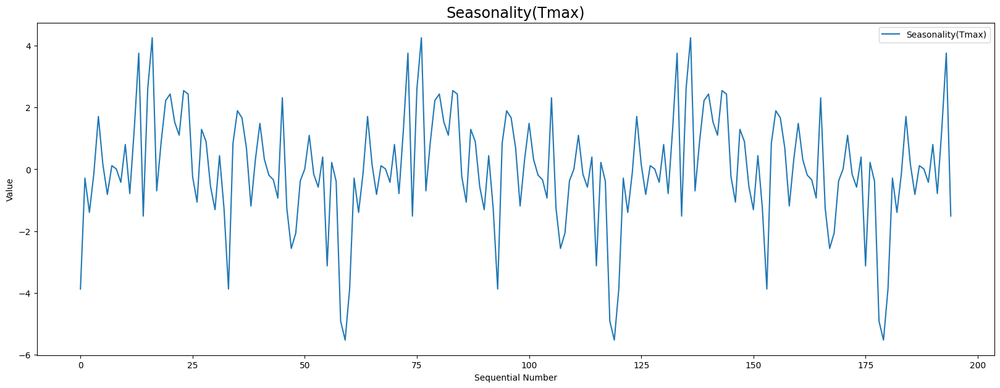

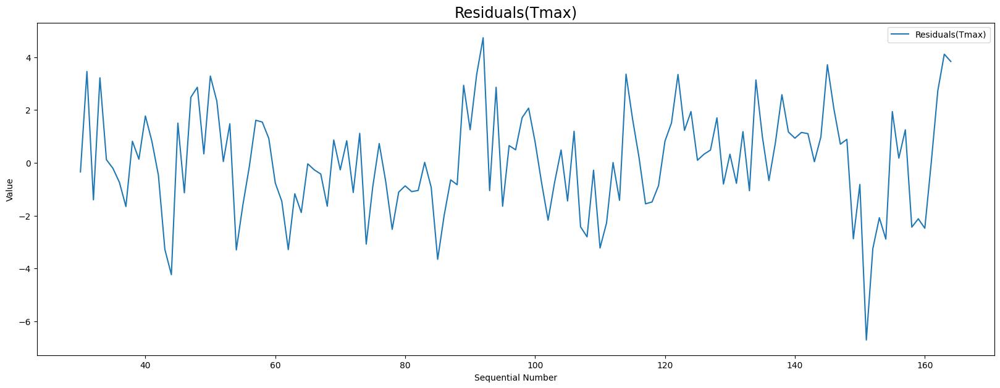

In [491]:
decomposed_max(S3_max)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the maximum temperature (Present_Tmax) records for the fourth weather station**

In [291]:
S4_max = df_Tmax[df_Tmax['station'] == 4.0]

In [292]:
S4_max=S4_max.drop(columns=['station'])

In [293]:
S4_max.head()

,Present_Tmax
Date,
2013-07-07,28.7
2013-07-08,32.6
2013-07-13,26.0
2013-07-14,25.7
2013-07-15,29.3


In [294]:
S4_max.nunique()

Present_Tmax    80
dtype: int64

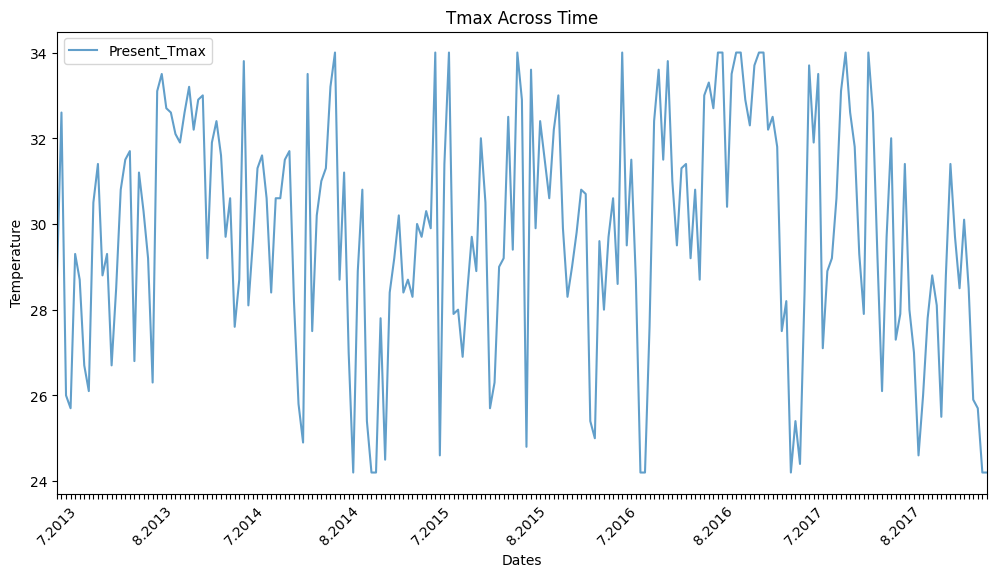

In [492]:
plot_max(S4_max)

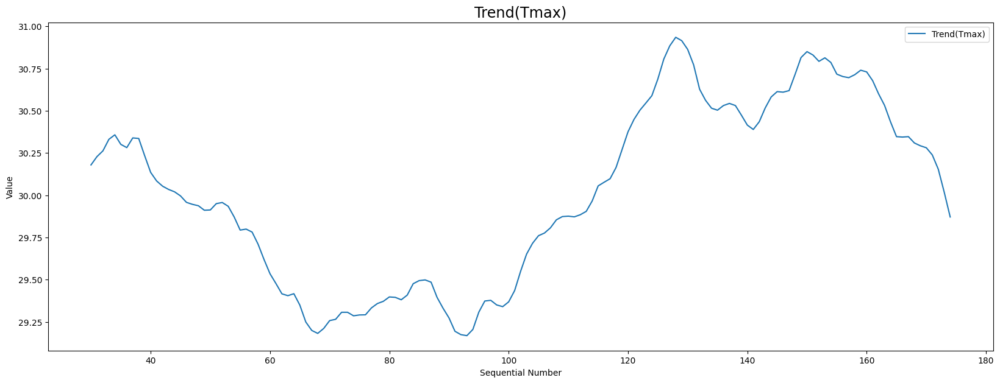

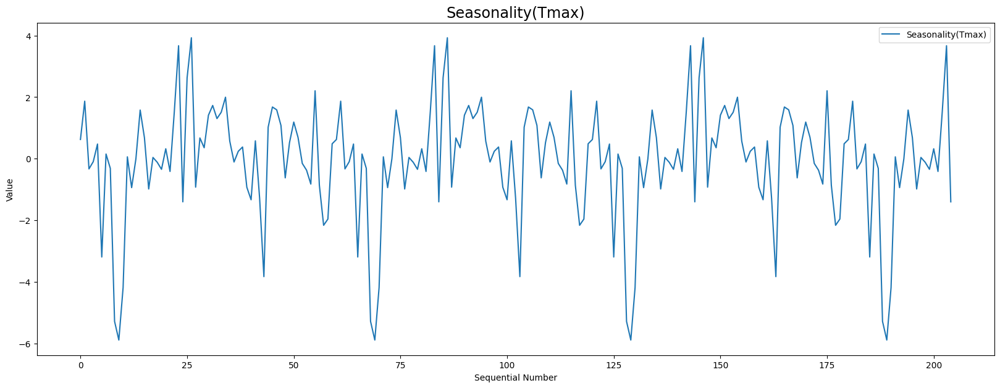

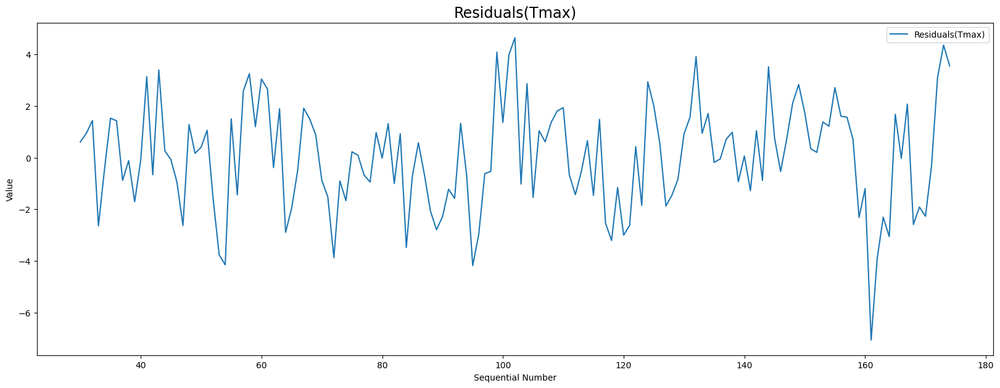

In [493]:
decomposed_max(S4_max)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the maximum temperature (Present_Tmax) records for the fifth weather station**

In [295]:
S5_max = df_Tmax[df_Tmax['station'] == 5.0]

In [296]:
S5_max=S5_max.drop(columns=['station'])

In [297]:
S5_max.head()

,Present_Tmax
Date,
2013-07-07,30.8
2013-07-08,31.8
2013-07-13,25.9
2013-07-14,26.0
2013-07-15,26.2


In [298]:
S5_max.nunique()

Present_Tmax    86
dtype: int64

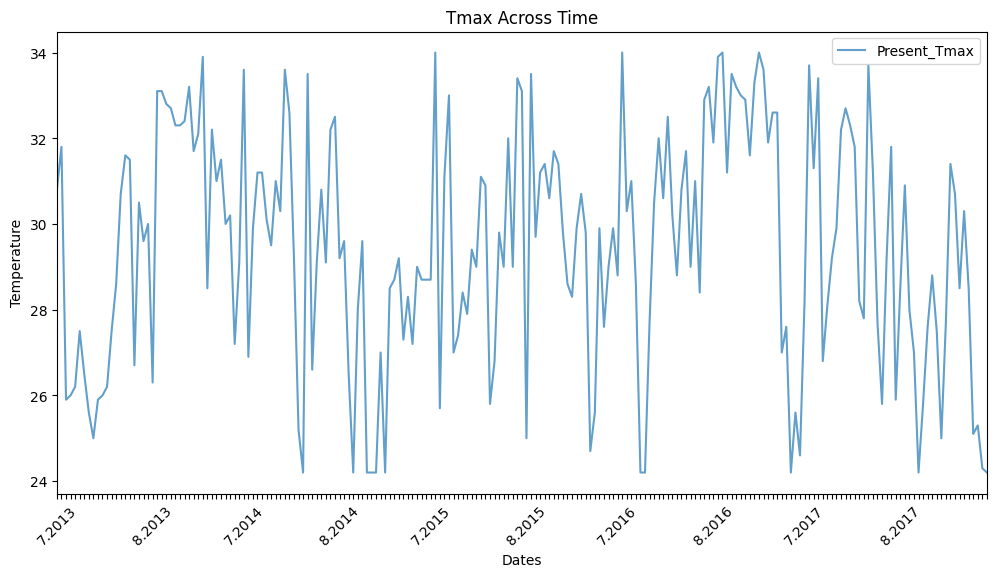

In [494]:
plot_max(S5_max)

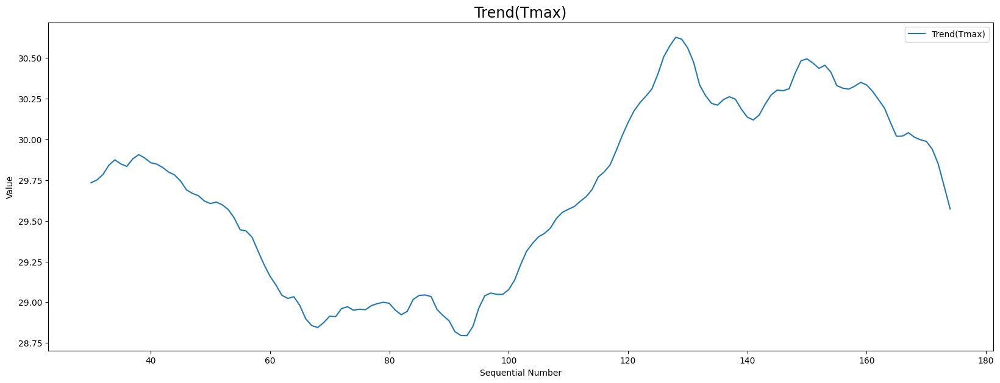

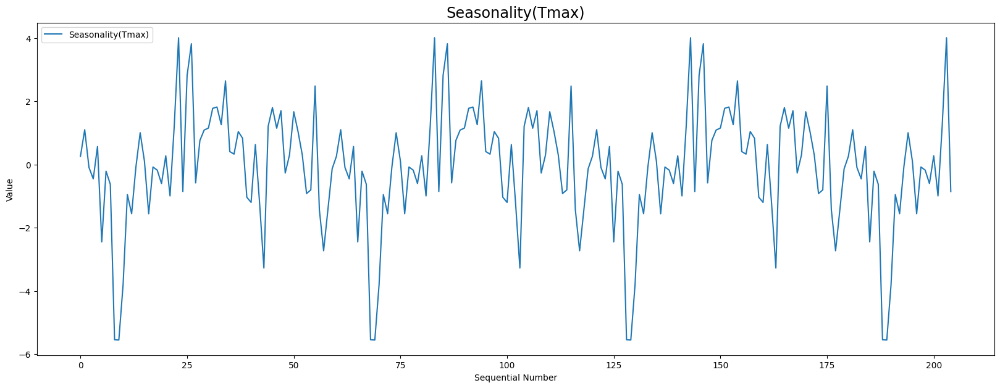

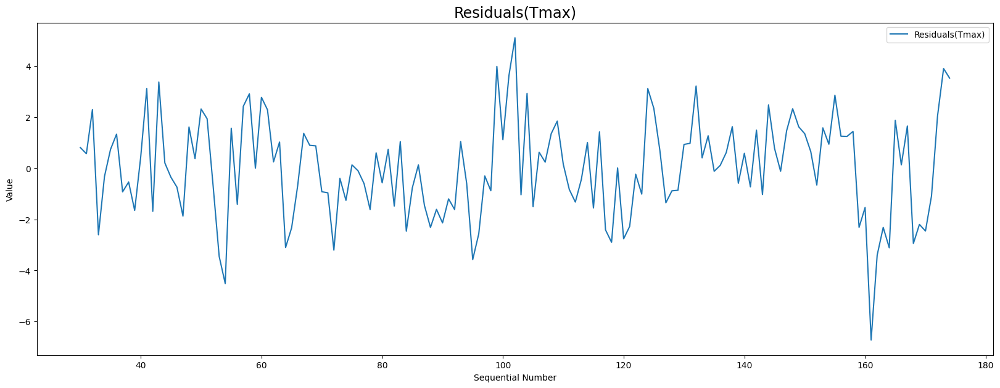

In [495]:
decomposed_max(S5_max)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


## Now let's continue with Tmin.

**The Data frame represents the min temperature (Present_Tmin) records for the first weather station**

In [471]:
S1_min = df_Tmin[df_Tmin['station'] == 1.0]

In [472]:
S1_min = df_Tmin[df_Tmin['station'] == 1.0]
S1_min=S1_min.drop(columns=['station'])

In [301]:
S1_min.head()

,Present_Tmin
Date,
2013-07-07,20.1
2013-07-08,23.2
2013-07-13,20.5
2013-07-14,21.3
2013-07-15,22.1


In [302]:
S1_min.nunique()

Present_Tmin    56
dtype: int64

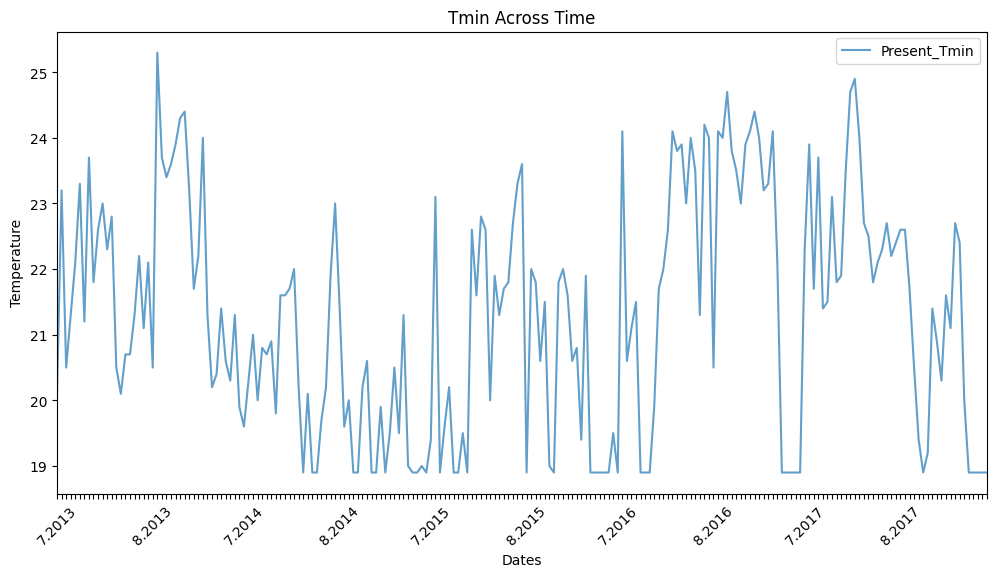

In [497]:
plot_min(S1_min)

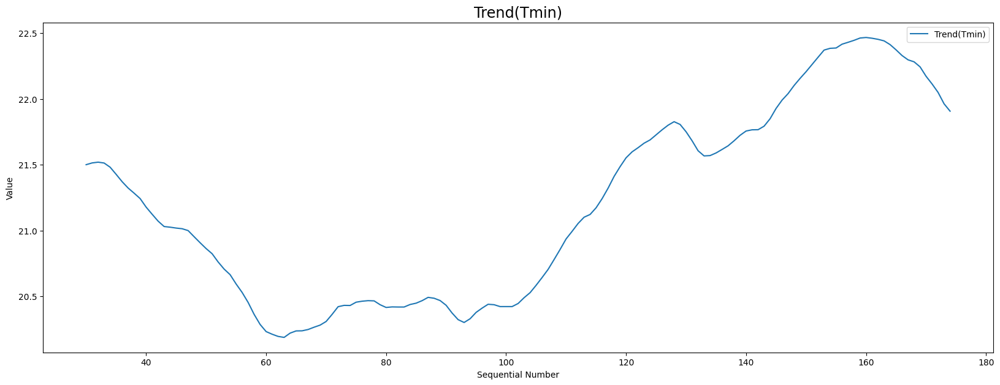

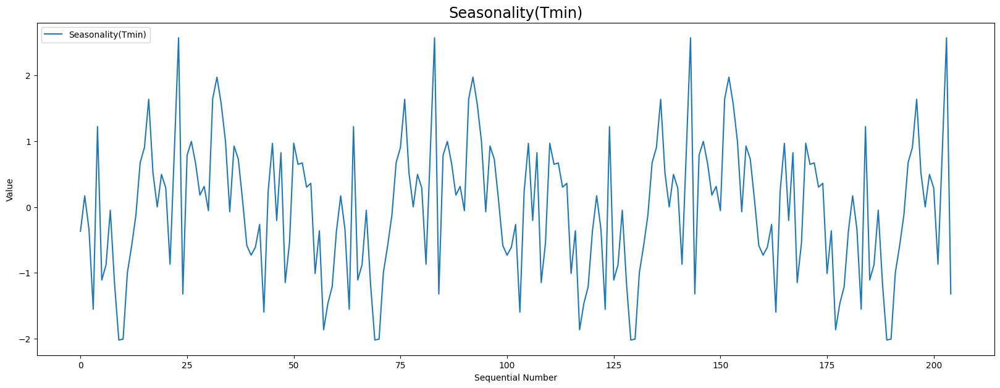

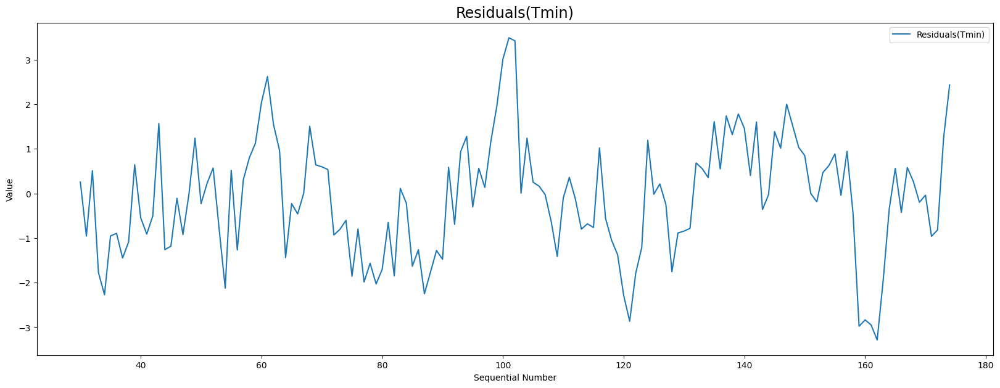

In [499]:
decomposed_min(S1_min)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the min temperature (Present_Tmin) records for the second weather station**

In [382]:
S2_min = df_Tmin[df_Tmin['station'] == 2.0]

In [383]:
S2_min=S2_min.drop(columns=['station'])

In [384]:
S2_min.head()

,Present_Tmin
Date,
2013-07-07,20.9
2013-07-08,23.3
2013-07-13,22.2
2013-07-14,23.3
2013-07-15,23.3


In [385]:
S2_min.nunique()

Present_Tmin    69
dtype: int64

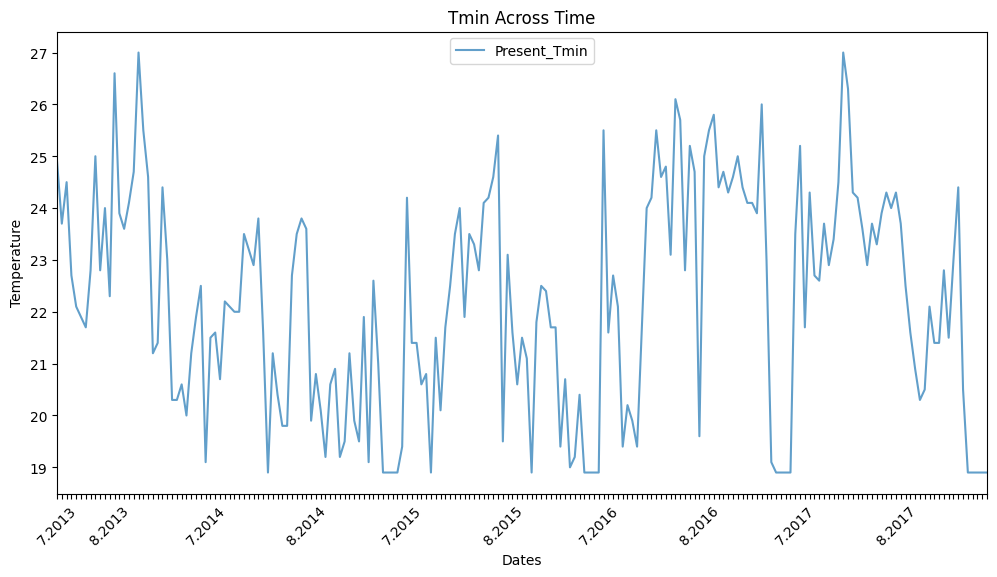

In [500]:
plot_min(S2_min)

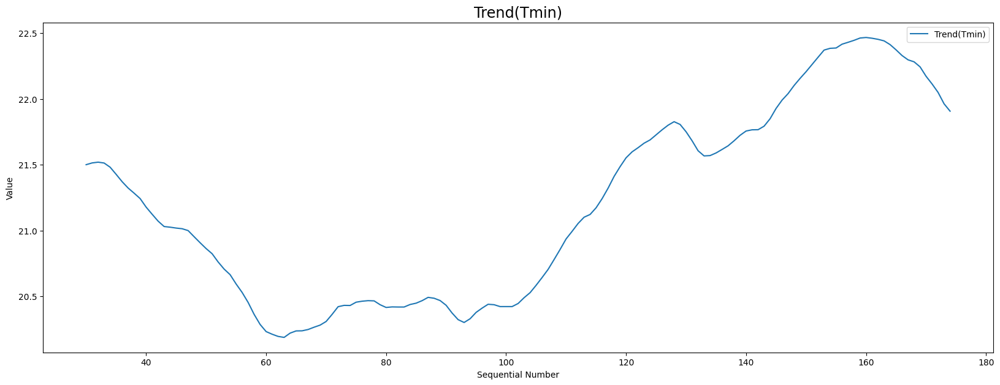

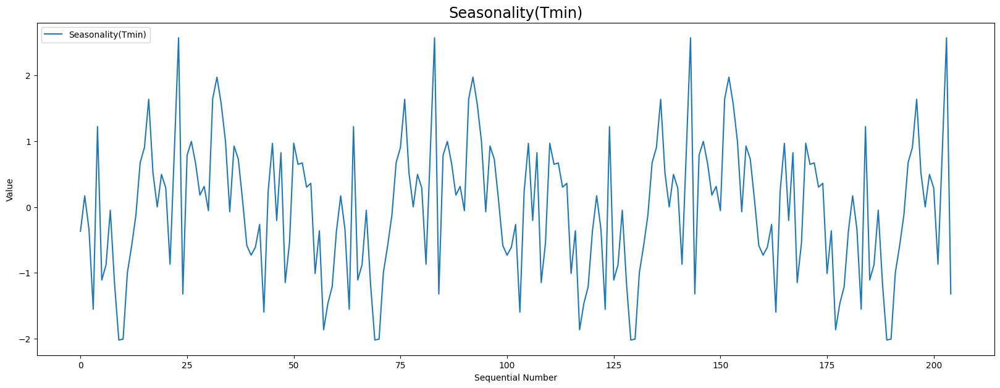

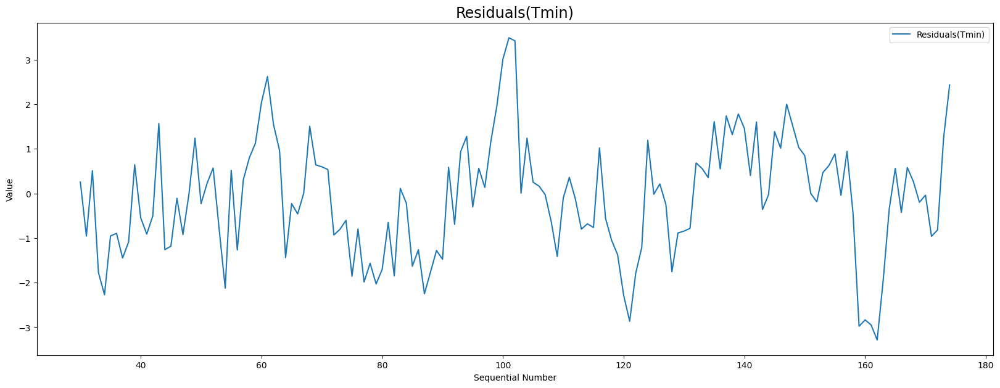

In [501]:
decomposed_min(S2_min)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the min temperature (Present_Tmin) records for the third weather station**

In [307]:
S3_min = df_Tmin[df_Tmin['station'] == 3.0]

In [308]:
S3_min=S3_min.drop(columns=['station'])

In [309]:
S3_min.head()

,Present_Tmin
Date,
2013-07-07,23.0
2013-07-08,24.4
2013-07-13,22.5
2013-07-14,23.0
2013-07-15,23.4


In [310]:
S3_min.nunique()

Present_Tmin    70
dtype: int64

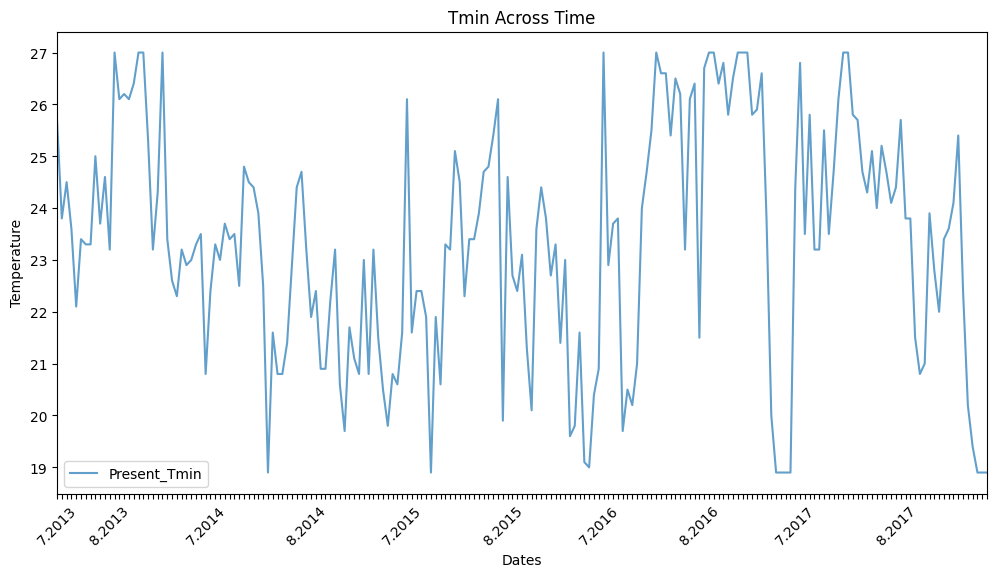

In [502]:
plot_min(S3_min)

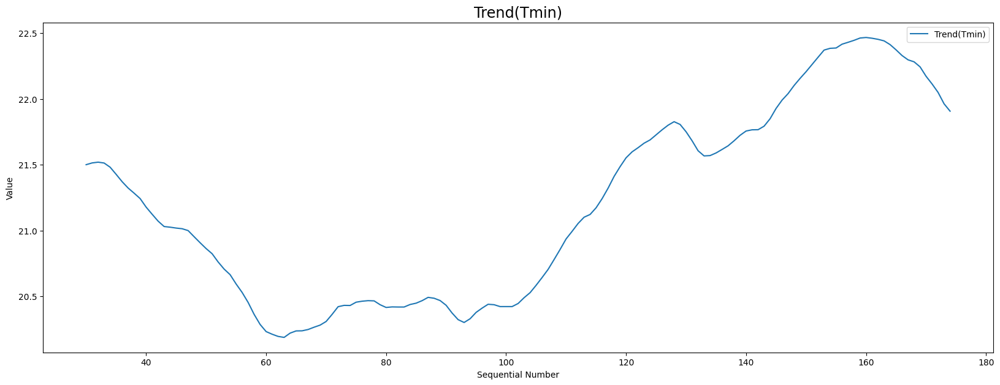

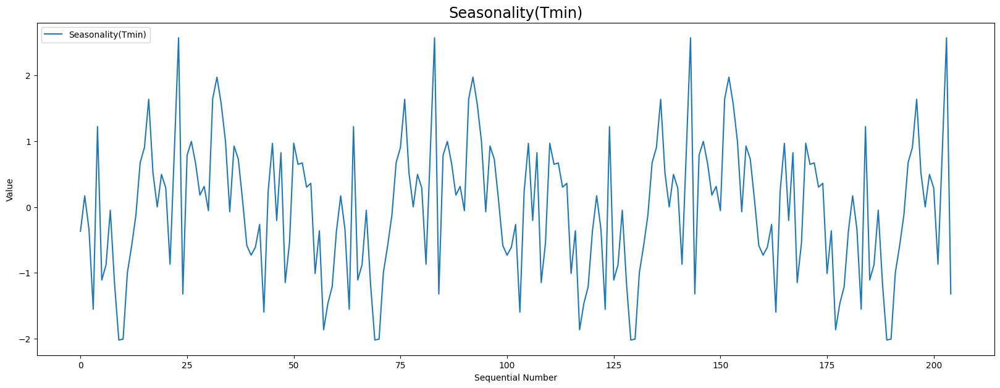

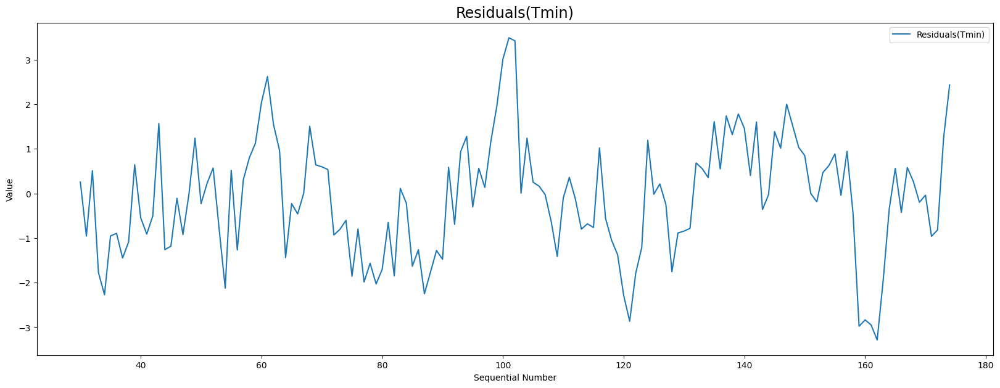

In [503]:
decomposed_min(S3_min)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the min temperature (Present_Tmin) records for the fourth weather station**

In [311]:
S4_min = df_Tmin[df_Tmin['station'] == 4.0]

In [312]:

S4_min=S4_min.drop(columns=['station'])

In [313]:
S4_min.head()

,Present_Tmin
Date,
2013-07-07,22.6
2013-07-08,24.7
2013-07-13,22.3
2013-07-14,23.8
2013-07-15,23.7


In [314]:
S4_min.nunique()

Present_Tmin    73
dtype: int64

In [ ]:
plot_min(S4_min)

In [ ]:
decomposed_min(S4_min)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


**The Data frame represents the min temperature (Present_Tmin) records for the fifth weather station**

In [315]:
S5_min = df_Tmin[df_Tmin['station'] == 5.0]

In [316]:
S5_min=S5_min.drop(columns=['station'])

In [317]:
S5_min.nunique()

Present_Tmin    74
dtype: int64

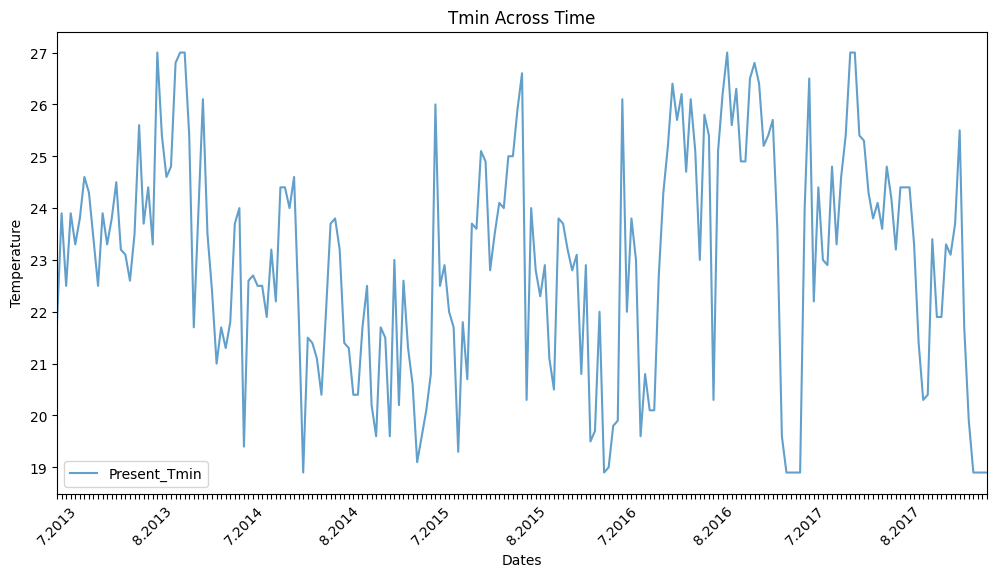

In [504]:
plot_min(S5_min)

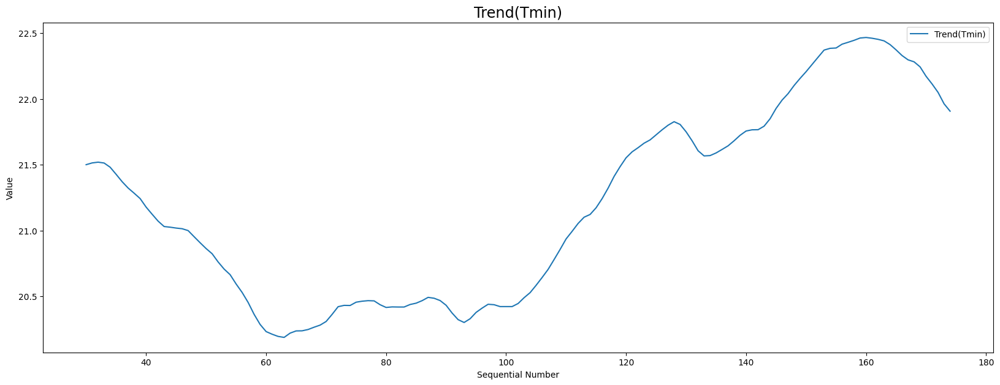

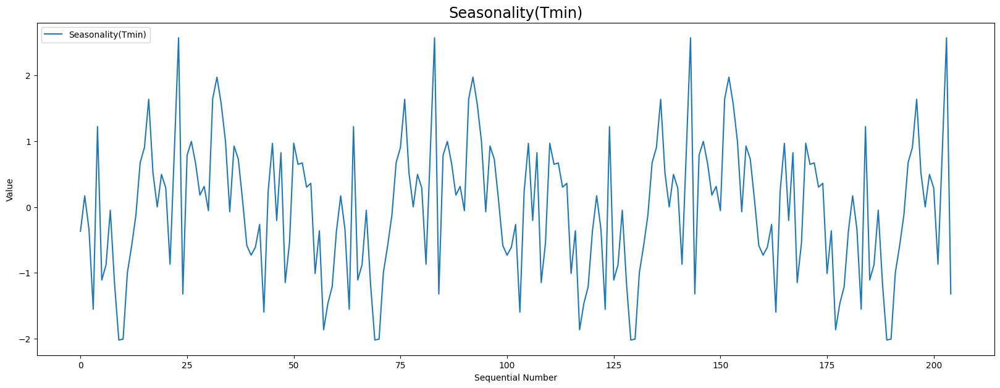

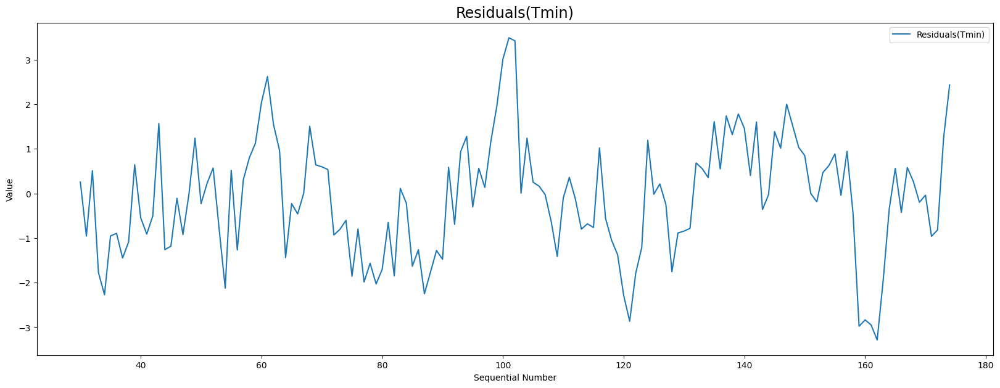

In [505]:
decomposed_min(S5_min)

### **Insights**

* Over the years, the data exhibits noticeable trends. In 2013, temperatures remained relatively stable, with minimal fluctuations. The subsequent years, 2014 and 2015, experienced a cooling trend, while 2016 saw a warming trend. In 2017, temperatures returned to a pattern reminiscent of 2013, although with slight variations. Also, we can understand the consistent cyclic patterns of temperature variations over the years, with the exception of 2014, which displayed smaller seasonal temperature fluctuations. These patterns reflect the regularity of seasonal temperature changes and have implications for seasonal planning and climate analysis.

* It seems that the temperature follows mostly the same pattern yearly, but there's some differences from year to another.


In [370]:
def make_features_min(data, lag_n):
    
    for lag in range(1, lag_n + 1):
        data[f'lag_{lag}'] = data['Present_Tmin'].shift(lag)

In [323]:
def make_features_max(data, lag_n):
    
    for lag in range(1, lag_n + 1):
        data[f'lag_{lag}'] = data['Present_Tmax'].shift(lag)

* use the temperatures from the past days (lags) to forecast the temperatures for the upcoming days.

In [324]:
def split_min(data):
    train_start_date = '2013-01-01'
    train_end_date = '2016-12-31'
    test_start_date = '2017-01-01'
    test_end_date = '2017-12-31' 

    train_set = data[train_start_date:train_end_date]
    test_set = data[test_start_date:test_end_date]

    print("Training Set Shape:", train_set.shape)
    print("Test Set Shape:", test_set.shape)
    X_train = train_set.drop(['Present_Tmin'], axis=1)
    y_train = train_set['Present_Tmin']
    X_test = test_set.drop(['Present_Tmin'], axis=1)
    y_test = test_set['Present_Tmin']
    return X_train, y_train, X_test, y_test

In [325]:
def split_max(data):
    train_start_date = '2013-01-01'
    train_end_date = '2016-12-31'
    test_start_date = '2017-01-01'
    test_end_date = '2017-12-31' 

    train_set = data[train_start_date:train_end_date]
    test_set = data[test_start_date:test_end_date]

    print("Training Set Shape:", train_set.shape)
    print("Test Set Shape:", test_set.shape)
    X_train = train_set.drop(['Present_Tmax'], axis=1)
    y_train = train_set['Present_Tmax']
    X_test = test_set.drop(['Present_Tmax'], axis=1)
    y_test = test_set['Present_Tmax']
    return X_train, y_train, X_test, y_test

* data aside 2017 is the test dataset and used the preceding dates is the training dataset.

# First Station

In [326]:
import datetime
import numpy as np

### Modeling

#### S1_min

In [337]:
make_features_min(S1_min, 10)

* we used temperatures  from the past 10 days to forecast the temperatures for the upcoming days.

In [338]:
d = S1_min[S1_min['lag_10'].isnull()]
S1_min = S1_min.drop(d.index, axis=0)
S1_min.shape

(195, 11)

In [339]:
X_train, y_train, X_test, y_test = split_min(S1_min)

Training Set Shape: (154, 11)
Test Set Shape: (41, 11)


# LinearRegression

In [340]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.5107006655827926


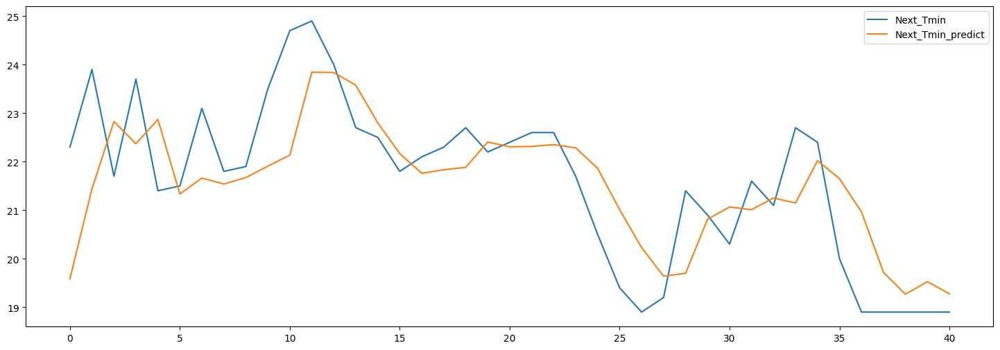

In [341]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(pred,label="Next_Tmin_predict")
plt.legend()
plt.show()

* The model has 0.51 R2 score,it explains approximately 51% of the variance in the weather data, it can capture weather patterns, such as daily temperature trends and seasonal changes. It can provide valuable insights into general weather conditions.  However, the model may struggle with extreme weather events or sudden shifts in weather patterns, as it relies on historical data to make predictions.


#### Saving model & try it

In [92]:
import joblib 
filename = 'S1_Tmin.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([22.40435186])

#### S1_max

In [215]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split  
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

In [342]:
make_features_max(S1_max, 10)

In [343]:
S1_max = S1_max.fillna(0)

In [344]:
d = S1_max[S1_max['lag_10'].isnull()]
S1_max = S1_max.drop(d.index, axis=0)
S1_max.shape

(205, 11)

In [345]:
X_train, y_train, X_test, y_test = split_max(S1_max)

Training Set Shape: (164, 11)
Test Set Shape: (41, 11)


In [346]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.09966921071625323


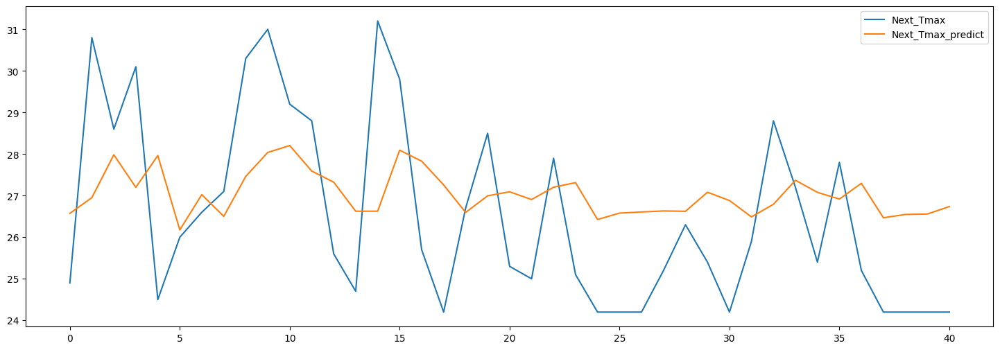

In [347]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmax")
plt.plot(pred,label="Next_Tmax_predict")
plt.legend()
plt.show()

* The model can capture some basic weather trends, but it less effective when it comes to predicting extreme weather events.

In [109]:
import joblib 
filename = 'S1Tmax.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([24.4134256])

## Station 2 :

### Modeling

### S2_min:

In [367]:
S2_min.head()

,Present_Tmin
Date,
2013-07-07,20.9
2013-07-08,23.3
2013-07-13,22.2
2013-07-14,23.3
2013-07-15,23.3


In [386]:
make_features_min(S2_min, 10)

In [372]:
S2_min = S2_min.fillna(0)

In [387]:
d = S2_min[S2_min['lag_10'].isnull()]
S2_min = S2_min.drop(d.index, axis=0)
S2_min.shape

(195, 11)

In [390]:
X_train, y_train, X_test, y_test = split_min(S2_min)

Training Set Shape: (154, 11)
Test Set Shape: (41, 11)


In [391]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.4925663486426517


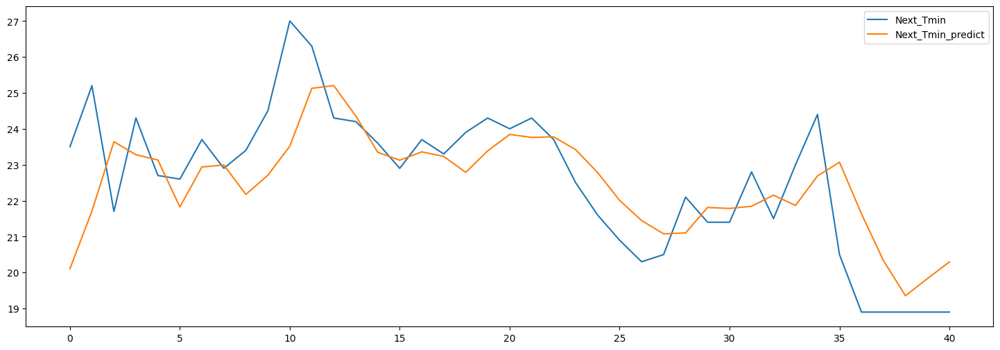

In [392]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(pred,label="Next_Tmin_predict")
plt.legend()
plt.show()

* The model has 0.50 R2 score,it explains approximately 50% of the variance in the weather data, it can capture weather patterns, such as daily temperature trends and seasonal changes. It can provide valuable insights into general weather conditions. However, the model may struggle with extreme weather events or sudden shifts in weather patterns, as it relies on historical data to make predictions.

#### Saving model:

In [120]:
import joblib 
filename = 'S2Tmin.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([22.53736208])

### S2_max:

In [121]:
S2_max.head()

,Present_Tmax
Date,
2013-07-07,28.5
2013-07-08,31.7
2013-07-13,25.2
2013-07-14,25.5
2013-07-15,28.1


In [368]:
make_features_max(S2_max, 10)

In [397]:
S2_max = S2_max.fillna(0)

In [398]:
d = S2_max[S2_max['lag_10'].isnull()]
S2_max = S2_max.drop(d.index, axis=0)
S2_max.shape

(205, 11)

In [399]:
X_train, y_train, X_test, y_test = split_max(S2_max)

Training Set Shape: (164, 11)
Test Set Shape: (41, 11)


In [400]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.10836101146121868


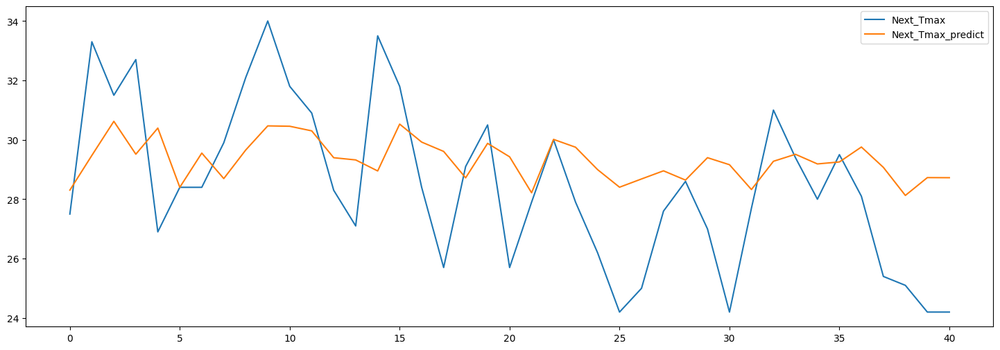

In [401]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmax")
plt.plot(pred,label="Next_Tmax_predict")
plt.legend()
plt.show()


* The model can capture some basic weather trends, but it less effective when it comes to predicting extreme weather events

In [131]:
import joblib 
filename = 'S2Tmax.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([25.8015335])

In [132]:
from IPython.display import FileLink
S2_max.to_csv('S2_max.csv', index=False)
FileLink('S2_max.csv')

C:\Users\skynet\Desktop\New folder\S2_max.csv

In [133]:
from IPython.display import FileLink
S2_min.to_csv('S2_min.csv', index=False)
FileLink('S2_min.csv')

C:\Users\skynet\Desktop\New folder\S2_min.csv

## Station 3:

### Modeling

#### S3_min

In [402]:
make_features_min(S3_min, 10)

In [403]:
d = S3_min[S3_min['lag_10'].isnull()]
S3_min = S3_min.drop(d.index, axis=0)
S3_min.shape

(195, 11)

In [404]:
X_train, y_train, X_test, y_test = split_min(S3_min)

Training Set Shape: (154, 11)
Test Set Shape: (41, 11)


# Linear regression

In [405]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.4973551665524941


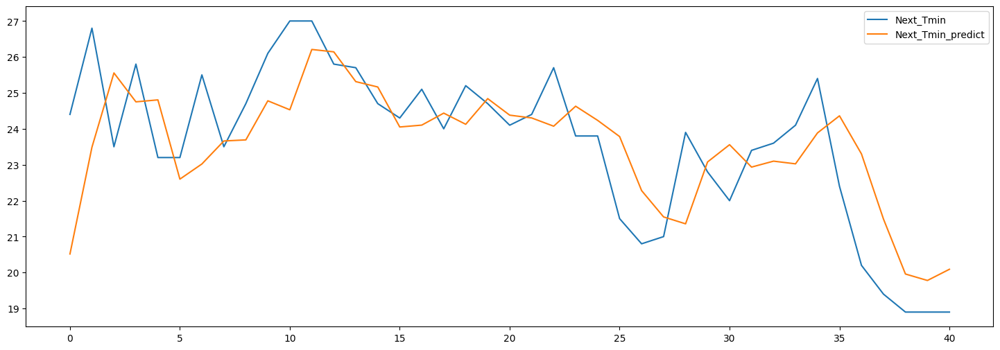

In [406]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(pred,label="Next_Tmin_predict")
plt.legend()
plt.show()

The model has nearly 0.50 R2 score,it explains approximately 50% of the variance in the weather data, it can capture weather patterns, such as daily temperature trends and seasonal changes. It can provide valuable insights into general weather conditions. However, the model may struggle with extreme weather events or sudden shifts in weather patterns, as it relies on historical data to make predictions.

#### Saving mode& try it

In [128]:
import joblib 
filename = 'S3_Tmin.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([22.93313249])

#### S3_max

In [407]:
make_features_max(S3_max, 10)
d = S3_max[S3_max['lag_10'].isnull()]
S3_max = S3_max.drop(d.index, axis=0)
X_train, y_train, X_test, y_test = split_max(S3_max)

Training Set Shape: (154, 11)
Test Set Shape: (41, 11)


#### SGD

In [506]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import cross_validate

In [507]:
sgd = make_pipeline(StandardScaler(),
                    SGDRegressor(loss='squared_loss', penalty='l2', max_iter=1000, tol=1e-3))
sgd.fit(X_train, y_train)

cv_results_min = cross_validate(sgd, X_train, y_train, cv=5, scoring=('r2', "neg_root_mean_squared_error"), return_train_score=True)

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  warnings.warn(
C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:165: FutureWarni

In [508]:
sgd_pred = sgd.predict(X_test)
r2 = r2_score(y_test, sgd_pred)
print(r2)

0.09006974571624127


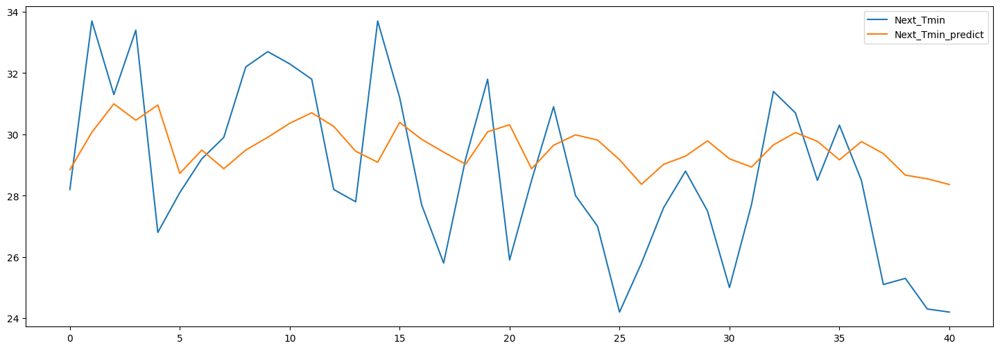

In [509]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(sgd_pred,label="Next_Tmin_predict")
plt.legend()
plt.show()

* The model can capture some basic weather trends, but it less effective when it comes to predicting extreme weather events

#### Save mode& try it

In [105]:
import joblib 
filename = 'S3_Tmax.sav'
joblib.dump(sgd, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([25.08318648])

## Station 4:

### Modeling

#### S4_min:


In [422]:
make_features_min(S4_min, 10)

In [423]:
d = S4_min[S4_min['lag_10'].isnull()]
S4_min = S4_min.drop(d.index, axis=0)
S4_min.shape

(195, 11)

In [432]:
X_train, y_train, X_test, y_test = split_min(S4_min)

Training Set Shape: (154, 11)
Test Set Shape: (41, 11)


In [433]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.49899838405202135


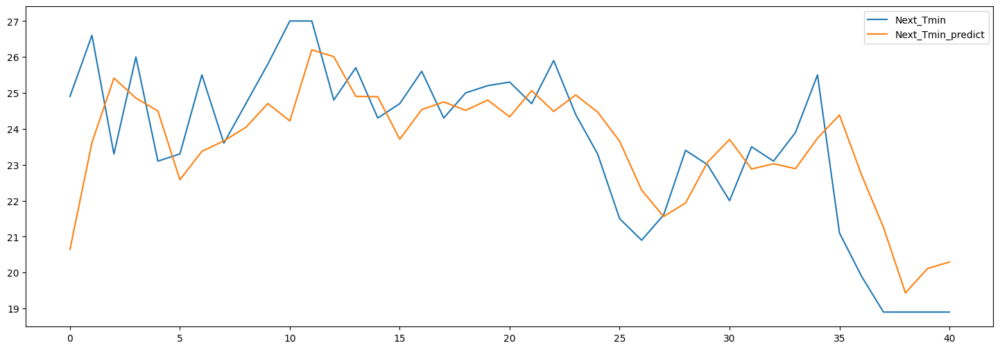

In [434]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(pred,label="Next_Tmin_predict")
plt.legend()
plt.show()


The model has nearly 0.50 R2 score,it explains approximately 50% of the variance in the weather data, it can capture weather patterns, such as daily temperature trends and seasonal changes. It can provide valuable insights into general weather conditions. However, the model may struggle with extreme weather events or sudden shifts in weather patterns, as it relies on historical data to make predictions.

### Saving Model

In [144]:
import joblib 
filename = 'S4Tmin.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([23.0206182])

#### S4_max:

In [150]:
S4_max.head()

,Present_Tmax
Date,
2013-07-07,28.7
2013-07-08,32.6
2013-07-13,26.0
2013-07-14,25.7
2013-07-15,29.3


In [428]:
make_features_max(S4_max, 10)

In [429]:
S4_max = S4_max.fillna(0)

In [430]:
d = S4_max[S4_max['lag_10'].isnull()]
S4_max = S4_max.drop(d.index, axis=0)
S4_max.shape

(205, 11)

In [435]:
X_train, y_train, X_test, y_test = split_max(S4_max)

Training Set Shape: (164, 11)
Test Set Shape: (41, 11)


In [436]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.14976986046104335


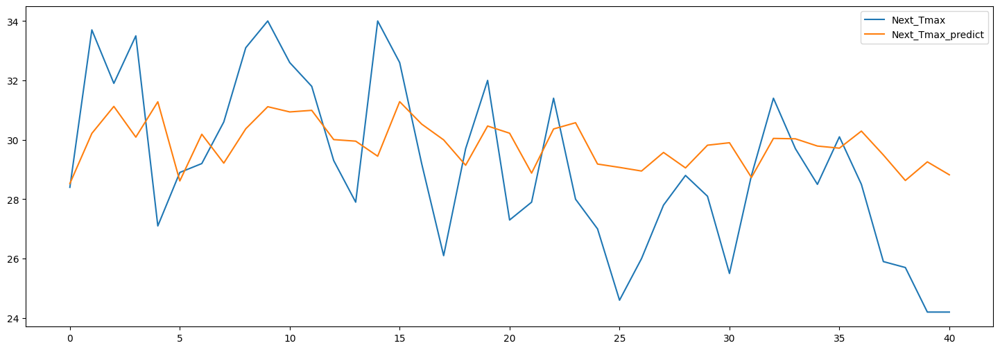

In [437]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmax")
plt.plot(pred,label="Next_Tmax_predict")
plt.legend()
plt.show()


The model can capture some basic weather trends, but it less effective when it comes to predicting extreme weather events

### Saving model


In [159]:
import joblib 
filename = 'S4Tmax.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([25.94505945])

In [160]:
from IPython.display import FileLink
S4_max.to_csv('S4_max.csv', index=False)
FileLink('S4_max.csv')

C:\Users\skynet\Desktop\New folder\S4_max.csv

In [161]:
from IPython.display import FileLink
S4_min.to_csv('S4_min.csv', index=False)
FileLink('S4_min.csv')

C:\Users\skynet\Desktop\New folder\S4_min.csv

## Station 5:

### Modeling

#### S5_min:

In [162]:
S5_min.head()

,Present_Tmin
Date,
2013-07-07,21.8
2013-07-08,23.9
2013-07-13,22.5
2013-07-14,23.9
2013-07-15,23.3


In [443]:
make_features_min(S5_min,10)

In [444]:
S5_min = S5_min.fillna(0)


In [445]:
d = S5_min[S5_min['lag_10'].isnull()]
S5_min = S5_min.drop(d.index, axis=0)
S5_min.shape

(205, 11)

In [447]:
X_train, y_train, X_test, y_test = split_min(S5_min)

Training Set Shape: (164, 11)
Test Set Shape: (41, 11)


In [448]:
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.39801854670691494


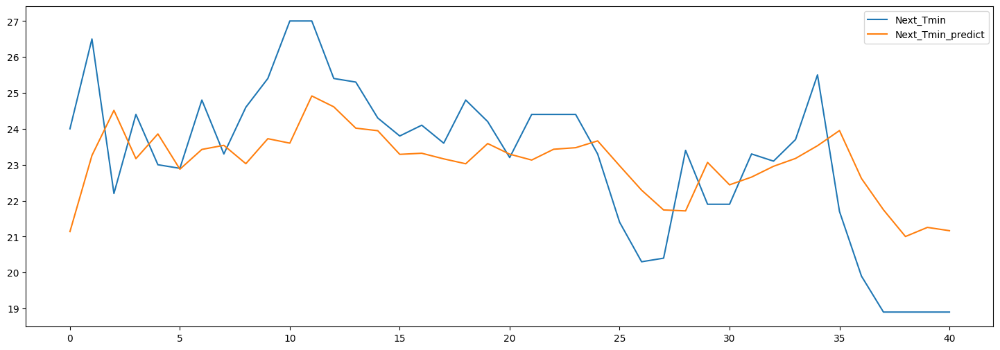

In [449]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmin")
plt.plot(pred,label="Next_Tmin_predict")
plt.legend()
plt.show()


The model can capture weather patterns, such as daily temperature trends and seasonal changes. It can provide valuable insights into general weather conditions. However, the model may struggle with extreme weather events or sudden shifts in weather patterns, as it relies on historical data to make predictions.

#### Saving Model

In [162]:
import joblib 
filename = 'S5Tmin.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\HP User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([22.91170486])

##### S5_max:

In [163]:
S5_max.head()

,Present_Tmax
Date,
2013-07-07,30.8
2013-07-08,31.8
2013-07-13,25.9
2013-07-14,26.0
2013-07-15,26.2


In [164]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split  
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

In [450]:
make_features_max(S5_max,10)

In [451]:
S5_max = S5_max.fillna(0)

In [452]:
d = S5_max[S5_max['lag_10'].isnull()]
S5_max = S5_max.drop(d.index, axis=0)
S5_max.shape

(205, 11)

In [453]:
X_train, y_train, X_test, y_test = split_max(S5_max)

Training Set Shape: (164, 11)
Test Set Shape: (41, 11)


In [454]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
pred = linear_regressor.predict(X_test)
r2 = r2_score(y_test, pred)
print("R-squared (R2):", r2)

R-squared (R2): 0.10059746404005632


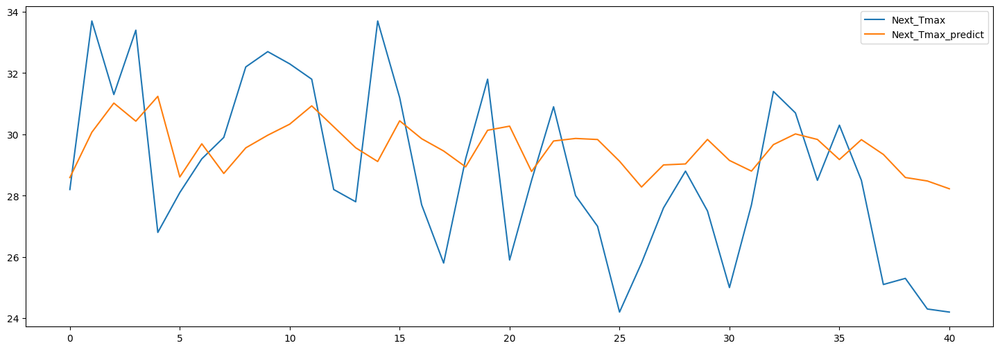

In [455]:
plt.figure(figsize=(18,6))
plt.plot(y_test.to_numpy(),label="Next_Tmax")
plt.plot(pred,label="Next_Tmax_predict")
plt.legend()
plt.show()


The model can capture some basic weather trends, but it less effective when it comes to predicting extreme weather events

#### Saving Model 

In [183]:
import joblib 
filename = 'S5Tmax.sav'
joblib.dump(linear_regressor, filename)
loaded_model = joblib.load(filename)
y_predict = loaded_model.predict([[22.7,22.3,22.1,21.8,22.5,22.7,24.0,24.9,24.7,23.5]])
y_predict

C:\Users\skynet\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([25.8015335])

In [184]:
from IPython.display import FileLink
S5_max.to_csv('S5_max.csv', index=False)
FileLink('S5_max.csv')

C:\Users\skynet\Desktop\New folder\S5_max.csv

In [185]:
from IPython.display import FileLink
S5_min.to_csv('S5_min.csv', index=False)
FileLink('S5_min.csv')

C:\Users\skynet\Desktop\New folder\S5_min.csv